# Segmentación semántica clásica comparable con U-Net preentrenada
## Método basado en SLIC + Random Forest para ortofoto multibanda y nDSM

Este notebook implementa un flujo clásico de segmentación semántica urbana basado en:

- **SLIC** para generar superpíxeles
- **Random Forest** para clasificar cada superpíxel
- **reconstrucción pixel a pixel** del raster predicho final

## Propósito metodológico

El objetivo no es solo obtener una segmentación funcional, sino construir un experimento **estrictamente comparable** con un notebook existente de **U-Net preentrenada multifuente**.

Para que la comparación sea justa, este notebook respetará el mismo contrato experimental:

- mismas clases
- mismo `ignore_index`
- mismo orden conceptual de canales
- mismo split espacial
- mismo tiling
- mismas métricas finales
- evaluación final sobre raster reconstruido a nivel de píxel

## Aclaración importante de comparabilidad

A diferencia de U-Net, el método **SLIC + Random Forest no aprende directamente a nivel píxel**.  
El modelo aprende a nivel de **superpíxel/objeto**, pero para hacer una comparación justa contra U-Net, la predicción final del método clásico debe:

1. proyectarse nuevamente a una grilla raster
2. reconstruirse **pixel a pixel**
3. evaluarse con las **mismas métricas** y bajo el **mismo split espacial**

Por tanto, aunque el mecanismo de aprendizaje sea diferente, la comparación final se hará en el mismo espacio de evaluación: **el raster de salida a resolución de píxel**.

## 1. Imports, configuración global y semillas

En esta sección se importan las librerías base, se fijan semillas para reproducibilidad y se define la configuración principal del experimento.

Se trabajará con estas decisiones obligatorias:

- clases: `0=fondo`, `1=construccion`, `2=pavimento`, `3=vegetacion`, `4=agua`
- `ignore_index = 255`
- orden conceptual multifuente: `(R, G, B, NIR, HEIGHT)`
- split espacial sobre eje `x`
- `train=0.70`, `val=0.15`, `test=0.15`
- `tile_size=256`, `stride=256`, `drop_incomplete=True`

Aunque Random Forest no exige escalamiento estricto como una red neuronal, se dejará desde el inicio una estructura clara para el tratamiento de escalas, valores inválidos y saneamiento del canal de altura.

In [1]:
# ============================================================
# 1. IMPORTS PRINCIPALES
# ============================================================

from pathlib import Path
from dataclasses import dataclass, asdict
from typing import Dict, Tuple, List, Optional, Iterable

import os
import gc
import json
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import rasterio
from rasterio.windows import Window
from rasterio.enums import Resampling

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    confusion_matrix,
    precision_recall_fscore_support,
    jaccard_score,
)

from skimage.segmentation import slic, find_boundaries
from skimage.util import img_as_float

# Visualización más cómoda en notebook
pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 200)

print("Imports cargados correctamente.")

Imports cargados correctamente.


In [10]:
from pathlib import Path

# Crear carpeta resultados en la misma ubicación del notebook
RESULTADOS_DIR = Path("resultados")
RESULTADOS_DIR.mkdir(exist_ok=True)

print("Carpeta creada en:", RESULTADOS_DIR.resolve())

Carpeta creada en: /home/jovyan/work/datos/DATOS_AJUSTADOS/resultados


In [2]:
# ============================================================
# 1.1 SEMILLAS GLOBALES DE REPRODUCIBILIDAD
# ============================================================

GLOBAL_SEED = 42

os.environ["PYTHONHASHSEED"] = str(GLOBAL_SEED)
random.seed(GLOBAL_SEED)
np.random.seed(GLOBAL_SEED)

print(f"Semilla global fijada en: {GLOBAL_SEED}")

Semilla global fijada en: 42


## 2. Contrato de clases y variables

En esta sección se define el contrato semántico del experimento.  
Esto es importante porque cualquier desviación respecto al notebook de U-Net rompería la comparabilidad.

### Clases del problema

- `0 = fondo`
- `1 = construccion`
- `2 = pavimento`
- `3 = vegetacion`
- `4 = agua`

Además:

- `ignore_index = 255`
- todas las métricas deben ignorar `255`

### Orden conceptual de canales de entrada

El orden multifuente que se respetará conceptualmente en todo el pipeline es:

`(R, G, B, NIR, HEIGHT)`

Esto no significa que SLIC necesariamente use los cinco canales directamente como imagen de segmentación.  
Sin embargo, el pipeline completo debe conservar este orden como referencia para:

- lectura de datos
- cálculo de variables
- extracción de características
- comparación con U-Net

In [3]:
# ============================================================
# 2. CONTRATO DE CLASES Y CANALES
# ============================================================

CLASS_MAP: Dict[int, str] = {
    0: "fondo",
    1: "construccion",
    2: "pavimento",
    3: "vegetacion",
    4: "agua",
}

VALID_CLASSES = [0, 1, 2, 3, 4]
IGNORE_INDEX = 255

INPUT_CHANNEL_ORDER = ("R", "G", "B", "NIR", "HEIGHT")

print("CLASS_MAP:", CLASS_MAP)
print("VALID_CLASSES:", VALID_CLASSES)
print("IGNORE_INDEX:", IGNORE_INDEX)
print("INPUT_CHANNEL_ORDER:", INPUT_CHANNEL_ORDER)

CLASS_MAP: {0: 'fondo', 1: 'construccion', 2: 'pavimento', 3: 'vegetacion', 4: 'agua'}
VALID_CLASSES: [0, 1, 2, 3, 4]
IGNORE_INDEX: 255
INPUT_CHANNEL_ORDER: ('R', 'G', 'B', 'NIR', 'HEIGHT')


## 3. Configuración centralizada del experimento

Para mantener el notebook reproducible y fácil de auditar, toda la configuración se deja agrupada en estructuras simples.

Esto incluye:

- rutas
- tiling
- split espacial
- parámetros iniciales de SLIC
- parámetros iniciales de Random Forest
- rutas de salida

La idea es que cualquier cambio importante quede explícito y no disperso por múltiples celdas.

In [4]:
# ============================================================
# 3. DATACLASSES DE CONFIGURACIÓN
# ============================================================

@dataclass(frozen=True)
class PathsConfig:
    ortho_fp: Path
    mask_fp: Path
    ndsm_fp: Path
    output_dir: Path
    cache_dir: Path

@dataclass(frozen=True)
class TileConfig:
    tile_size: int = 256
    stride: int = 256
    drop_incomplete: bool = True

@dataclass(frozen=True)
class SpatialSplitConfig:
    axis: str = "x"   # "x" = franjas verticales
    train_frac: float = 0.70
    val_frac: float = 0.15
    test_frac: float = 0.15
    gap_px: int = 0

@dataclass(frozen=True)
class SLICConfig:
    n_segments: int = 400
    compactness: float = 10.0
    sigma: float = 1.0
    start_label: int = 1
    channel_axis: int = -1

@dataclass(frozen=True)
class RFConfig:
    n_estimators: int = 300
    max_depth: Optional[int] = 30
    min_samples_leaf: int = 2
    max_features: str = "sqrt"
    class_weight: str = "balanced"
    random_state: int = GLOBAL_SEED
    n_jobs: int = -1

@dataclass(frozen=True)
class ExperimentConfig:
    ignore_index: int = IGNORE_INDEX
    valid_classes: Tuple[int, ...] = (0, 1, 2, 3, 4)
    input_channel_order: Tuple[str, ...] = ("R", "G", "B", "NIR", "HEIGHT")
    split_axis: str = "x"
    train_frac: float = 0.70
    val_frac: float = 0.15
    test_frac: float = 0.15
    gap_px: int = 0
    tile_size: int = 256
    stride: int = 256
    drop_incomplete: bool = True

    def validate(self):
        assert self.split_axis in {"x", "y"}, "split_axis debe ser 'x' o 'y'"
        total = self.train_frac + self.val_frac + self.test_frac
        assert abs(total - 1.0) < 1e-8, "train/val/test deben sumar 1.0"
        assert self.tile_size > 0, "tile_size debe ser positivo"
        assert self.stride > 0, "stride debe ser positivo"
        assert self.ignore_index == 255, "Se espera ignore_index=255 para comparabilidad"
        assert list(self.valid_classes) == [0, 1, 2, 3, 4], "Las clases válidas deben ser 0..4"

print("Dataclasses definidas correctamente.")

Dataclasses definidas correctamente.


In [5]:
# ============================================================
# 3.1 AJUSTAR RUTAS DEL EXPERIMENTO
# ============================================================

PATHS = PathsConfig(
    ortho_fp=Path("/home/jovyan/work/datos/DATOS_AJUSTADOS/orto_clip.tif"),
    mask_fp=Path("/home/jovyan/work/datos/DATOS_AJUSTADOS/mask_multiclase_v3.tif"),
    ndsm_fp=Path("/home/jovyan/work/datos/DATOS_AJUSTADOS/ndsm_clip_corr0.tif"),
    output_dir=Path("/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf"),
    cache_dir=Path("/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache"),
)

TILE_CFG = TileConfig(
    tile_size=256,
    stride=256,
    drop_incomplete=True,
)

SPLIT_CFG = SpatialSplitConfig(
    axis="x",
    train_frac=0.70,
    val_frac=0.15,
    test_frac=0.15,
    gap_px=0,
)

SLIC_CFG = SLICConfig(
    n_segments=400,
    compactness=10.0,
    sigma=1.0,
    start_label=1,
    channel_axis=-1,
)

RF_CFG = RFConfig(
    n_estimators=300,
    max_depth=30,
    min_samples_leaf=2,
    max_features="sqrt",
    class_weight="balanced",
    random_state=GLOBAL_SEED,
    n_jobs=-1,
)

EXP_CFG = ExperimentConfig(
    ignore_index=IGNORE_INDEX,
    valid_classes=tuple(VALID_CLASSES),
    input_channel_order=INPUT_CHANNEL_ORDER,
    split_axis=SPLIT_CFG.axis,
    train_frac=SPLIT_CFG.train_frac,
    val_frac=SPLIT_CFG.val_frac,
    test_frac=SPLIT_CFG.test_frac,
    gap_px=SPLIT_CFG.gap_px,
    tile_size=TILE_CFG.tile_size,
    stride=TILE_CFG.stride,
    drop_incomplete=TILE_CFG.drop_incomplete,
)

EXP_CFG.validate()

# Crear carpetas de salida
PATHS.output_dir.mkdir(parents=True, exist_ok=True)
PATHS.cache_dir.mkdir(parents=True, exist_ok=True)

print("Configuración cargada correctamente.")
print(PATHS)

Configuración cargada correctamente.
PathsConfig(ortho_fp=PosixPath('/home/jovyan/work/datos/DATOS_AJUSTADOS/orto_clip.tif'), mask_fp=PosixPath('/home/jovyan/work/datos/DATOS_AJUSTADOS/mask_multiclase_v3.tif'), ndsm_fp=PosixPath('/home/jovyan/work/datos/DATOS_AJUSTADOS/ndsm_clip_corr0.tif'), output_dir=PosixPath('/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf'), cache_dir=PosixPath('/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache'))


In [18]:
!pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [openpyxl]


In [19]:
# ============================================================
# 3.2 TABLA DE CONFIGURACIÓN DEL EXPERIMENTO
# ============================================================

config_rows = [
    ["ignore_index", EXP_CFG.ignore_index],
    ["valid_classes", EXP_CFG.valid_classes],
    ["input_channel_order", EXP_CFG.input_channel_order],
    ["split_axis", EXP_CFG.split_axis],
    ["train_frac", EXP_CFG.train_frac],
    ["val_frac", EXP_CFG.val_frac],
    ["test_frac", EXP_CFG.test_frac],
    ["gap_px", EXP_CFG.gap_px],
    ["tile_size", EXP_CFG.tile_size],
    ["stride", EXP_CFG.stride],
    ["drop_incomplete", EXP_CFG.drop_incomplete],
    ["slic_n_segments", SLIC_CFG.n_segments],
    ["slic_compactness", SLIC_CFG.compactness],
    ["slic_sigma", SLIC_CFG.sigma],
    ["rf_n_estimators", RF_CFG.n_estimators],
    ["rf_max_depth", RF_CFG.max_depth],
    ["rf_min_samples_leaf", RF_CFG.min_samples_leaf],
    ["rf_max_features", RF_CFG.max_features],
    ["rf_class_weight", RF_CFG.class_weight],
    ["random_state", GLOBAL_SEED],
]

df_config = pd.DataFrame(config_rows, columns=["parametro", "valor"])
display(df_config)

,parametro,valor
0,ignore_index,255
1,valid_classes,"(0, 1, 2, 3, 4)"
2,input_channel_order,"(R, G, B, NIR, HEIGHT)"
3,split_axis,x
4,train_frac,0.7
5,val_frac,0.15
6,test_frac,0.15
7,gap_px,0
8,tile_size,256
9,stride,256


In [21]:
df_config.to_excel(RESULTADOS_DIR / "tabla_configuracion_SLIC_v1.xlsx", index=False)

## 4. Validación de insumos

Antes de construir el pipeline, es obligatorio verificar que los tres insumos sean compatibles:

1. **ortofoto multibanda**
2. **máscara raster**
3. **nDSM**

La validación debe comprobar, como mínimo:

- existencia de archivos
- dimensiones
- número de bandas
- sistema de referencia
- transformada geoespacial
- resolución
- tipo de dato
- `nodata`
- compatibilidad espacial básica

Esto es crítico porque cualquier desalineación entre ortofoto, máscara y nDSM afectaría tanto a SLIC como a la evaluación final.

In [22]:
# ============================================================
# 4. FUNCIONES DE VALIDACIÓN Y LECTURA SEGURA
# ============================================================

def assert_file_exists(fp: Path) -> None:
    if not fp.exists():
        raise FileNotFoundError(f"No existe el archivo: {fp}")

def describe_raster(fp: Path) -> Dict:
    with rasterio.open(fp) as src:
        return {
            "path": str(fp),
            "width": src.width,
            "height": src.height,
            "count": src.count,
            "crs": str(src.crs),
            "transform": src.transform,
            "res": src.res,
            "dtypes": src.dtypes,
            "nodata": src.nodata,
            "bounds": src.bounds,
        }

def compare_spatial_compatibility(meta_a: Dict, meta_b: Dict, name_a: str, name_b: str) -> None:
    if meta_a["width"] != meta_b["width"] or meta_a["height"] != meta_b["height"]:
        raise ValueError(
            f"Incompatibilidad de dimensiones entre {name_a} y {name_b}: "
            f"{meta_a['width']}x{meta_a['height']} vs {meta_b['width']}x{meta_b['height']}"
        )

    if meta_a["crs"] != meta_b["crs"]:
        raise ValueError(
            f"Incompatibilidad de CRS entre {name_a} y {name_b}: "
            f"{meta_a['crs']} vs {meta_b['crs']}"
        )

    if meta_a["transform"] != meta_b["transform"]:
        raise ValueError(
            f"Incompatibilidad de transform entre {name_a} y {name_b}. "
            "Los rasters no están perfectamente alineados."
        )

def read_window_multiband(fp: Path, window: Window, bands: List[int]) -> np.ndarray:
    with rasterio.open(fp) as src:
        arr = src.read(bands, window=window)
    return arr

def read_window_singleband(fp: Path, window: Window, band: int = 1) -> np.ndarray:
    with rasterio.open(fp) as src:
        arr = src.read(band, window=window)
    return arr

def center_window(width: int, height: int, frac: float = 0.10, min_size: int = 256) -> Window:
    w = max(min_size, int(width * frac))
    h = max(min_size, int(height * frac))
    c0 = max(0, (width - w) // 2)
    r0 = max(0, (height - h) // 2)
    return Window(col_off=c0, row_off=r0, width=w, height=h)

print("Funciones de validación listas.")

Funciones de validación listas.


In [23]:
# ============================================================
# 4.1 VALIDAR EXISTENCIA DE ARCHIVOS
# ============================================================

assert_file_exists(PATHS.ortho_fp)
assert_file_exists(PATHS.mask_fp)
assert_file_exists(PATHS.ndsm_fp)

print("Los tres archivos existen.")
print(" - Ortofoto :", PATHS.ortho_fp)
print(" - Máscara  :", PATHS.mask_fp)
print(" - nDSM     :", PATHS.ndsm_fp)

Los tres archivos existen.
 - Ortofoto : /home/jovyan/work/datos/DATOS_AJUSTADOS/orto_clip.tif
 - Máscara  : /home/jovyan/work/datos/DATOS_AJUSTADOS/mask_multiclase_v3.tif
 - nDSM     : /home/jovyan/work/datos/DATOS_AJUSTADOS/ndsm_clip_corr0.tif


In [24]:
# ============================================================
# 4.2 DESCRIBIR RASTERS
# ============================================================

ortho_meta = describe_raster(PATHS.ortho_fp)
mask_meta  = describe_raster(PATHS.mask_fp)
ndsm_meta  = describe_raster(PATHS.ndsm_fp)

df_meta = pd.DataFrame([
    {"raster": "ortho", **ortho_meta},
    {"raster": "mask",  **mask_meta},
    {"raster": "ndsm",  **ndsm_meta},
])

display(df_meta[["raster", "width", "height", "count", "crs", "res", "dtypes", "nodata"]])

,raster,width,height,count,crs,res,dtypes,nodata
0,ortho,19589,27538,4,ESRI:103599,"(0.06024280898080917, 0.06024280898080917)","(uint16, uint16, uint16, uint16)",6.553500e+04
1,mask,19589,27538,1,ESRI:103599,"(0.06024280898080917, 0.060242808980808964)","(uint8,)",2.550000e+02
2,ndsm,19589,27538,1,ESRI:103599,"(0.06024280898080917, 0.060242808980808964)","(float32,)",-3.402823e+38


In [25]:
df_meta.to_excel(RESULTADOS_DIR / "tabla_raster_SLIC.xlsx", index=False)

In [26]:
# ============================================================
# 4.3 VALIDACIONES ESTRICTAS DE COMPATIBILIDAD
# ============================================================

# La ortofoto debe tener exactamente 4 bandas para respetar el contrato RGB+NIR
if ortho_meta["count"] != 4:
    raise ValueError(
        f"La ortofoto debe tener 4 bandas (R,G,B,NIR). Actualmente tiene {ortho_meta['count']}."
    )

# La máscara debe ser de una sola banda
if mask_meta["count"] != 1:
    raise ValueError(
        f"La máscara debe tener 1 banda. Actualmente tiene {mask_meta['count']}."
    )

# El nDSM debe ser de una sola banda
if ndsm_meta["count"] != 1:
    raise ValueError(
        f"El nDSM debe tener 1 banda. Actualmente tiene {ndsm_meta['count']}."
    )

# Compatibilidad espacial exacta
compare_spatial_compatibility(ortho_meta, mask_meta, "ortofoto", "máscara")
compare_spatial_compatibility(ortho_meta, ndsm_meta, "ortofoto", "nDSM")

print("Validación estructural completada.")
print("Los tres rasters son espacialmente compatibles.")

ValueError: Incompatibilidad de transform entre ortofoto y máscara. Los rasters no están perfectamente alineados.

falla por precisión numérica

## 5. Diagnóstico rápido de contenido y clases

En esta etapa todavía no se hace el split espacial ni el tiling definitivo.  
Solo se realiza una inspección rápida y segura para verificar que:

- la ortofoto realmente tiene contenido válido
- la máscara contiene las clases esperadas
- el nDSM contiene valores plausibles
- no hay un problema evidente de nodata, NaN o desalineación

Para no comprometer memoria, esta inspección se hará sobre una **ventana central** del raster.

In [27]:
# ============================================================
# 5. LECTURA DE UNA VENTANA CENTRAL DE DIAGNÓSTICO
# ============================================================

with rasterio.open(PATHS.ortho_fp) as src:
    diag_window = center_window(src.width, src.height, frac=0.10, min_size=256)

ortho_diag = read_window_multiband(PATHS.ortho_fp, diag_window, bands=[1, 2, 3, 4]).astype(np.float32)
mask_diag  = read_window_singleband(PATHS.mask_fp, diag_window, band=1).astype(np.int32)
ndsm_diag  = read_window_singleband(PATHS.ndsm_fp, diag_window, band=1).astype(np.float32)

print("Shapes de diagnóstico:")
print("  ortho_diag:", ortho_diag.shape)
print("  mask_diag :", mask_diag.shape)
print("  ndsm_diag :", ndsm_diag.shape)

Shapes de diagnóstico:
  ortho_diag: (4, 2753, 1958)
  mask_diag : (2753, 1958)
  ndsm_diag : (2753, 1958)


In [28]:
# ============================================================
# 5.1 REVISIÓN DE CLASES EN LA MÁSCARA
# ============================================================

unique_vals, counts_vals = np.unique(mask_diag, return_counts=True)

df_classes_diag = pd.DataFrame({
    "valor": unique_vals,
    "conteo": counts_vals
}).sort_values("valor").reset_index(drop=True)

display(df_classes_diag)

valid_plus_ignore = set(VALID_CLASSES + [IGNORE_INDEX])
found_values = set(unique_vals.tolist())

unexpected_values = sorted(found_values - valid_plus_ignore)

if len(unexpected_values) > 0:
    print("ATENCIÓN: se encontraron valores no esperados en la máscara:", unexpected_values)
else:
    print("La ventana diagnóstica solo contiene clases válidas y/o ignore_index.")

,valor,conteo
0,0,891959
1,1,3179466
2,2,1231632
3,3,87317


La ventana diagnóstica solo contiene clases válidas y/o ignore_index.


In [29]:
# ============================================================
# 5.2 REVISIÓN BÁSICA DEL NDSM
# ============================================================

ndsm_finite = ndsm_diag[np.isfinite(ndsm_diag)]

print(f"Cantidad de píxeles finitos en nDSM (ventana diagnóstica): {ndsm_finite.size:,}")

if ndsm_finite.size > 0:
    print(f"nDSM min   : {ndsm_finite.min():.4f}")
    print(f"nDSM p01   : {np.percentile(ndsm_finite, 1):.4f}")
    print(f"nDSM p50   : {np.percentile(ndsm_finite, 50):.4f}")
    print(f"nDSM p99   : {np.percentile(ndsm_finite, 99):.4f}")
    print(f"nDSM max   : {ndsm_finite.max():.4f}")
else:
    print("No hay valores finitos en la ventana diagnóstica del nDSM.")

Cantidad de píxeles finitos en nDSM (ventana diagnóstica): 5,390,374
nDSM min   : 0.0000
nDSM p01   : 0.0000
nDSM p50   : 3.5579
nDSM p99   : 8.6051
nDSM max   : 9.7630


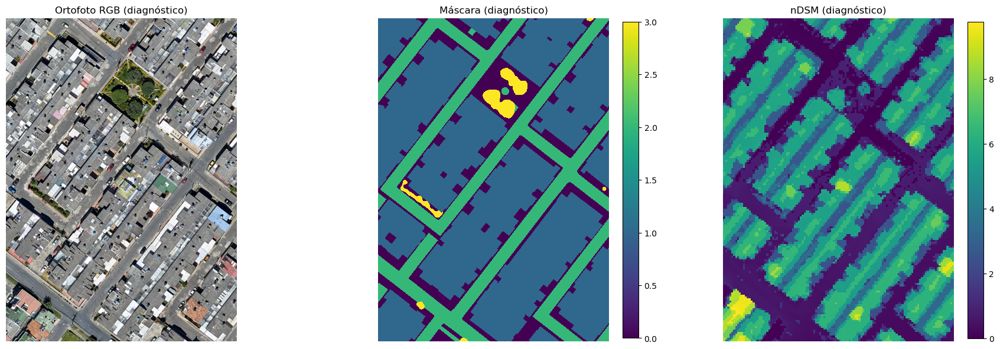

In [32]:
# ============================================================
# 5.3 VISUALIZACIÓN RÁPIDA: RGB, MÁSCARA Y nDSM
# ============================================================

def stretch_rgb(rgb: np.ndarray, p_low: float = 2, p_high: float = 98) -> np.ndarray:
    """
    Normalización simple para visualización.
    rgb: [H, W, 3]
    """
    rgb = rgb.astype(np.float32).copy()
    out = np.zeros_like(rgb, dtype=np.float32)

    for i in range(3):
        band = rgb[..., i]
        finite = np.isfinite(band)
        if finite.any():
            low = np.percentile(band[finite], p_low)
            high = np.percentile(band[finite], p_high)
            band = np.clip(band, low, high)
            band = (band - low) / (high - low + 1e-8)
        else:
            band[:] = 0.0
        out[..., i] = band

    out[~np.isfinite(out)] = 0.0
    return out

rgb_diag = ortho_diag[:3].transpose(1, 2, 0)
rgb_diag_vis = stretch_rgb(rgb_diag)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(rgb_diag_vis)
axes[0].set_title("Ortofoto RGB (diagnóstico)")
axes[0].axis("off")

im1 = axes[1].imshow(mask_diag, interpolation="nearest")
axes[1].set_title("Máscara (diagnóstico)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

im2 = axes[2].imshow(ndsm_diag, interpolation="nearest")
axes[2].set_title("nDSM (diagnóstico)")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
# Guardar en JPG
ruta_salida = RESULTADOS_DIR / "visualizacion_diagnostico_SLIC.jpg"
plt.savefig(ruta_salida, dpi=300, bbox_inches="tight")

plt.show()

## 6. Observaciones metodológicas de esta fase

Hasta este punto se ha dejado listo el marco experimental y se ha validado que los insumos sean coherentes con el contrato de comparabilidad.

### Qué queda resuelto en esta fase

- estructura reproducible del experimento
- semillas globales
- contrato de clases
- contrato de canales
- rutas centralizadas
- validación espacial de insumos
- inspección rápida de contenido
- tabla base de configuración

### Qué no se ha hecho todavía

Aún no se ha realizado:

- normalización/saneamiento formal
- split espacial definitivo
- tiling
- extracción de features
- SLIC
- entrenamiento Random Forest
- inferencia
- reconstrucción raster
- evaluación final

Eso se hará en los siguientes bloques.

In [33]:
# ============================================================
# 6. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 1 COMPLETADA")
print("- Configuración del experimento: OK")
print("- Validación de archivos: OK")
print("- Compatibilidad espacial: OK")
print("- Diagnóstico rápido de máscara: OK")
print("- Diagnóstico rápido de nDSM: OK")

# Liberar variables de diagnóstico pesadas si ya no se necesitan
del ortho_diag, mask_diag, ndsm_diag, rgb_diag, rgb_diag_vis
gc.collect()

FASE 1 COMPLETADA
- Configuración del experimento: OK
- Validación de archivos: OK
- Compatibilidad espacial: OK
- Diagnóstico rápido de máscara: OK
- Diagnóstico rápido de nDSM: OK


22389

## 7. Saneamiento, split espacial y tiling

En esta fase se construye la base espacial del experimento clásico.

### Objetivos de esta sección

1. Definir de manera explícita cómo se reparte el raster en:
   - train
   - val
   - test

2. Generar teselas con:
   - `tile_size = 256`
   - `stride = 256`
   - `drop_incomplete = True`

3. Garantizar que:
   - no haya fuga espacial entre splits
   - cada tile pertenezca completamente a un solo split
   - la máscara y los insumos multifuente se lean por ventanas
   - el experimento sea reproducible y estable en memoria

### Criterio metodológico de split

El split se hará sobre el eje `x`, es decir, mediante **franjas verticales** del raster completo:

- `train = 70%`
- `val = 15%`
- `test = 15%`
- `gap_px = 0`

### Criterio metodológico de asignación de tiles

Para evitar fuga espacial y ambigüedad en la asignación, los tiles se generarán **dentro de cada franja ya definida**, no sobre el raster completo para luego clasificarlos.

Esto implica que:

- un tile de train estará completamente contenido en la franja de train
- un tile de val estará completamente contenido en la franja de val
- un tile de test estará completamente contenido en la franja de test

Esta decisión es metodológicamente más rigurosa que usar el centro del tile para asignar split, y favorece una comparación limpia con U-Net bajo split espacial.

## 8. Normalización y saneamiento: consideraciones metodológicas

En métodos clásicos basados en árboles, como Random Forest, el escalamiento estricto de variables no es tan crítico como en redes neuronales.  
Sin embargo, sí es necesario realizar **saneamiento** de datos para controlar:

- `nodata`
- `NaN`
- infinitos
- valores extremos del nDSM
- posibles divisiones inestables al calcular NDVI

### Decisión metodológica

En este notebook se separarán dos conceptos:

1. **Saneamiento**  
   Se aplicará para garantizar que las variables derivadas sean numéricamente estables.

2. **Escalamiento/normalización de features**  
   No se aplicará por defecto al Random Forest, porque:
   - RF no depende de la escala de la misma forma que U-Net
   - mantener las variables en su escala original facilita la interpretación
   - evita introducir un paso innecesario que no suele mejorar árboles

Aun así, el notebook sí dejará explícito el tratamiento de rangos y valores inválidos, y cualquier estadístico robusto que se use deberá ajustarse **solo con train** cuando corresponda.

In [34]:
# ============================================================
# 7. FUNCIONES AUXILIARES DE SANEAMIENTO Y SPLIT ESPACIAL
# ============================================================

def safe_divide(num: np.ndarray, den: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    """
    División segura para evitar inestabilidad numérica.
    """
    num = num.astype(np.float32, copy=False)
    den = den.astype(np.float32, copy=False)
    out = num / (den + eps)
    out[~np.isfinite(out)] = 0.0
    return out.astype(np.float32, copy=False)


def compute_ndvi_from_stack(r: np.ndarray, nir: np.ndarray) -> np.ndarray:
    """
    NDVI = (NIR - R) / (NIR + R)
    """
    ndvi = safe_divide((nir - r), (nir + r), eps=1e-6)
    ndvi = np.clip(ndvi, -1.0, 1.0)
    return ndvi.astype(np.float32, copy=False)


def sanitize_float_array(arr: np.ndarray, fill_value: float = 0.0) -> np.ndarray:
    """
    Reemplaza NaN / +-inf por fill_value.
    """
    arr = arr.astype(np.float32, copy=False)
    arr = np.where(np.isfinite(arr), arr, fill_value).astype(np.float32, copy=False)
    return arr


def clip_by_percentiles(arr: np.ndarray, low: float, high: float) -> np.ndarray:
    """
    Recorte robusto por percentiles.
    """
    arr = arr.astype(np.float32, copy=False)
    finite = np.isfinite(arr)
    if not finite.any():
        return np.zeros_like(arr, dtype=np.float32)

    p_low = np.percentile(arr[finite], low)
    p_high = np.percentile(arr[finite], high)

    arr = np.clip(arr, p_low, p_high)
    arr = sanitize_float_array(arr, fill_value=0.0)
    return arr.astype(np.float32, copy=False)


def get_split_boundaries(total_size: int, train_frac: float, val_frac: float, test_frac: float, gap_px: int = 0):
    """
    Calcula límites enteros para split espacial 1D.
    Devuelve:
      train_range = [0, train_end)
      val_range   = [val_start, val_end)
      test_range  = [test_start, total_size)
    """
    assert abs((train_frac + val_frac + test_frac) - 1.0) < 1e-8, "Las fracciones deben sumar 1"

    train_end = int(round(total_size * train_frac))
    val_end = int(round(total_size * (train_frac + val_frac)))

    # Aplicación opcional de gap
    train_range = (0, max(0, train_end - gap_px))
    val_range = (min(total_size, train_end + gap_px), max(0, val_end - gap_px))
    test_range = (min(total_size, val_end + gap_px), total_size)

    return train_range, val_range, test_range


def range_length(rng: Tuple[int, int]) -> int:
    return max(0, rng[1] - rng[0])


print("Funciones auxiliares de saneamiento y split definidas.")

Funciones auxiliares de saneamiento y split definidas.


In [35]:
# ============================================================
# 7.1 INSPECCIÓN GLOBAL DEL RASTER BASE
# ============================================================

with rasterio.open(PATHS.ortho_fp) as src:
    RASTER_WIDTH = src.width
    RASTER_HEIGHT = src.height
    RASTER_TRANSFORM = src.transform
    RASTER_CRS = src.crs

print(f"Dimensiones del raster base: {RASTER_WIDTH} x {RASTER_HEIGHT}")
print(f"CRS: {RASTER_CRS}")
print(f"Transform: {RASTER_TRANSFORM}")

Dimensiones del raster base: 19589 x 27538
CRS: ESRI:103599
Transform: | 0.06, 0.00, 4960588.34|
| 0.00,-0.06, 2172054.84|
| 0.00, 0.00, 1.00|


In [36]:
# ============================================================
# 7.2 CÁLCULO FORMAL DEL SPLIT ESPACIAL EN EJE X
# ============================================================

if SPLIT_CFG.axis != "x":
    raise NotImplementedError(
        "Por comparabilidad con el experimento definido, este notebook espera split_axis='x'."
    )

train_x, val_x, test_x = get_split_boundaries(
    total_size=RASTER_WIDTH,
    train_frac=SPLIT_CFG.train_frac,
    val_frac=SPLIT_CFG.val_frac,
    test_frac=SPLIT_CFG.test_frac,
    gap_px=SPLIT_CFG.gap_px,
)

split_ranges_x = {
    "train": train_x,
    "val": val_x,
    "test": test_x,
}

df_split_ranges = pd.DataFrame([
    {"split": k, "x_ini": v[0], "x_fin": v[1], "ancho_px": range_length(v)}
    for k, v in split_ranges_x.items()
])

display(df_split_ranges)

total_split_width = sum(range_length(v) for v in split_ranges_x.values())
print(f"Suma de anchos de split: {total_split_width} px")
print(f"Ancho total raster     : {RASTER_WIDTH} px")

,split,x_ini,x_fin,ancho_px
0,train,0,13712,13712
1,val,13712,16651,2939
2,test,16651,19589,2938


Suma de anchos de split: 19589 px
Ancho total raster     : 19589 px


In [41]:
df_split_ranges.to_excel(RESULTADOS_DIR / "calculo_split_espacial_x_SLIC.xlsx", index=False)

## 9. Catálogo de tiles

En lugar de cargar el raster completo en memoria, se construirá un **catálogo de teselas**.  
Cada tesela será una ventana raster con su metadata mínima:

- split al que pertenece
- offsets `(row_off, col_off)`
- tamaño
- identificador único

### Decisión importante

Como `drop_incomplete = True`, solo se conservarán tiles que cumplan exactamente:

- `height = 256`
- `width = 256`

Esto garantiza comparabilidad con el pipeline de U-Net cuando trabaja con teselas completas y evita mezclar tiles recortados con tiles completos.

In [38]:
# ============================================================
# 9. FUNCIONES PARA GENERAR CATÁLOGO DE TILES
# ============================================================

def iter_positions_1d(start: int, end: int, tile_size: int, stride: int, drop_incomplete: bool = True):
    """
    Genera offsets 1D para tiles dentro de un rango [start, end).
    """
    pos = start
    while pos < end:
        remaining = end - pos
        if remaining < tile_size:
            if drop_incomplete:
                break
            else:
                yield pos, remaining
                break
        else:
            yield pos, tile_size
        pos += stride


def build_tile_catalog_for_split(
    split_name: str,
    x_range: Tuple[int, int],
    raster_height: int,
    tile_size: int,
    stride: int,
    drop_incomplete: bool = True
) -> pd.DataFrame:
    """
    Construye catálogo de tiles para una franja vertical definida por x_range.
    """
    rows = []

    tile_id = 0
    for row_off, h in iter_positions_1d(0, raster_height, tile_size, stride, drop_incomplete):
        for col_off, w in iter_positions_1d(x_range[0], x_range[1], tile_size, stride, drop_incomplete):
            if drop_incomplete and (h != tile_size or w != tile_size):
                continue

            tile_uid = f"{split_name}_r{row_off:06d}_c{col_off:06d}"

            rows.append({
                "tile_uid": tile_uid,
                "split": split_name,
                "row_off": int(row_off),
                "col_off": int(col_off),
                "height": int(h),
                "width": int(w),
                "tile_index_within_split": tile_id,
            })
            tile_id += 1

    return pd.DataFrame(rows)


print("Funciones de catálogo de tiles listas.")

Funciones de catálogo de tiles listas.


In [39]:
# ============================================================
# 9.1 CONSTRUCCIÓN DEL CATÁLOGO GLOBAL DE TILES
# ============================================================

df_tiles_train = build_tile_catalog_for_split(
    split_name="train",
    x_range=split_ranges_x["train"],
    raster_height=RASTER_HEIGHT,
    tile_size=TILE_CFG.tile_size,
    stride=TILE_CFG.stride,
    drop_incomplete=TILE_CFG.drop_incomplete,
)

df_tiles_val = build_tile_catalog_for_split(
    split_name="val",
    x_range=split_ranges_x["val"],
    raster_height=RASTER_HEIGHT,
    tile_size=TILE_CFG.tile_size,
    stride=TILE_CFG.stride,
    drop_incomplete=TILE_CFG.drop_incomplete,
)

df_tiles_test = build_tile_catalog_for_split(
    split_name="test",
    x_range=split_ranges_x["test"],
    raster_height=RASTER_HEIGHT,
    tile_size=TILE_CFG.tile_size,
    stride=TILE_CFG.stride,
    drop_incomplete=TILE_CFG.drop_incomplete,
)

df_tiles = pd.concat([df_tiles_train, df_tiles_val, df_tiles_test], ignore_index=True)

print("Cantidad total de tiles:", len(df_tiles))
display(df_tiles.head())

Cantidad total de tiles: 8025


,tile_uid,split,row_off,col_off,height,width,tile_index_within_split
0,train_r000000_c000000,train,0,0,256,256,0
1,train_r000000_c000256,train,0,256,256,256,1
2,train_r000000_c000512,train,0,512,256,256,2
3,train_r000000_c000768,train,0,768,256,256,3
4,train_r000000_c001024,train,0,1024,256,256,4


In [40]:
df_tiles.to_excel(RESULTADOS_DIR / "total_tiles_train_SLIC.xlsx", index=False)

In [42]:
# ============================================================
# 9.2 RESUMEN DE TILES POR SPLIT
# ============================================================

df_tiles_summary = (
    df_tiles.groupby("split")
    .agg(
        n_tiles=("tile_uid", "count"),
        min_row=("row_off", "min"),
        max_row=("row_off", "max"),
        min_col=("col_off", "min"),
        max_col=("col_off", "max"),
    )
    .reset_index()
)

display(df_tiles_summary)

,split,n_tiles,min_row,max_row,min_col,max_col
0,test,1177,0,27136,16651,19211
1,train,5671,0,27136,0,13312
2,val,1177,0,27136,13712,16272


In [43]:
df_tiles_summary.to_excel(RESULTADOS_DIR / "total_tiles_por_split_SLIC.xlsx", index=False)

## 10. Validación del catálogo de tiles

Antes de continuar, es importante comprobar que el catálogo generado cumple con:

- pertenencia a un único split
- tamaños correctos
- ausencia de tiles fuera de rango
- consistencia con `tile_size=256` y `stride=256`

Esta verificación es importante porque el resto del pipeline dependerá de este catálogo.

In [44]:
# ============================================================
# 10. VALIDACIONES DEL CATÁLOGO DE TILES
# ============================================================

assert len(df_tiles) > 0, "No se generaron tiles. Revisa dimensiones y configuración."

assert (df_tiles["height"] == TILE_CFG.tile_size).all(), "Hay tiles con altura inesperada."
assert (df_tiles["width"] == TILE_CFG.tile_size).all(), "Hay tiles con ancho inesperado."

assert df_tiles["tile_uid"].is_unique, "tile_uid no es único."

for split_name, xrng in split_ranges_x.items():
    df_tmp = df_tiles[df_tiles["split"] == split_name].copy()
    if len(df_tmp) == 0:
        print(f"Advertencia: no hay tiles para split={split_name}")
        continue

    # Todo tile debe caer completamente dentro del rango del split
    ok_cols = (
        (df_tmp["col_off"] >= xrng[0]) &
        ((df_tmp["col_off"] + df_tmp["width"]) <= xrng[1])
    )

    if not ok_cols.all():
        raise ValueError(f"Hay tiles fuera del rango x del split {split_name}")

print("Catálogo de tiles validado correctamente.")

Catálogo de tiles validado correctamente.


## 11. Lectura segura por tile

A partir de este punto, toda operación sobre los datos se hará por teselas.  
Para ello se define una función unificada que, dado un registro del catálogo, lea:

- ortofoto: bandas `(R, G, B, NIR)`
- máscara
- nDSM

Esta lectura debe preservar alineación espacial exacta entre los tres insumos.

In [45]:
# ============================================================
# 11. LECTURA UNIFICADA DE UN TILE
# ============================================================

def tile_row_to_window(tile_row: pd.Series) -> Window:
    return Window(
        col_off=int(tile_row["col_off"]),
        row_off=int(tile_row["row_off"]),
        width=int(tile_row["width"]),
        height=int(tile_row["height"]),
    )


def read_tile_data(tile_row: pd.Series):
    """
    Lee un tile completo y devuelve:
      ortho_4b: [4, H, W] float32
      mask    : [H, W] int32
      ndsm    : [H, W] float32
    """
    window = tile_row_to_window(tile_row)

    ortho_4b = read_window_multiband(PATHS.ortho_fp, window, bands=[1, 2, 3, 4]).astype(np.float32)
    mask = read_window_singleband(PATHS.mask_fp, window, band=1).astype(np.int32)
    ndsm = read_window_singleband(PATHS.ndsm_fp, window, band=1).astype(np.float32)

    return ortho_4b, mask, ndsm

In [46]:
# ============================================================
# 11.1 PRUEBA DE LECTURA SOBRE UN TILE DE CADA SPLIT
# ============================================================

for split_name in ["train", "val", "test"]:
    df_tmp = df_tiles[df_tiles["split"] == split_name]
    if len(df_tmp) == 0:
        print(f"No hay tiles para split={split_name}")
        continue

    sample_row = df_tmp.iloc[0]
    ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_row)

    print(f"\nSplit: {split_name}")
    print("tile_uid:", sample_row["tile_uid"])
    print("ortho_tile shape:", ortho_tile.shape)
    print("mask_tile shape :", mask_tile.shape)
    print("ndsm_tile shape :", ndsm_tile.shape)

    del ortho_tile, mask_tile, ndsm_tile
    gc.collect()


Split: train
tile_uid: train_r000000_c000000
ortho_tile shape: (4, 256, 256)
mask_tile shape : (256, 256)
ndsm_tile shape : (256, 256)

Split: val
tile_uid: val_r000000_c013712
ortho_tile shape: (4, 256, 256)
mask_tile shape : (256, 256)
ndsm_tile shape : (256, 256)

Split: test
tile_uid: test_r000000_c016651
ortho_tile shape: (4, 256, 256)
mask_tile shape : (256, 256)
ndsm_tile shape : (256, 256)


## 12. Saneamiento inicial por tile

Aunque la normalización final de variables derivadas se definirá más adelante, aquí se implementa el saneamiento mínimo que el pipeline necesita para ser estable.

### Se aplicará:

- reemplazo de `NaN` e infinitos
- control robusto de valores extremos del nDSM
- cálculo seguro de NDVI
- mantenimiento de tipos `float32`

### Importante

El objetivo de este bloque no es transformar todas las variables a una escala estándar, sino garantizar que:

- SLIC reciba entradas estables
- las features del Random Forest no queden contaminadas por errores numéricos
- el pipeline sea robusto con raster grande

In [47]:
# ============================================================
# 12. FUNCIONES DE SANEAMIENTO POR TILE
# ============================================================

def sanitize_tile_inputs(
    ortho_4b: np.ndarray,
    ndsm: np.ndarray,
    ndsm_clip_percentiles: Tuple[float, float] = (1.0, 99.0)
):
    """
    Sanea insumos básicos del tile.

    Parámetros
    ----------
    ortho_4b : np.ndarray
        [4, H, W] -> R,G,B,NIR
    ndsm : np.ndarray
        [H, W]

    Retorna
    -------
    dict con:
      R, G, B, NIR, HEIGHT, NDVI
    """
    ortho_4b = ortho_4b.astype(np.float32, copy=False)
    ndsm = ndsm.astype(np.float32, copy=False)

    # Separación de bandas
    r = sanitize_float_array(ortho_4b[0], fill_value=0.0)
    g = sanitize_float_array(ortho_4b[1], fill_value=0.0)
    b = sanitize_float_array(ortho_4b[2], fill_value=0.0)
    nir = sanitize_float_array(ortho_4b[3], fill_value=0.0)

    # Saneamiento robusto del nDSM
    ndsm = sanitize_float_array(ndsm, fill_value=0.0)
    ndsm = clip_by_percentiles(ndsm, low=ndsm_clip_percentiles[0], high=ndsm_clip_percentiles[1])

    # NDVI seguro
    ndvi = compute_ndvi_from_stack(r=r, nir=nir)

    return {
        "R": r.astype(np.float32, copy=False),
        "G": g.astype(np.float32, copy=False),
        "B": b.astype(np.float32, copy=False),
        "NIR": nir.astype(np.float32, copy=False),
        "HEIGHT": ndsm.astype(np.float32, copy=False),
        "NDVI": ndvi.astype(np.float32, copy=False),
    }

print("Funciones de saneamiento por tile definidas.")

Funciones de saneamiento por tile definidas.


In [48]:
# ============================================================
# 12.1 PRUEBA DE SANEAMIENTO SOBRE UN TILE DE TRAIN
# ============================================================

sample_train_row = df_tiles[df_tiles["split"] == "train"].iloc[0]
ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)

tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)

for k, v in tile_vars.items():
    print(
        f"{k:>6} | shape={v.shape} | dtype={v.dtype} | "
        f"min={np.min(v):.4f} | max={np.max(v):.4f}"
    )

del ortho_tile, mask_tile, ndsm_tile, tile_vars
gc.collect()

     R | shape=(256, 256) | dtype=float32 | min=65535.0000 | max=65535.0000
     G | shape=(256, 256) | dtype=float32 | min=65535.0000 | max=65535.0000
     B | shape=(256, 256) | dtype=float32 | min=65535.0000 | max=65535.0000
   NIR | shape=(256, 256) | dtype=float32 | min=65535.0000 | max=65535.0000
HEIGHT | shape=(256, 256) | dtype=float32 | min=-340282306073709652508363335590014353408.0000 | max=-340282306073709652508363335590014353408.0000
  NDVI | shape=(256, 256) | dtype=float32 | min=0.0000 | max=0.0000


0

## 13. Diagnóstico de contenido válido por tile

No todos los tiles tienen la misma utilidad para entrenamiento o evaluación.

Por ejemplo, un tile puede:

- contener muchos píxeles `255`
- contener muy pocos píxeles válidos
- estar casi vacío en términos de clases útiles

En esta etapa se construirá un diagnóstico ligero para cada tile, con el fin de conocer:

- cuántos píxeles válidos tiene
- cuántos píxeles `ignore_index` tiene
- qué clases aparecen
- distribución básica por split

Esto será útil más adelante para decidir si se filtran tiles de entrenamiento muy pobres o si se mantiene todo el catálogo.

In [49]:
# ============================================================
# 13. DIAGNÓSTICO DE CLASES POR TILE
# ============================================================

def summarize_mask_tile(mask: np.ndarray, valid_classes: List[int], ignore_index: int = 255) -> Dict:
    """
    Resume la máscara de un tile.
    """
    summary = {}
    total_px = mask.size

    valid_mask = np.isin(mask, valid_classes)
    ignore_mask = (mask == ignore_index)

    summary["total_px"] = int(total_px)
    summary["valid_px"] = int(valid_mask.sum())
    summary["ignore_px"] = int(ignore_mask.sum())
    summary["valid_ratio"] = float(valid_mask.mean())
    summary["ignore_ratio"] = float(ignore_mask.mean())

    for cls in valid_classes:
        summary[f"class_{cls}_px"] = int((mask == cls).sum())

    return summary


def build_tile_mask_diagnostics(df_tiles: pd.DataFrame, max_tiles: Optional[int] = None) -> pd.DataFrame:
    """
    Recorre tiles y resume contenido de máscara.
    Si max_tiles es None, procesa todos.
    """
    rows = []

    if max_tiles is None:
        iterator_df = df_tiles
    else:
        iterator_df = df_tiles.iloc[:max_tiles]

    for _, tile_row in iterator_df.iterrows():
        _, mask_tile, _ = read_tile_data(tile_row)
        summary = summarize_mask_tile(mask_tile, valid_classes=VALID_CLASSES, ignore_index=IGNORE_INDEX)

        rows.append({
            "tile_uid": tile_row["tile_uid"],
            "split": tile_row["split"],
            "row_off": tile_row["row_off"],
            "col_off": tile_row["col_off"],
            **summary
        })

        del mask_tile
        gc.collect()

    return pd.DataFrame(rows)

print("Funciones de diagnóstico por tile listas.")

Funciones de diagnóstico por tile listas.


In [50]:
# ============================================================
# 13.1 CONSTRUIR DIAGNÓSTICO GLOBAL DE TILES
# ============================================================

# Si quieres probar primero con menos tiles por seguridad, usa por ejemplo:
# df_tile_diag = build_tile_mask_diagnostics(df_tiles, max_tiles=100)

df_tile_diag = build_tile_mask_diagnostics(df_tiles, max_tiles=None)

print("Diagnóstico por tile completado.")
display(df_tile_diag.head())
print("Número de registros:", len(df_tile_diag))

Diagnóstico por tile completado.


,tile_uid,split,row_off,col_off,total_px,valid_px,ignore_px,valid_ratio,ignore_ratio,class_0_px,class_1_px,class_2_px,class_3_px,class_4_px
0,train_r000000_c000000,train,0,0,65536,0,65536,0.0,1.0,0,0,0,0,0
1,train_r000000_c000256,train,0,256,65536,0,65536,0.0,1.0,0,0,0,0,0
2,train_r000000_c000512,train,0,512,65536,0,65536,0.0,1.0,0,0,0,0,0
3,train_r000000_c000768,train,0,768,65536,0,65536,0.0,1.0,0,0,0,0,0
4,train_r000000_c001024,train,0,1024,65536,0,65536,0.0,1.0,0,0,0,0,0


Número de registros: 8025


In [51]:
# ============================================================
# 13.2 RESUMEN DE PÍXELES VÁLIDOS POR SPLIT
# ============================================================

df_valid_summary = (
    df_tile_diag.groupby("split")
    .agg(
        n_tiles=("tile_uid", "count"),
        total_px=("total_px", "sum"),
        valid_px=("valid_px", "sum"),
        ignore_px=("ignore_px", "sum"),
    )
    .reset_index()
)

df_valid_summary["valid_ratio"] = df_valid_summary["valid_px"] / df_valid_summary["total_px"]
df_valid_summary["ignore_ratio"] = df_valid_summary["ignore_px"] / df_valid_summary["total_px"]

display(df_valid_summary)

,split,n_tiles,total_px,valid_px,ignore_px,valid_ratio,ignore_ratio
0,test,1177,77135872,29535733,47600139,0.382905,0.617095
1,train,5671,371654656,203804724,167849932,0.548371,0.451629
2,val,1177,77135872,53778798,23357074,0.697196,0.302804


In [52]:
df_valid_summary.to_excel(RESULTADOS_DIR / "resumen_de_pixeles_validos_por_split_SLIC.xlsx", index=False)

In [53]:
# ============================================================
# 13.3 DISTRIBUCIÓN DE CLASES POR SPLIT
# ============================================================

class_cols = [f"class_{c}_px" for c in VALID_CLASSES]

df_class_dist = (
    df_tile_diag.groupby("split")[class_cols]
    .sum()
    .reset_index()
)

# Agregar proporciones por split respecto al total válido del split
valid_px_map = dict(zip(df_valid_summary["split"], df_valid_summary["valid_px"]))

for c in VALID_CLASSES:
    df_class_dist[f"class_{c}_ratio_over_valid"] = (
        df_class_dist[f"class_{c}_px"] / df_class_dist["split"].map(valid_px_map)
    )

display(df_class_dist)

,split,class_0_px,class_1_px,class_2_px,class_3_px,class_4_px,class_0_ratio_over_valid,class_1_ratio_over_valid,class_2_ratio_over_valid,class_3_ratio_over_valid,class_4_ratio_over_valid
0,test,14558893,4977006,8740025,1148199,111610,0.492925,0.168508,0.295914,0.038875,0.003779
1,train,82675898,68300783,46147595,6104124,576324,0.405662,0.335129,0.226430,0.029951,0.002828
2,val,23911374,15602991,13011924,1103212,149297,0.444625,0.290133,0.241953,0.020514,0.002776


In [54]:
df_class_dist.to_excel(RESULTADOS_DIR / "distribucion_de_clases_por_split_SLIC.xlsx", index=False)

## 14. Tabla de distribución de clases por split

La siguiente tabla resume la cantidad de píxeles por clase en cada partición espacial.

Esta tabla es importante porque permite verificar:

- si existe desbalance fuerte entre clases
- si el split espacial dejó representación razonable en train, val y test
- si el problema de clasificación será comparable con el experimento de U-Net

### Observación metodológica

En segmentación espacial, un split por franjas puede generar distribuciones de clase no idénticas entre particiones.  
Eso no es necesariamente un error; al contrario, puede reflejar mejor el reto real de generalización espacial.

Sin embargo, esta tabla debe revisarse cuidadosamente para evitar que:
- una clase desaparezca completamente en train
- una clase solo exista en test
- la validación quede demasiado pobre

In [55]:
# ============================================================
# 14. TABLA MÁS LEGIBLE DE DISTRIBUCIÓN DE CLASES
# ============================================================

rows = []
for _, row in df_class_dist.iterrows():
    split_name = row["split"]
    for c in VALID_CLASSES:
        rows.append({
            "split": split_name,
            "clase_id": c,
            "clase_nombre": CLASS_MAP[c],
            "pixeles": int(row[f"class_{c}_px"]),
            "proporcion_sobre_validos": float(row[f"class_{c}_ratio_over_valid"])
        })

df_class_dist_long = pd.DataFrame(rows)
display(df_class_dist_long)

,split,clase_id,clase_nombre,pixeles,proporcion_sobre_validos
0,test,0,fondo,14558893,0.492925
1,test,1,construccion,4977006,0.168508
2,test,2,pavimento,8740025,0.295914
3,test,3,vegetacion,1148199,0.038875
4,test,4,agua,111610,0.003779
5,train,0,fondo,82675898,0.405662
6,train,1,construccion,68300783,0.335129
7,train,2,pavimento,46147595,0.226430
8,train,3,vegetacion,6104124,0.029951
9,train,4,agua,576324,0.002828


In [56]:
df_class_dist_long.to_excel(RESULTADOS_DIR / "tabla_dist_clases_por_split_SLIC.xlsx", index=False)

In [57]:
conda install pyarrow

Retrieving notices: done
Channels:
 - conda-forge
Platform: linux-64
Solving environment: \ 
Note: you may need to restart the kernel to use updated packages.


In [58]:
# ============================================================
# 14.1 GUARDAR TABLAS INTERMEDIAS DE ESTA FASE
# ============================================================

tiles_catalog_fp = PATHS.cache_dir / "tiles_catalog.parquet"
tile_diag_fp = PATHS.cache_dir / "tile_mask_diagnostics.parquet"
split_summary_fp = PATHS.cache_dir / "split_valid_summary.csv"
class_dist_fp = PATHS.cache_dir / "class_distribution_by_split.csv"

df_tiles.to_parquet(tiles_catalog_fp, index=False)
df_tile_diag.to_parquet(tile_diag_fp, index=False)
df_valid_summary.to_csv(split_summary_fp, index=False)
df_class_dist_long.to_csv(class_dist_fp, index=False)

print("Archivos guardados:")
print(" -", tiles_catalog_fp)
print(" -", tile_diag_fp)
print(" -", split_summary_fp)
print(" -", class_dist_fp)

Archivos guardados:
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/tiles_catalog.parquet
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/tile_mask_diagnostics.parquet
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/split_valid_summary.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/class_distribution_by_split.csv


## 15. Visualización espacial del split y algunos tiles

Para dejar evidencia visual del contrato espacial, se puede representar:

- el raster completo de manera esquemática
- las franjas de train, val y test
- algunos tiles de ejemplo

Esto no afecta el modelo, pero sí mejora la trazabilidad metodológica del experimento.

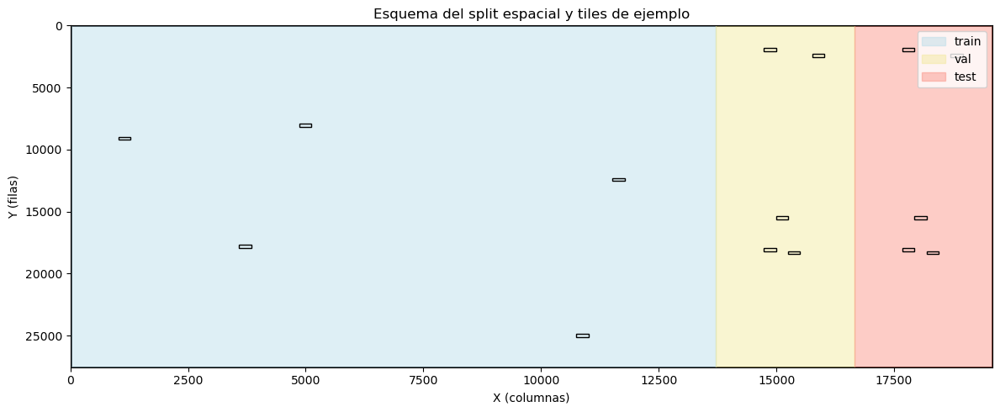

In [60]:
# ============================================================
# 15. VISUALIZACIÓN ESQUEMÁTICA DEL SPLIT ESPACIAL
# ============================================================

fig, ax = plt.subplots(figsize=(12, 5))

# Rectángulo del raster completo
ax.add_patch(plt.Rectangle((0, 0), RASTER_WIDTH, RASTER_HEIGHT, fill=False, edgecolor="black", linewidth=2))

# Franjas
colors = {"train": "lightblue", "val": "khaki", "test": "salmon"}

for split_name, (x0, x1) in split_ranges_x.items():
    ax.add_patch(
        plt.Rectangle((x0, 0), x1 - x0, RASTER_HEIGHT, color=colors[split_name], alpha=0.4, label=split_name)
    )

# Dibujar algunos tiles de ejemplo por split
for split_name in ["train", "val", "test"]:
    df_tmp = df_tiles[df_tiles["split"] == split_name].sample(
        n=min(5, len(df_tiles[df_tiles["split"] == split_name])),
        random_state=42
    )

    for _, row in df_tmp.iterrows():
        ax.add_patch(
            plt.Rectangle(
                (row["col_off"], row["row_off"]),
                row["width"],
                row["height"],
                fill=False,
                edgecolor="black",
                linewidth=1
            )
        )
ax.set_xlim(0, RASTER_WIDTH)
ax.set_ylim(RASTER_HEIGHT, 0)
ax.set_title("Esquema del split espacial y tiles de ejemplo")
ax.set_xlabel("X (columnas)")
ax.set_ylabel("Y (filas)")
ax.legend(loc="upper right")
plt.tight_layout()
ruta_salida = RESULTADOS_DIR / "esquema_del_split_espacial_y_tilesejemplo.png"
plt.savefig(ruta_salida, dpi=300, bbox_inches="tight")
plt.show()

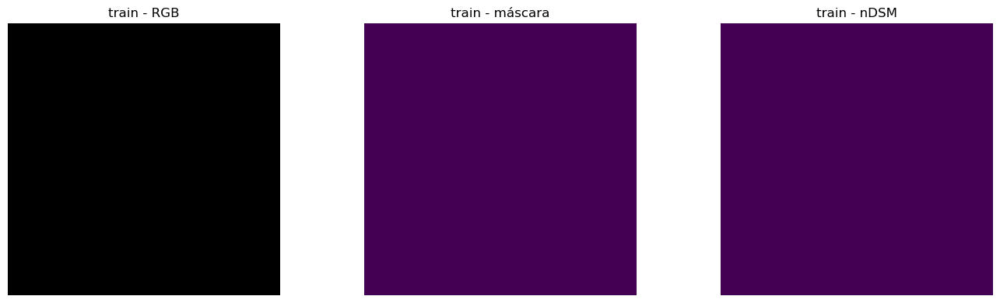

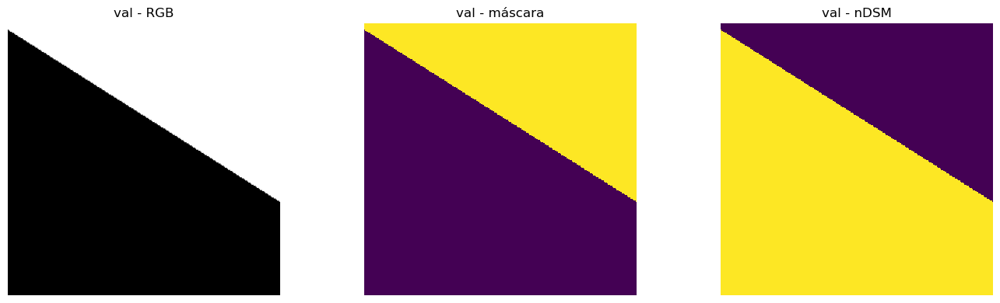

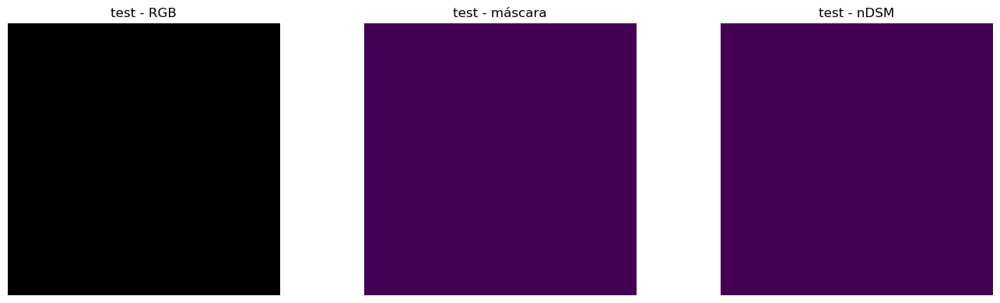

In [61]:
# ============================================================
# 15.1 VISUALIZACIÓN REAL DE UN TILE DE CADA SPLIT
# ============================================================

def visualize_sample_tile(split_name: str):
    df_tmp = df_tiles[df_tiles["split"] == split_name]
    if len(df_tmp) == 0:
        print(f"No hay tiles en split={split_name}")
        return

    tile_row = df_tmp.iloc[0]
    ortho_tile, mask_tile, ndsm_tile = read_tile_data(tile_row)

    rgb = ortho_tile[:3].transpose(1, 2, 0)
    rgb_vis = stretch_rgb(rgb)

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    axes[0].imshow(rgb_vis)
    axes[0].set_title(f"{split_name} - RGB")
    axes[0].axis("off")

    axes[1].imshow(mask_tile, interpolation="nearest")
    axes[1].set_title(f"{split_name} - máscara")
    axes[1].axis("off")

    axes[2].imshow(ndsm_tile, interpolation="nearest")
    axes[2].set_title(f"{split_name} - nDSM")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    del ortho_tile, mask_tile, ndsm_tile, rgb, rgb_vis
    gc.collect()

for split_name in ["train", "val", "test"]:
    visualize_sample_tile(split_name)

## 16. Decisiones metodológicas consolidadas de esta fase

Al finalizar esta sección, ya queda definido el espacio experimental con el que trabajará el método clásico.

### Decisiones ya fijadas

- split espacial por eje `x`
- franjas independientes para:
  - train
  - val
  - test
- tiles generados dentro de cada split
- tiles completos de `256x256`
- sin traslape (`stride=256`)
- saneamiento inicial de variables continuas
- conteo de clases por split
- persistencia de catálogos intermedios

### Implicación para la comparabilidad con U-Net

Esto permite que tanto el método clásico como U-Net operen sobre:

- la misma partición espacial
- la misma lógica de teselas
- la misma semántica de clases
- el mismo espacio de evaluación final

En otras palabras, a partir de aquí ambos métodos quedan alineados en la **geometría del experimento**, aunque difieran en su mecanismo interno de aprendizaje.

In [62]:
# ============================================================
# 16. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 2 COMPLETADA")
print("- Split espacial: OK")
print("- Catálogo de tiles: OK")
print("- Lectura por tile: OK")
print("- Saneamiento inicial: OK")
print("- Diagnóstico por tile: OK")
print("- Distribución de clases por split: OK")
print("- Persistencia intermedia: OK")

gc.collect()

FASE 2 COMPLETADA
- Split espacial: OK
- Catálogo de tiles: OK
- Lectura por tile: OK
- Saneamiento inicial: OK
- Diagnóstico por tile: OK
- Distribución de clases por split: OK
- Persistencia intermedia: OK


6431

## 17. Segmentación por superpíxeles y extracción de características

En esta fase se construye la unidad básica de aprendizaje del método clásico: el **superpíxel**.

El flujo será:

1. leer un tile
2. sanear variables continuas
3. generar superpíxeles con **SLIC**
4. resumir cada superpíxel con estadísticas espectrales y de altura
5. asignarle una clase objetivo usando la máscara del split correspondiente
6. construir una tabla de features lista para Random Forest

## Diferencia conceptual respecto a U-Net

U-Net aprende directamente una función de mapeo **píxel a píxel**.  
En cambio, el método clásico primero agrupa píxeles en regiones homogéneas y luego clasifica cada región.

Por eso, la unidad de aprendizaje en esta etapa no es el píxel, sino el **superpíxel**.  
Aun así, para mantener la comparación justa, más adelante la predicción volverá a proyectarse a una grilla raster completa y se evaluará **pixel a pixel**.

## 18. Decisión metodológica: ¿sobre qué variables aplicar SLIC?

Aunque el experimento completo utiliza el stack multifuente `(R, G, B, NIR, HEIGHT)`, no necesariamente conviene usar todas esas bandas directamente dentro de SLIC.

### Decisión adoptada

En esta versión base comparable, SLIC se aplicará sobre un stack de:

- `R`
- `G`
- `B`
- `HEIGHT`

### Justificación

Esta decisión busca un equilibrio entre:

- **comparabilidad** con U-Net multifuente
- **estabilidad numérica**
- **calidad de borde para coberturas urbanas**

### Razones

1. **RGB** aporta bordes visuales y textura radiométrica útil para delimitar cubiertas, pavimento, vegetación y agua.
2. **HEIGHT (nDSM)** aporta separación vertical entre clases con respuesta espectral parecida:
   - pavimento vs construcción
   - césped bajo vs árboles
   - superficies bajas vs objetos elevados
3. **NIR y NDVI** se conservarán como variables de clasificación del Random Forest, pero no como entrada directa a SLIC en esta versión base, porque:
   - pueden introducir redundancia espectral
   - aumentan la sensibilidad de segmentación a diferencias radiométricas finas
   - no siempre mejoran la calidad geométrica del superpíxel

### Implicación de comparabilidad

Esta decisión sigue siendo compatible con el contrato del experimento, porque:

- el pipeline completo sí usa `(R, G, B, NIR, HEIGHT)`
- `HEIGHT` se incorpora desde la etapa de segmentación
- `NIR` y `NDVI` entran en la fase de clasificación
- la evaluación final sigue siendo sobre raster reconstruido a nivel píxel

Si más adelante se desea, se puede crear una variante controlada con SLIC sobre `RGB+NIR+HEIGHT`, pero la versión base más estable para este estudio será `RGB+HEIGHT`.

In [63]:
# ============================================================
# 17. CONFIGURACIÓN ESPECÍFICA DE FEATURES Y SLIC
# ============================================================

from dataclasses import dataclass
from typing import Sequence

@dataclass(frozen=True)
class FeatureConfig:
    # Entrada para SLIC
    use_height_in_slic: bool = True
    slic_height_weight: float = 1.0  # peso relativo de HEIGHT en la imagen de segmentación

    # Estadísticas por superpíxel
    add_percentiles: bool = True
    percentiles: Tuple[int, int] = (25, 75)

    # Etiquetado supervisado
    min_valid_pixels_for_label: int = 20
    min_valid_ratio_for_label: float = 0.50
    drop_unlabeled_segments: bool = True

    # Robustez
    keep_only_finite_features: bool = True

    # Debug / rendimiento
    progress_every_n_tiles: int = 25

FEATURE_CFG = FeatureConfig(
    use_height_in_slic=True,
    slic_height_weight=1.0,
    add_percentiles=True,
    percentiles=(25, 75),
    min_valid_pixels_for_label=20,
    min_valid_ratio_for_label=0.50,
    drop_unlabeled_segments=True,
    keep_only_finite_features=True,
    progress_every_n_tiles=25,
)

print(FEATURE_CFG)

FeatureConfig(use_height_in_slic=True, slic_height_weight=1.0, add_percentiles=True, percentiles=(25, 75), min_valid_pixels_for_label=20, min_valid_ratio_for_label=0.5, drop_unlabeled_segments=True, keep_only_finite_features=True, progress_every_n_tiles=25)


## 19. Consideraciones sobre las features del Random Forest

Cada superpíxel será descrito mediante variables construidas a partir de:

- `R`
- `G`
- `B`
- `NIR`
- `HEIGHT`
- `NDVI`

Para cada variable se calcularán estadísticas robustas por superpíxel, como mínimo:

- media
- desviación estándar
- mínimo
- máximo
- mediana

Adicionalmente, en esta implementación base se incluirán:

- percentil 25
- percentil 75
- área del superpíxel en píxeles

## Decisión deliberada: no usar coordenadas absolutas

No se incluirán coordenadas absolutas `x/y` del superpíxel como features del Random Forest.

### Justificación

Bajo split espacial, incluir coordenadas absolutas podría introducir una dependencia artificial de ubicación, lo cual:

- perjudicaría la interpretación de generalización espacial
- haría menos limpia la comparación con U-Net
- permitiría al clasificador memorizar posición en vez de aprender patrones espectrales y estructurales

Por tanto, el modelo clásico se alimentará principalmente de información:

- espectral
- de altura
- de resumen estadístico local

In [64]:
# ============================================================
# 18. FUNCIONES AUXILIARES PARA NORMALIZAR IMAGEN DE SLIC
# ============================================================

def robust_minmax_scale(arr: np.ndarray, low_p: float = 2.0, high_p: float = 98.0) -> np.ndarray:
    """
    Escalamiento robusto a [0, 1] para construir la imagen de entrada a SLIC.
    Este escalamiento es solo para segmentación, no para entrenar RF.
    """
    arr = arr.astype(np.float32, copy=False)
    finite = np.isfinite(arr)

    if not finite.any():
        return np.zeros_like(arr, dtype=np.float32)

    low = np.percentile(arr[finite], low_p)
    high = np.percentile(arr[finite], high_p)

    arr = np.clip(arr, low, high)
    arr = (arr - low) / (high - low + 1e-8)
    arr = np.clip(arr, 0.0, 1.0)
    arr[~np.isfinite(arr)] = 0.0

    return arr.astype(np.float32, copy=False)


def build_slic_input_image(
    tile_vars: Dict[str, np.ndarray],
    use_height: bool = True,
    height_weight: float = 1.0
) -> np.ndarray:
    """
    Construye la imagen multicanal que se usará como entrada de SLIC.

    Por defecto:
      RGB + HEIGHT escalado robustamente a [0,1]
    """
    r = robust_minmax_scale(tile_vars["R"])
    g = robust_minmax_scale(tile_vars["G"])
    b = robust_minmax_scale(tile_vars["B"])

    channels = [r, g, b]

    if use_height:
        h = robust_minmax_scale(tile_vars["HEIGHT"]) * float(height_weight)
        h = np.clip(h, 0.0, 1.0).astype(np.float32, copy=False)
        channels.append(h)

    slic_img = np.stack(channels, axis=-1).astype(np.float32, copy=False)
    slic_img[~np.isfinite(slic_img)] = 0.0
    return slic_img

In [65]:
# ============================================================
# 18.1 EJECUTAR SLIC SOBRE UN TILE
# ============================================================

def run_slic_on_tile(
    tile_vars: Dict[str, np.ndarray],
    slic_cfg: SLICConfig,
    feature_cfg: FeatureConfig
) -> np.ndarray:
    """
    Ejecuta SLIC sobre un tile y devuelve un mapa de segmentos [H, W].
    """
    slic_img = build_slic_input_image(
        tile_vars=tile_vars,
        use_height=feature_cfg.use_height_in_slic,
        height_weight=feature_cfg.slic_height_weight
    )

    segments = slic(
        image=slic_img,
        n_segments=slic_cfg.n_segments,
        compactness=slic_cfg.compactness,
        sigma=slic_cfg.sigma,
        start_label=slic_cfg.start_label,
        channel_axis=slic_cfg.channel_axis,
        convert2lab=False,  # importante: no usar conversión LAB en stack multifuente arbitrario
        enforce_connectivity=True,
        slic_zero=False
    )

    segments = segments.astype(np.int32, copy=False)
    return segments

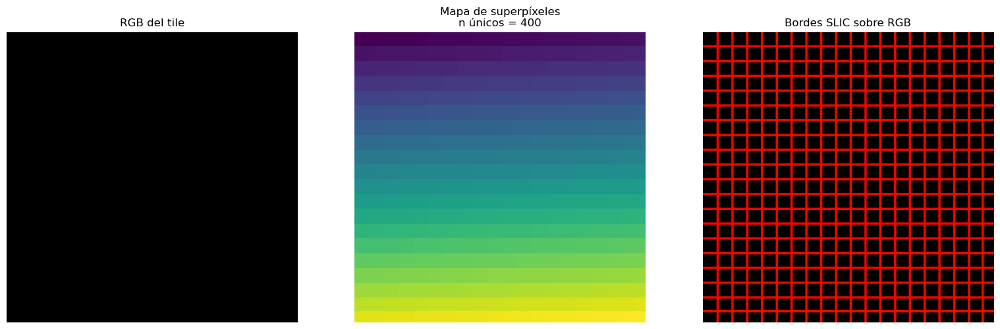

6440

In [67]:
# ============================================================
# 18.2 PRUEBA VISUAL DE SLIC EN UN TILE DE TRAIN
# ============================================================

sample_train_row = df_tiles[df_tiles["split"] == "train"].iloc[0]
ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)

tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)
segments = run_slic_on_tile(tile_vars, SLIC_CFG, FEATURE_CFG)

rgb_vis = stretch_rgb(ortho_tile[:3].transpose(1, 2, 0))
boundaries = find_boundaries(segments, mode="outer")

overlay = rgb_vis.copy()
overlay[boundaries] = [1.0, 0.0, 0.0]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(rgb_vis)
axes[0].set_title("RGB del tile")
axes[0].axis("off")

axes[1].imshow(segments, interpolation="nearest")
axes[1].set_title(f"Mapa de superpíxeles\nn únicos = {len(np.unique(segments))}")
axes[1].axis("off")

axes[2].imshow(overlay)
axes[2].set_title("Bordes SLIC sobre RGB")
axes[2].axis("off")

plt.tight_layout()
ruta_salida = RESULTADOS_DIR / "prueba_visual_SLIC_parameters_v1.png"
plt.savefig(ruta_salida, dpi=300, bbox_inches="tight")
plt.show()

del ortho_tile, mask_tile, ndsm_tile, tile_vars, segments, rgb_vis, boundaries, overlay
gc.collect()

## Diagnóstico del tile usado en la prueba SLIC

El resultado anterior sugiere que el tile seleccionado no contiene información visual útil o que la imagen usada por SLIC quedó casi constante.

En esta sección se inspeccionan los rangos reales de:

- R
- G
- B
- NIR
- HEIGHT
- máscara

Si las bandas salen casi constantes o con rango nulo, entonces el problema no está en SLIC sino en el contenido del tile seleccionado.

In [68]:
# ============================================================
# DIAGNÓSTICO DEL TILE USADO EN LA PRUEBA SLIC
# ============================================================

sample_train_row = df_tiles[df_tiles["split"] == "train"].iloc[0]
ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)

print("tile_uid:", sample_train_row["tile_uid"])
print("split:", sample_train_row["split"])
print("row_off:", sample_train_row["row_off"], "col_off:", sample_train_row["col_off"])

band_names = ["R", "G", "B", "NIR"]

for i, band_name in enumerate(band_names):
    band = ortho_tile[i].astype(np.float32)
    finite = band[np.isfinite(band)]

    print(f"\n--- Banda {band_name} ---")
    print("shape:", band.shape)
    print("dtype:", band.dtype)
    print("min:", float(np.min(finite)) if finite.size > 0 else None)
    print("max:", float(np.max(finite)) if finite.size > 0 else None)
    print("mean:", float(np.mean(finite)) if finite.size > 0 else None)
    print("std:", float(np.std(finite)) if finite.size > 0 else None)
    print("n_unique (aprox):", len(np.unique(band)))

finite_h = ndsm_tile[np.isfinite(ndsm_tile)]
print("\n--- HEIGHT / nDSM ---")
print("shape:", ndsm_tile.shape)
print("dtype:", ndsm_tile.dtype)
print("min:", float(np.min(finite_h)) if finite_h.size > 0 else None)
print("max:", float(np.max(finite_h)) if finite_h.size > 0 else None)
print("mean:", float(np.mean(finite_h)) if finite_h.size > 0 else None)
print("std:", float(np.std(finite_h)) if finite_h.size > 0 else None)

unique_mask, counts_mask = np.unique(mask_tile, return_counts=True)
print("\n--- Máscara ---")
print(pd.DataFrame({"valor": unique_mask, "conteo": counts_mask}).sort_values("valor"))

del ortho_tile, mask_tile, ndsm_tile
gc.collect()

tile_uid: train_r000000_c000000
split: train
row_off: 0 col_off: 0

--- Banda R ---
shape: (256, 256)
dtype: float32
min: 65535.0
max: 65535.0
mean: 65535.0
std: 0.0
n_unique (aprox): 1

--- Banda G ---
shape: (256, 256)
dtype: float32
min: 65535.0
max: 65535.0
mean: 65535.0
std: 0.0
n_unique (aprox): 1

--- Banda B ---
shape: (256, 256)
dtype: float32
min: 65535.0
max: 65535.0
mean: 65535.0
std: 0.0
n_unique (aprox): 1

--- Banda NIR ---
shape: (256, 256)
dtype: float32
min: 65535.0
max: 65535.0
mean: 65535.0
std: 0.0
n_unique (aprox): 1

--- HEIGHT / nDSM ---
shape: (256, 256)
dtype: float32
min: -3.4028230607370965e+38
max: -3.4028230607370965e+38
mean: -inf
std: inf

--- Máscara ---
   valor  conteo
0    255   65536


0

## 26. Corrección de nodata y selección de tiles útiles

El diagnóstico mostró que el primer tile de train corresponde a una zona sin información útil.

Valores observados:

- ortofoto: `65535` en todas las bandas
- nDSM: `-3.402823e+38`
- máscara: `255`

Esto indica que el tile pertenece a una región `nodata` o fuera del área efectiva de estudio.

### Implicación metodológica

El resultado en forma de cuadrícula no significa que SLIC esté mal parametrizado.  
Significa que fue ejecutado sobre un tile sin información válida.

### Corrección necesaria

A partir de este punto, el pipeline debe:

1. identificar y convertir sentinelas `nodata`
2. sanear correctamente ortofoto y nDSM
3. escoger tiles con contenido útil para diagnóstico visual y para extracción de features

In [69]:
# ============================================================
# 26. LEER NODATA DECLARADO EN LOS RASTERS
# ============================================================

with rasterio.open(PATHS.ortho_fp) as src:
    ORTHO_DECLARED_NODATA = src.nodata
    ORTHO_DTYPES = src.dtypes

with rasterio.open(PATHS.ndsm_fp) as src:
    NDSM_DECLARED_NODATA = src.nodata
    NDSM_DTYPE = src.dtypes[0]

with rasterio.open(PATHS.mask_fp) as src:
    MASK_DECLARED_NODATA = src.nodata
    MASK_DTYPE = src.dtypes[0]

print("ORTHO_DECLARED_NODATA:", ORTHO_DECLARED_NODATA)
print("ORTHO_DTYPES:", ORTHO_DTYPES)
print("NDSM_DECLARED_NODATA:", NDSM_DECLARED_NODATA)
print("NDSM_DTYPE:", NDSM_DTYPE)
print("MASK_DECLARED_NODATA:", MASK_DECLARED_NODATA)
print("MASK_DTYPE:", MASK_DTYPE)

ORTHO_DECLARED_NODATA: 65535.0
ORTHO_DTYPES: ('uint16', 'uint16', 'uint16', 'uint16')
NDSM_DECLARED_NODATA: -3.4028230607370965e+38
NDSM_DTYPE: float32
MASK_DECLARED_NODATA: 255.0
MASK_DTYPE: uint8


In [70]:
# ============================================================
# 26.1 DEFINIR SENTINELAS NODATA ROBUSTOS
# ============================================================

# Fallbacks observados en tu raster, por si src.nodata no viene bien declarado
ORTHO_FALLBACK_NODATA = 65535.0
NDSM_FALLBACK_NODATA = np.finfo(np.float32).min

print("ORTHO_FALLBACK_NODATA:", ORTHO_FALLBACK_NODATA)
print("NDSM_FALLBACK_NODATA:", NDSM_FALLBACK_NODATA)

ORTHO_FALLBACK_NODATA: 65535.0
NDSM_FALLBACK_NODATA: -3.4028235e+38


In [71]:
# ============================================================
# 26.2 FUNCIONES NODATA-AWARE
# ============================================================

def nodata_to_nan(arr: np.ndarray, nodata_value=None, fallback_nodata=None) -> np.ndarray:
    """
    Convierte nodata conocido a NaN.
    """
    arr = arr.astype(np.float32, copy=False)
    out = arr.copy()

    mask = np.zeros(arr.shape, dtype=bool)

    if nodata_value is not None:
        if np.isfinite(nodata_value):
            mask |= np.isclose(out, float(nodata_value))
        else:
            mask |= ~np.isfinite(out)

    if fallback_nodata is not None:
        if np.isfinite(fallback_nodata):
            mask |= np.isclose(out, float(fallback_nodata))
        else:
            mask |= ~np.isfinite(out)

    out[mask] = np.nan
    return out.astype(np.float32, copy=False)


def sanitize_float_array_preserve_nan(arr: np.ndarray) -> np.ndarray:
    """
    Mantiene NaN como NaN; solo corrige inf.
    """
    arr = arr.astype(np.float32, copy=False)
    arr[np.isposinf(arr)] = np.nan
    arr[np.isneginf(arr)] = np.nan
    return arr.astype(np.float32, copy=False)


def clip_by_percentiles_ignore_nan(arr: np.ndarray, low: float, high: float) -> np.ndarray:
    """
    Recorte robusto ignorando NaN.
    """
    arr = arr.astype(np.float32, copy=False)
    finite = np.isfinite(arr)

    if not finite.any():
        return np.full_like(arr, np.nan, dtype=np.float32)

    p_low = np.percentile(arr[finite], low)
    p_high = np.percentile(arr[finite], high)

    out = arr.copy()
    out[finite] = np.clip(out[finite], p_low, p_high)
    return out.astype(np.float32, copy=False)


def safe_divide_nan(num: np.ndarray, den: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    """
    División segura preservando NaN cuando no hay datos válidos.
    """
    num = num.astype(np.float32, copy=False)
    den = den.astype(np.float32, copy=False)

    out = np.full_like(num, np.nan, dtype=np.float32)
    valid = np.isfinite(num) & np.isfinite(den)

    out[valid] = num[valid] / (den[valid] + eps)
    out[np.isfinite(out)] = np.clip(out[np.isfinite(out)], -1e6, 1e6)

    return out.astype(np.float32, copy=False)


def compute_ndvi_nan(r: np.ndarray, nir: np.ndarray) -> np.ndarray:
    ndvi = safe_divide_nan(nir - r, nir + r, eps=1e-6)
    finite = np.isfinite(ndvi)
    ndvi[finite] = np.clip(ndvi[finite], -1.0, 1.0)
    return ndvi.astype(np.float32, copy=False)

In [72]:
# ============================================================
# 26.3 REEMPLAZAR sanitize_tile_inputs POR VERSIÓN NODATA-AWARE
# ============================================================

def sanitize_tile_inputs(
    ortho_4b: np.ndarray,
    ndsm: np.ndarray,
    ndsm_clip_percentiles: Tuple[float, float] = (1.0, 99.0)
):
    """
    Sanea insumos del tile respetando nodata.

    Convierte sentinelas a NaN, recorta nDSM de forma robusta y calcula NDVI seguro.
    """
    ortho_4b = ortho_4b.astype(np.float32, copy=False)
    ndsm = ndsm.astype(np.float32, copy=False)

    # Bandas ortofoto con manejo de nodata
    r = nodata_to_nan(ortho_4b[0], nodata_value=ORTHO_DECLARED_NODATA, fallback_nodata=ORTHO_FALLBACK_NODATA)
    g = nodata_to_nan(ortho_4b[1], nodata_value=ORTHO_DECLARED_NODATA, fallback_nodata=ORTHO_FALLBACK_NODATA)
    b = nodata_to_nan(ortho_4b[2], nodata_value=ORTHO_DECLARED_NODATA, fallback_nodata=ORTHO_FALLBACK_NODATA)
    nir = nodata_to_nan(ortho_4b[3], nodata_value=ORTHO_DECLARED_NODATA, fallback_nodata=ORTHO_FALLBACK_NODATA)

    r = sanitize_float_array_preserve_nan(r)
    g = sanitize_float_array_preserve_nan(g)
    b = sanitize_float_array_preserve_nan(b)
    nir = sanitize_float_array_preserve_nan(nir)

    # nDSM con manejo de nodata
    ndsm = nodata_to_nan(ndsm, nodata_value=NDSM_DECLARED_NODATA, fallback_nodata=NDSM_FALLBACK_NODATA)
    ndsm = sanitize_float_array_preserve_nan(ndsm)
    ndsm = clip_by_percentiles_ignore_nan(ndsm, low=ndsm_clip_percentiles[0], high=ndsm_clip_percentiles[1])

    # NDVI seguro
    ndvi = compute_ndvi_nan(r=r, nir=nir)

    return {
        "R": r.astype(np.float32, copy=False),
        "G": g.astype(np.float32, copy=False),
        "B": b.astype(np.float32, copy=False),
        "NIR": nir.astype(np.float32, copy=False),
        "HEIGHT": ndsm.astype(np.float32, copy=False),
        "NDVI": ndvi.astype(np.float32, copy=False),
    }

print("sanitize_tile_inputs fue reemplazada por la versión nodata-aware.")

sanitize_tile_inputs fue reemplazada por la versión nodata-aware.


In [73]:
# ============================================================
# 26.4 AJUSTAR ESCALAMIENTO ROBUSTO PARA IGNORAR NaN
# ============================================================

def robust_minmax_scale(arr: np.ndarray, low_p: float = 2.0, high_p: float = 98.0) -> np.ndarray:
    """
    Escalamiento robusto a [0,1] ignorando NaN.
    Para SLIC, NaN se convierte finalmente a 0 solo en la imagen de segmentación.
    """
    arr = arr.astype(np.float32, copy=False)
    finite = np.isfinite(arr)

    out = np.zeros_like(arr, dtype=np.float32)

    if not finite.any():
        return out

    low = np.percentile(arr[finite], low_p)
    high = np.percentile(arr[finite], high_p)

    tmp = arr.copy()
    tmp[finite] = np.clip(tmp[finite], low, high)
    tmp[finite] = (tmp[finite] - low) / (high - low + 1e-8)
    tmp[finite] = np.clip(tmp[finite], 0.0, 1.0)

    out[finite] = tmp[finite]
    out[~finite] = 0.0

    return out.astype(np.float32, copy=False)

print("robust_minmax_scale actualizada para ignorar NaN.")

robust_minmax_scale actualizada para ignorar NaN.


## 27. Selección de un tile útil para inspección visual

Ya no se usará el primer tile del split, porque puede caer en una zona completamente nodata.

En su lugar se escogerá un tile de train con:

- alta proporción de píxeles válidos
- presencia de construcción
- varias clases presentes

In [74]:
# ============================================================
# 27. SELECCIONAR TILE ÚTIL DE TRAIN
# ============================================================

df_train_diag = df_tile_diag[df_tile_diag["split"] == "train"].copy()

class_cols = [f"class_{c}_px" for c in VALID_CLASSES]
df_train_diag["n_classes_present"] = (df_train_diag[class_cols] > 0).sum(axis=1)

df_train_diag = df_train_diag.sort_values(
    by=["valid_ratio", "class_1_px", "n_classes_present"],
    ascending=[False, False, False]
).reset_index(drop=True)

display(df_train_diag.head(10)[[
    "tile_uid", "valid_ratio", "ignore_ratio", "n_classes_present",
    "class_0_px", "class_1_px", "class_2_px", "class_3_px", "class_4_px"
]])

,tile_uid,valid_ratio,ignore_ratio,n_classes_present,class_0_px,class_1_px,class_2_px,class_3_px,class_4_px
0,train_r007424_c010240,1.0,0.0,1,0,65536,0,0,0
1,train_r008448_c013312,1.0,0.0,1,0,65536,0,0,0
2,train_r010240_c008192,1.0,0.0,1,0,65536,0,0,0
3,train_r012288_c010240,1.0,0.0,1,0,65536,0,0,0
4,train_r012800_c008448,1.0,0.0,1,0,65536,0,0,0
5,train_r013056_c012032,1.0,0.0,1,0,65536,0,0,0
6,train_r013312_c008704,1.0,0.0,1,0,65536,0,0,0
7,train_r014080_c010240,1.0,0.0,1,0,65536,0,0,0
8,train_r014592_c007680,1.0,0.0,1,0,65536,0,0,0
9,train_r014848_c011776,1.0,0.0,1,0,65536,0,0,0


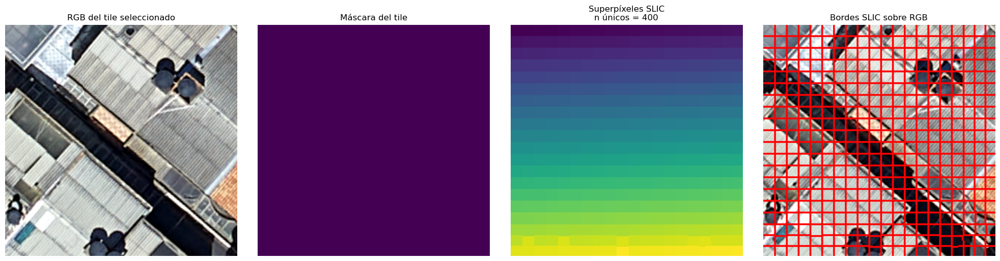

In [75]:
# ============================================================
# 27.1 PROBAR SLIC SOBRE UN TILE REPRESENTATIVO
# ============================================================

best_tile_uid = df_train_diag.iloc[0]["tile_uid"]
sample_train_row = df_tiles[df_tiles["tile_uid"] == best_tile_uid].iloc[0]

ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)
tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)
segments = run_slic_on_tile(tile_vars, SLIC_CFG, FEATURE_CFG)

rgb_vis = stretch_rgb(np.nan_to_num(ortho_tile[:3].transpose(1, 2, 0), nan=0.0))
boundaries = find_boundaries(segments, mode="outer")

overlay = rgb_vis.copy()
overlay[boundaries] = [1.0, 0.0, 0.0]

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(rgb_vis)
axes[0].set_title("RGB del tile seleccionado")
axes[0].axis("off")

axes[1].imshow(mask_tile, interpolation="nearest")
axes[1].set_title("Máscara del tile")
axes[1].axis("off")

axes[2].imshow(segments, interpolation="nearest")
axes[2].set_title(f"Superpíxeles SLIC\nn únicos = {len(np.unique(segments))}")
axes[2].axis("off")

axes[3].imshow(overlay)
axes[3].set_title("Bordes SLIC sobre RGB")
axes[3].axis("off")

plt.tight_layout()
plt.show()

## 28. Ajuste controlado de SLIC

La inspección visual muestra que la configuración base de SLIC aún genera superpíxeles demasiado regulares.

Esto sugiere que:

- `compactness=10.0` es demasiado alto para este caso
- conviene comparar configuraciones alternativas sobre el mismo tile

### Estrategia

Se probarán tres configuraciones:

1. **Base**: `RGB + HEIGHT`, `compactness=10`
2. **Variante A**: `RGB + HEIGHT`, `compactness` bajo
3. **Variante B**: `RGB`, `compactness` bajo

La meta es escoger la variante cuyos bordes:

- se adapten mejor a techos, calles y sombras
- dejen de comportarse como una rejilla regular
- mantengan estabilidad visual

In [79]:
# ============================================================
# 28. CONFIGURACIONES DE PRUEBA PARA SLIC
# ============================================================

SLIC_TRIALS = {
    "base_rgb_height_c10": {
        "n_segments": 400,
        "compactness": 10.0,
        "sigma": 1.0,
        "use_height": True,
        "height_weight": 1.0,
        "convert2lab": False,
    },
    "trial_rgb_height_c3": {
        "n_segments": 500,
        "compactness": 3.0,
        "sigma": 1.0,
        "use_height": True,
        "height_weight": 1.0,
        "convert2lab": False,
    },
    "trial_rgb_only_c1": {
        "n_segments": 500,
        "compactness": 1.0,
        "sigma": 1.0,
        "use_height": False,
        "height_weight": 0.0,
        "convert2lab": True,
    },
}

pd.DataFrame(SLIC_TRIALS).T
# Convertir el diccionario SLIC_TRIALS en DataFrame
df_slic_trials = pd.DataFrame(SLIC_TRIALS).T

# Agregar nombre al índice
df_slic_trials.index.name = "configuracion"

# Mostrar en notebook
display(df_slic_trials)

# Exportar a Excel
ruta_excel = RESULTADOS_DIR / "configuraciones_prueba_slic_v2_v3_v4.xlsx"
df_slic_trials.to_excel(ruta_excel)

,n_segments,compactness,sigma,use_height,height_weight,convert2lab
configuracion,,,,,,
base_rgb_height_c10,400,10.0,1.0,True,1.0,False
trial_rgb_height_c3,500,3.0,1.0,True,1.0,False
trial_rgb_only_c1,500,1.0,1.0,False,0.0,True


In [80]:
# ============================================================
# 28.1 FUNCIÓN FLEXIBLE PARA PROBAR VARIANTES DE SLIC
# ============================================================

def build_slic_input_image_custom(
    tile_vars: Dict[str, np.ndarray],
    use_height: bool = True,
    height_weight: float = 1.0
) -> np.ndarray:
    """
    Construye la imagen para SLIC:
    - RGB escalado robustamente
    - opcionalmente HEIGHT como canal adicional
    """
    r = robust_minmax_scale(tile_vars["R"])
    g = robust_minmax_scale(tile_vars["G"])
    b = robust_minmax_scale(tile_vars["B"])

    channels = [r, g, b]

    if use_height:
        h = robust_minmax_scale(tile_vars["HEIGHT"]) * float(height_weight)
        h = np.clip(h, 0.0, 1.0).astype(np.float32, copy=False)
        channels.append(h)

    slic_img = np.stack(channels, axis=-1).astype(np.float32, copy=False)
    slic_img[~np.isfinite(slic_img)] = 0.0
    return slic_img


def run_slic_custom(
    tile_vars: Dict[str, np.ndarray],
    n_segments: int,
    compactness: float,
    sigma: float,
    use_height: bool,
    height_weight: float,
    convert2lab: bool
) -> np.ndarray:
    """
    Ejecuta SLIC con parámetros flexibles.
    """
    slic_img = build_slic_input_image_custom(
        tile_vars=tile_vars,
        use_height=use_height,
        height_weight=height_weight
    )

    segments = slic(
        image=slic_img,
        n_segments=n_segments,
        compactness=compactness,
        sigma=sigma,
        start_label=1,
        channel_axis=-1,
        convert2lab=convert2lab,
        enforce_connectivity=True,
        slic_zero=False
    )

    return segments.astype(np.int32, copy=False)

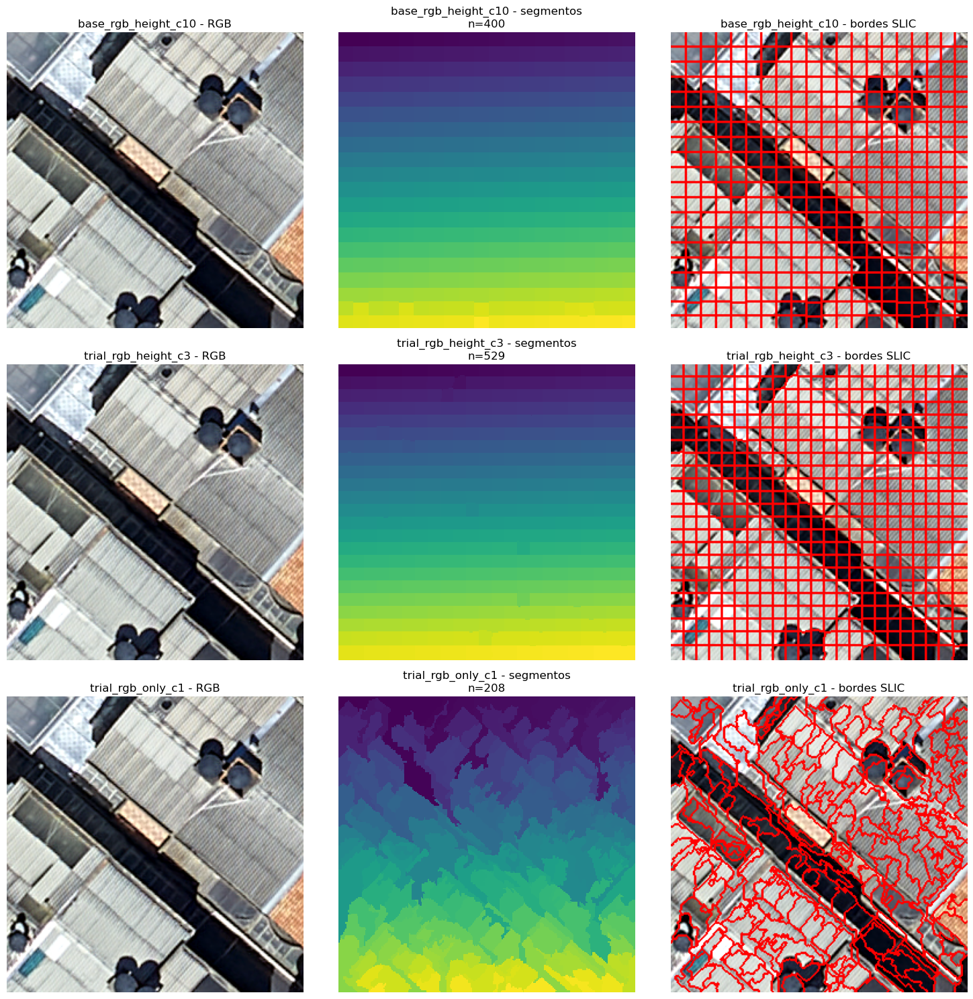

18929

In [82]:
# ============================================================
# 28.2 VISUALIZAR VARIANTES DE SLIC SOBRE EL MISMO TILE
# ============================================================

# Usamos el mejor tile seleccionado previamente
best_tile_uid = df_train_diag.iloc[0]["tile_uid"]
sample_train_row = df_tiles[df_tiles["tile_uid"] == best_tile_uid].iloc[0]

ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)
tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)

rgb_vis = stretch_rgb(np.nan_to_num(ortho_tile[:3].transpose(1, 2, 0), nan=0.0))

fig, axes = plt.subplots(len(SLIC_TRIALS), 3, figsize=(15, 5 * len(SLIC_TRIALS)))

if len(SLIC_TRIALS) == 1:
    axes = np.array([axes])

for i, (trial_name, cfg) in enumerate(SLIC_TRIALS.items()):
    segments = run_slic_custom(
        tile_vars=tile_vars,
        n_segments=cfg["n_segments"],
        compactness=cfg["compactness"],
        sigma=cfg["sigma"],
        use_height=cfg["use_height"],
        height_weight=cfg["height_weight"],
        convert2lab=cfg["convert2lab"]
    )

    boundaries = find_boundaries(segments, mode="outer")
    overlay = rgb_vis.copy()
    overlay[boundaries] = [1.0, 0.0, 0.0]

    axes[i, 0].imshow(rgb_vis)
    axes[i, 0].set_title(f"{trial_name} - RGB")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(segments, interpolation="nearest")
    axes[i, 1].set_title(f"{trial_name} - segmentos\nn={len(np.unique(segments))}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title(f"{trial_name} - bordes SLIC")
    axes[i, 2].axis("off")

plt.tight_layout()
ruta_salida = RESULTADOS_DIR / "visualizacion_configuracion_v2_v3_v4.png"
plt.savefig(ruta_salida, dpi=300, bbox_inches="tight")
plt.show()

del ortho_tile, mask_tile, ndsm_tile, tile_vars, rgb_vis
gc.collect()

Eso no significa que el nDSM no sirva.
Significa que:

para la etapa de segmentación geométrica con SLIC, el RGB está delimitando mejor los bordes
mientras que el nDSM sigue siendo muy valioso como feature del Random Forest

## 29. Criterio para escoger la configuración final de SLIC

La configuración elegida debe cumplir, visualmente, con lo siguiente:

### Señales positivas
- los bordes siguen parcialmente techos y calles
- las sombras dejan de ser atravesadas por una rejilla tan rígida
- los superpíxeles ya no parecen una malla casi uniforme
- hay adaptación local a la escena

### Señales negativas
- la imagen sigue viéndose como cuadrícula
- los segmentos ignoran completamente los bordes urbanos
- la sobresegmentación es excesiva y rompe demasiado los objetos

### Decisión metodológica esperada

Se elegirá la configuración más razonable en términos de:
- adaptación geométrica
- estabilidad
- interpretabilidad

No es necesario optimizar SLIC al extremo; basta con una configuración técnicamente defendible y claramente mejor que la base.

## 20. Etiquetado de superpíxeles

Para entrenar el Random Forest, cada superpíxel debe tener una clase objetivo.

### Regla de etiquetado

La etiqueta del superpíxel se asignará con base en la **clase mayoritaria** dentro de la máscara raster del mismo tile, con estas reglas:

1. se ignoran los píxeles con valor `255`
2. solo se consideran clases válidas `0, 1, 2, 3, 4`
3. si un superpíxel tiene muy pocos píxeles válidos, se descarta para entrenamiento
4. si la proporción válida dentro del superpíxel es demasiado baja, también se descarta

### Justificación

Esto evita que superpíxeles muy contaminados por `ignore_index` o por mezcla excesiva de etiquetas introduzcan ruido supervisado innecesario.

### Condición de no fuga

La etiqueta del superpíxel se calcula únicamente a partir de la máscara del tile que pertenece al split correspondiente:

- train usa solo train
- val usa solo val
- test no se usa para ajustar el modelo

Con esto se mantiene el contrato de no usar información de test en decisiones de entrenamiento.

In [83]:
# ============================================================
# 19. FUNCIONES AUXILIARES DE ESTADÍSTICAS POR SUPERPÍXEL
# ============================================================

def compute_basic_stats(values: np.ndarray, add_percentiles: bool = True, percentiles: Tuple[int, int] = (25, 75)) -> Dict[str, float]:
    """
    Calcula estadísticas descriptivas robustas sobre un vector 1D.
    """
    values = values.astype(np.float32, copy=False)
    values = values[np.isfinite(values)]

    if values.size == 0:
        out = {
            "mean": np.nan,
            "std": np.nan,
            "min": np.nan,
            "max": np.nan,
            "median": np.nan,
        }
        if add_percentiles:
            out[f"p{percentiles[0]}"] = np.nan
            out[f"p{percentiles[1]}"] = np.nan
        return out

    out = {
        "mean": float(np.mean(values)),
        "std": float(np.std(values)),
        "min": float(np.min(values)),
        "max": float(np.max(values)),
        "median": float(np.median(values)),
    }

    if add_percentiles:
        out[f"p{percentiles[0]}"] = float(np.percentile(values, percentiles[0]))
        out[f"p{percentiles[1]}"] = float(np.percentile(values, percentiles[1]))

    return out


def assign_majority_label_to_segment(
    mask_values: np.ndarray,
    valid_classes: Sequence[int],
    ignore_index: int,
    min_valid_pixels: int,
    min_valid_ratio: float
) -> Dict[str, object]:
    """
    Asigna etiqueta por mayoría a un superpíxel.
    """
    total_pixels = int(mask_values.size)

    valid_mask = np.isin(mask_values, valid_classes)
    valid_values = mask_values[valid_mask]

    valid_pixels = int(valid_values.size)
    valid_ratio = float(valid_pixels / total_pixels) if total_pixels > 0 else 0.0

    if valid_pixels < min_valid_pixels or valid_ratio < min_valid_ratio:
        return {
            "target": None,
            "target_name": None,
            "is_labeled": False,
            "valid_label_pixels": valid_pixels,
            "valid_label_ratio": valid_ratio,
        }

    counts = np.bincount(valid_values.astype(np.int32), minlength=max(valid_classes) + 1)
    target = int(np.argmax(counts))

    return {
        "target": target,
        "target_name": CLASS_MAP[target],
        "is_labeled": True,
        "valid_label_pixels": valid_pixels,
        "valid_label_ratio": valid_ratio,
    }

In [84]:
# ============================================================
# 19.1 EXTRAER FEATURES DE UN TILE YA SEGMENTADO
# ============================================================

def extract_superpixel_features_from_tile(
    tile_row: pd.Series,
    slic_cfg: SLICConfig,
    feature_cfg: FeatureConfig,
    assign_target: bool = True
) -> Tuple[pd.DataFrame, np.ndarray]:
    """
    Procesa un tile completo:
      1) lectura
      2) saneamiento
      3) SLIC
      4) extracción de features por superpíxel
      5) etiquetado supervisado opcional

    Retorna:
      df_features : DataFrame por superpíxel
      segments    : mapa de segmentos [H,W]
    """
    ortho_tile, mask_tile, ndsm_tile = read_tile_data(tile_row)
    tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)
    segments = run_slic_on_tile(tile_vars, slic_cfg=slic_cfg, feature_cfg=feature_cfg)

    rows = []
    unique_segments = np.unique(segments)

    for seg_id in unique_segments:
        seg_mask = (segments == seg_id)
        area_px = int(seg_mask.sum())

        row = {
            "tile_uid": tile_row["tile_uid"],
            "split": tile_row["split"],
            "row_off": int(tile_row["row_off"]),
            "col_off": int(tile_row["col_off"]),
            "segment_id_local": int(seg_id),
            "segment_uid": f"{tile_row['tile_uid']}__seg{int(seg_id):05d}",
            "area_px": area_px,
        }

        # Features por variable
        for var_name in ["R", "G", "B", "NIR", "HEIGHT", "NDVI"]:
            values = tile_vars[var_name][seg_mask]
            stats = compute_basic_stats(
                values,
                add_percentiles=feature_cfg.add_percentiles,
                percentiles=feature_cfg.percentiles
            )
            for stat_name, stat_value in stats.items():
                row[f"{var_name}_{stat_name}"] = stat_value

        # Etiqueta supervisada (solo si se solicita)
        if assign_target:
            label_info = assign_majority_label_to_segment(
                mask_values=mask_tile[seg_mask],
                valid_classes=VALID_CLASSES,
                ignore_index=IGNORE_INDEX,
                min_valid_pixels=feature_cfg.min_valid_pixels_for_label,
                min_valid_ratio=feature_cfg.min_valid_ratio_for_label,
            )
            row.update(label_info)

        rows.append(row)

    df_features = pd.DataFrame(rows)

    # Limpieza opcional
    if assign_target and feature_cfg.drop_unlabeled_segments:
        df_features = df_features[df_features["is_labeled"] == True].copy()

    if feature_cfg.keep_only_finite_features:
        feature_cols = [
            c for c in df_features.columns
            if c not in {
                "tile_uid", "split", "row_off", "col_off",
                "segment_id_local", "segment_uid",
                "target", "target_name", "is_labeled",
                "valid_label_pixels", "valid_label_ratio"
            }
        ]

        # Reemplazar +-inf por NaN y luego eliminar filas problemáticas
        df_features[feature_cols] = df_features[feature_cols].replace([np.inf, -np.inf], np.nan)
        df_features = df_features.dropna(subset=feature_cols).copy()

    # liberar
    del ortho_tile, mask_tile, ndsm_tile, tile_vars
    gc.collect()

    return df_features, segments

In [86]:
# ============================================================
# 19.2 PRUEBA DE EXTRACCIÓN EN UN TILE DE TRAIN
# ============================================================

sample_train_row = df_tiles[df_tiles["split"] == "train"].iloc[0]
df_feat_sample, segments_sample = extract_superpixel_features_from_tile(
    tile_row=sample_train_row,
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    assign_target=True
)

print("Número de superpíxeles etiquetados en el tile:", len(df_feat_sample))
display(df_feat_sample.head())
print("Número de segmentos en el mapa SLIC:", len(np.unique(segments_sample)))

del df_feat_sample, segments_sample
gc.collect()

Número de superpíxeles etiquetados en el tile: 0


,tile_uid,split,row_off,col_off,segment_id_local,segment_uid,area_px,R_mean,R_std,R_min,R_max,R_median,R_p25,R_p75,G_mean,G_std,G_min,G_max,G_median,G_p25,G_p75,B_mean,B_std,B_min,B_max,B_median,B_p25,B_p75,NIR_mean,NIR_std,NIR_min,NIR_max,NIR_median,NIR_p25,NIR_p75,HEIGHT_mean,HEIGHT_std,HEIGHT_min,HEIGHT_max,HEIGHT_median,HEIGHT_p25,HEIGHT_p75,NDVI_mean,NDVI_std,NDVI_min,NDVI_max,NDVI_median,NDVI_p25,NDVI_p75,target,target_name,is_labeled,valid_label_pixels,valid_label_ratio


Número de segmentos en el mapa SLIC: 400


0

## 21. Inspección de columnas de features

Antes de procesar todos los tiles de train y val, conviene revisar la estructura final de la tabla de features.

Esto permite verificar que:

- las variables obligatorias están presentes
- no faltan estadísticas
- la etiqueta objetivo está correctamente definida
- la tabla es interpretable y auditable

In [89]:
# ============================================================
# 20. INSPECCIÓN FORMAL DE LA ESTRUCTURA DE FEATURES
# ============================================================

sample_train_row = df_tiles[df_tiles["split"] == "train"].iloc[0]
df_feat_sample, _ = extract_superpixel_features_from_tile(
    tile_row=sample_train_row,
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    assign_target=True
)

print("Cantidad de columnas:", len(df_feat_sample.columns))
print("\nColumnas:")
for c in df_feat_sample.columns:
    print(c)
df_feat_sample.to_excel(RESULTADOS_DIR / "estructuras_de_variables_SLIC.xlsx", index=False)
del df_feat_sample
gc.collect()

Cantidad de columnas: 54

Columnas:
tile_uid
split
row_off
col_off
segment_id_local
segment_uid
area_px
R_mean
R_std
R_min
R_max
R_median
R_p25
R_p75
G_mean
G_std
G_min
G_max
G_median
G_p25
G_p75
B_mean
B_std
B_min
B_max
B_median
B_p25
B_p75
NIR_mean
NIR_std
NIR_min
NIR_max
NIR_median
NIR_p25
NIR_p75
HEIGHT_mean
HEIGHT_std
HEIGHT_min
HEIGHT_max
HEIGHT_median
HEIGHT_p25
HEIGHT_p75
NDVI_mean
NDVI_std
NDVI_min
NDVI_max
NDVI_median
NDVI_p25
NDVI_p75
target
target_name
is_labeled
valid_label_pixels
valid_label_ratio


213

## 22. Construcción de tablas de features por split

En esta sección se procesarán todos los tiles de:

- `train`
- `val`

El objetivo es obtener dos tablas supervisadas:

- una para entrenamiento
- una para validación

### Decisión metodológica

Por ahora no se procesará `test` como tabla supervisada para entrenamiento o ajuste.  
El split `test` se reservará para la fase de inferencia y evaluación final.

### Reanudar desde caché

Para mejorar estabilidad y evitar recomputar todo si el kernel se reinicia, se dejará habilitada la posibilidad de:

- guardar tablas intermedias a disco
- reanudarlas desde parquet

In [90]:
# ============================================================
# 21. FUNCIONES PARA CONSTRUIR TABLAS DE FEATURES POR SPLIT
# ============================================================

def get_feature_table_cache_path(split_name: str) -> Path:
    return PATHS.cache_dir / f"features_superpixels_{split_name}.parquet"


def build_superpixel_feature_table_for_split(
    split_name: str,
    slic_cfg: SLICConfig,
    feature_cfg: FeatureConfig,
    use_cache_if_exists: bool = True,
    max_tiles: Optional[int] = None
) -> pd.DataFrame:
    """
    Procesa todos los tiles de un split y construye la tabla de features por superpíxel.
    """
    cache_fp = get_feature_table_cache_path(split_name)

    if use_cache_if_exists and cache_fp.exists():
        print(f"[{split_name}] Cargando features desde caché: {cache_fp}")
        return pd.read_parquet(cache_fp)

    df_split_tiles = df_tiles[df_tiles["split"] == split_name].copy().reset_index(drop=True)

    if max_tiles is not None:
        df_split_tiles = df_split_tiles.iloc[:max_tiles].copy()

    all_rows = []

    print(f"[{split_name}] Tiles a procesar: {len(df_split_tiles)}")

    for i, (_, tile_row) in enumerate(df_split_tiles.iterrows(), start=1):
        df_feat_tile, _ = extract_superpixel_features_from_tile(
            tile_row=tile_row,
            slic_cfg=slic_cfg,
            feature_cfg=feature_cfg,
            assign_target=True
        )

        all_rows.append(df_feat_tile)

        if i % feature_cfg.progress_every_n_tiles == 0 or i == len(df_split_tiles):
            print(f"[{split_name}] Procesados {i}/{len(df_split_tiles)} tiles")

        del df_feat_tile
        gc.collect()

    if len(all_rows) == 0:
        raise ValueError(f"No se generaron features para split={split_name}")

    df_features = pd.concat(all_rows, ignore_index=True)

    df_features.to_parquet(cache_fp, index=False)
    print(f"[{split_name}] Features guardadas en: {cache_fp}")

    del all_rows
    gc.collect()

    return df_features

In [93]:
# ============================================================
# 21.1 CONSTRUIR FEATURES DE TRAIN
# ============================================================

# Para prueba rápida podrías usar max_tiles=20
# df_features_train = build_superpixel_feature_table_for_split("train", SLIC_CFG, FEATURE_CFG, use_cache_if_exists=False, max_tiles=20)

df_features_train = build_superpixel_feature_table_for_split(
    split_name="train",
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    use_cache_if_exists=True,
    max_tiles=None
)

print("Shape train:", df_features_train.shape)
display(df_features_train.head())

[train] Cargando features desde caché: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/features_superpixels_train.parquet
Shape train: (1242065, 54)


,tile_uid,split,row_off,col_off,segment_id_local,segment_uid,area_px,R_mean,R_std,R_min,R_max,R_median,R_p25,R_p75,G_mean,G_std,G_min,G_max,G_median,G_p25,G_p75,B_mean,B_std,B_min,B_max,B_median,B_p25,B_p75,NIR_mean,NIR_std,NIR_min,NIR_max,NIR_median,NIR_p25,NIR_p75,HEIGHT_mean,HEIGHT_std,HEIGHT_min,HEIGHT_max,HEIGHT_median,HEIGHT_p25,HEIGHT_p75,NDVI_mean,NDVI_std,NDVI_min,NDVI_max,NDVI_median,NDVI_p25,NDVI_p75,target,target_name,is_labeled,valid_label_pixels,valid_label_ratio
0,train_r000000_c013312,train,0,13312,360,train_r000000_c013312__seg00360,130,149.215378,61.124714,9.0,243.0,159.0,100.25,202.75,157.446152,63.646629,10.0,251.0,167.5,106.25,212.75,161.738464,64.044640,9.0,254.0,172.5,113.25,216.75,173.753845,28.775539,91.0,229.0,176.5,153.00,197.75,0.622881,0.000000,0.622881,0.622881,0.622881,0.622881,0.622881,0.123362,0.196177,-0.059102,0.865672,0.044945,-0.011226,0.203727,0.0,fondo,True,130,1.0
1,train_r000000_c013312,train,0,13312,379,train_r000000_c013312__seg00379,144,155.458328,67.659370,5.0,253.0,173.5,103.50,209.25,161.347229,69.279556,4.0,254.0,175.0,109.25,218.00,163.395828,69.068428,4.0,254.0,179.0,109.75,220.00,180.319443,31.884699,101.0,239.0,185.5,159.00,204.00,0.622881,0.000000,0.622881,0.622881,0.622881,0.622881,0.622881,0.129900,0.219313,-0.090047,0.927536,0.037409,-0.024094,0.210593,0.0,fondo,True,144,1.0
2,train_r000000_c013312,train,0,13312,380,train_r000000_c013312__seg00380,120,158.091660,51.038059,12.0,243.0,169.0,127.75,202.50,168.641663,54.113430,17.0,253.0,180.0,134.75,213.25,173.625000,53.501724,19.0,251.0,184.0,143.00,219.00,180.366669,26.393160,116.0,224.0,186.5,160.00,202.00,0.621904,0.001953,0.617998,0.622881,0.622881,0.622881,0.622881,0.093199,0.143034,-0.061538,0.824818,0.038181,-0.003388,0.151366,0.0,fondo,True,120,1.0
3,train_r000000_c013312,train,0,13312,399,train_r000000_c013312__seg00399,120,161.383331,64.175430,4.0,253.0,182.0,113.75,210.50,169.666672,66.241524,4.0,255.0,192.5,119.00,223.00,171.958328,65.852409,5.0,254.0,194.0,122.00,224.25,181.183334,27.201097,107.0,229.0,183.0,157.00,204.25,0.619915,0.007061,0.603106,0.622881,0.622881,0.622881,0.622881,0.106659,0.211112,-0.074699,0.927928,0.018922,-0.025928,0.162132,0.0,fondo,True,120,1.0
4,train_r000000_c013312,train,0,13312,400,train_r000000_c013312__seg00400,100,157.520004,57.781742,12.0,228.0,175.5,107.50,207.25,168.470001,61.185204,13.0,236.0,190.0,118.75,219.50,170.369995,60.308815,13.0,238.0,191.5,125.00,220.25,178.929993,24.430824,129.0,218.0,182.5,156.75,200.25,0.618105,0.007020,0.603106,0.622881,0.622881,0.617998,0.622881,0.103504,0.188215,-0.069364,0.829787,0.016644,-0.014052,0.154932,0.0,fondo,True,100,1.0


In [94]:
# ============================================================
# 21.2 CONSTRUIR FEATURES DE VALIDACIÓN
# ============================================================

df_features_val = build_superpixel_feature_table_for_split(
    split_name="val",
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    use_cache_if_exists=True,
    max_tiles=None
)

print("Shape val:", df_features_val.shape)
display(df_features_val.head())

[val] Cargando features desde caché: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/features_superpixels_val.parquet
Shape val: (327779, 54)


,tile_uid,split,row_off,col_off,segment_id_local,segment_uid,area_px,R_mean,R_std,R_min,R_max,R_median,R_p25,R_p75,G_mean,G_std,G_min,G_max,G_median,G_p25,G_p75,B_mean,B_std,B_min,B_max,B_median,B_p25,B_p75,NIR_mean,NIR_std,NIR_min,NIR_max,NIR_median,NIR_p25,NIR_p75,HEIGHT_mean,HEIGHT_std,HEIGHT_min,HEIGHT_max,HEIGHT_median,HEIGHT_p25,HEIGHT_p75,NDVI_mean,NDVI_std,NDVI_min,NDVI_max,NDVI_median,NDVI_p25,NDVI_p75,target,target_name,is_labeled,valid_label_pixels,valid_label_ratio
0,val_r000000_c013712,val,0,13712,41,val_r000000_c013712__seg00041,169,71.739647,21.151545,6.0,133.0,72.0,62.0,82.0,190.177521,19.694212,122.0,245.0,192.0,181.0,202.0,188.846161,17.981583,132.0,235.0,188.0,179.0,200.0,137.692307,5.622230,124.0,151.0,138.0,135.0,141.0,1.723572,0.009966,1.704912,1.729082,1.729082,1.728106,1.729082,0.330429,0.130610,0.053381,0.908397,0.317308,0.264574,0.372340,0.0,fondo,True,169,1.0
1,val_r000000_c013712,val,0,13712,42,val_r000000_c013712__seg00042,169,68.562134,21.597940,8.0,181.0,72.0,60.0,80.0,181.603546,22.960531,96.0,250.0,187.0,173.0,195.0,188.479294,22.511820,98.0,247.0,193.0,181.0,203.0,132.852066,7.842873,110.0,173.0,134.0,130.0,138.0,1.736541,0.006977,1.728106,1.742998,1.742998,1.729082,1.742998,0.336403,0.137189,-0.022599,0.870968,0.297561,0.260274,0.378947,0.0,fondo,True,169,1.0
2,val_r000000_c013712,val,0,13712,61,val_r000000_c013712__seg00061,169,136.532547,57.361309,10.0,234.0,150.0,92.0,184.0,154.390533,58.109783,6.0,241.0,172.0,124.0,200.0,146.573959,55.453236,6.0,233.0,158.0,121.0,189.0,177.355026,30.745058,95.0,221.0,180.0,153.0,206.0,1.529121,0.402522,0.711992,1.728106,1.728106,1.728106,1.728106,0.176438,0.181934,-0.058524,0.816514,0.115385,0.043902,0.270758,0.0,fondo,True,169,1.0
3,val_r000000_c013712,val,0,13712,62,val_r000000_c013712__seg00062,169,116.899406,35.443371,59.0,182.0,114.0,86.0,151.0,184.408279,25.060261,80.0,234.0,186.0,170.0,203.0,186.301773,30.946186,76.0,242.0,196.0,165.0,207.0,161.834320,25.320591,130.0,213.0,152.0,140.0,186.0,1.736125,0.007424,1.728106,1.742998,1.742998,1.728106,1.742998,0.177344,0.094197,-0.005747,0.391753,0.155280,0.103825,0.246753,0.0,fondo,True,169,1.0
4,val_r000000_c013712,val,0,13712,63,val_r000000_c013712__seg00063,169,100.437866,33.198490,20.0,188.0,99.0,75.0,123.0,157.301773,56.649323,28.0,237.0,180.0,115.0,206.0,155.686386,61.448799,27.0,234.0,186.0,104.0,210.0,167.497040,24.536684,129.0,217.0,171.0,143.0,188.0,1.558267,0.375017,0.796953,1.742998,1.742998,1.742998,1.742998,0.264055,0.162636,-0.046053,0.821429,0.256798,0.147651,0.329949,0.0,fondo,True,169,1.0


## 23. Revisión básica de las tablas supervisadas

Una vez construidas las tablas de train y val, hay que comprobar:

- número de superpíxeles disponibles
- distribución de clases
- balance relativo
- cantidad de segmentos descartados indirectamente por falta de etiqueta válida

Esta revisión es importante antes de entrenar el Random Forest.

In [95]:
# ============================================================
# 22. RESUMEN GENERAL DE TRAIN Y VAL
# ============================================================

def summarize_superpixel_table(df_features: pd.DataFrame, split_name: str) -> pd.DataFrame:
    class_counts = (
        df_features["target"]
        .value_counts(dropna=False)
        .sort_index()
        .rename_axis("target")
        .reset_index(name="n_superpixels")
    )

    class_counts["split"] = split_name
    class_counts["target_name"] = class_counts["target"].map(CLASS_MAP)

    return class_counts[["split", "target", "target_name", "n_superpixels"]]

df_train_class_summary = summarize_superpixel_table(df_features_train, "train")
df_val_class_summary = summarize_superpixel_table(df_features_val, "val")

display(pd.concat([df_train_class_summary, df_val_class_summary], ignore_index=True))

,split,target,target_name,n_superpixels
0,train,0.0,fondo,503169
1,train,1.0,construccion,416866
2,train,2.0,pavimento,281409
3,train,3.0,vegetacion,37093
4,train,4.0,agua,3528
5,val,0.0,fondo,145773
6,val,1.0,construccion,95189
7,val,2.0,pavimento,79187
8,val,3.0,vegetacion,6720
9,val,4.0,agua,910


In [98]:
# ============================================================
# 22.1 REVISIÓN DE ÁREAS Y CALIDAD DE ETIQUETADO
# ============================================================

def quality_summary(df_features: pd.DataFrame, split_name: str) -> pd.DataFrame:
    return pd.DataFrame([{
        "split": split_name,
        "n_superpixels": len(df_features),
        "area_px_mean": df_features["area_px"].mean(),
        "area_px_median": df_features["area_px"].median(),
        "valid_label_pixels_mean": df_features["valid_label_pixels"].mean(),
        "valid_label_ratio_mean": df_features["valid_label_ratio"].mean(),
    }])

df_quality = pd.concat([
    quality_summary(df_features_train, "train"),
    quality_summary(df_features_val, "val")
], ignore_index=True)

display(df_quality)
df_quality.to_excel(RESULTADOS_DIR / "area_calidad_superpixel_por_split_SLIC.xlsx", index=False)

,split,n_superpixels,area_px_mean,area_px_median,valid_label_pixels_mean,valid_label_ratio_mean
0,train,1242065,163.808654,169.0,163.807774,0.999995
1,val,327779,163.869708,169.0,163.869281,0.999997


In [99]:
# ============================================================
# 22.2 DETECTAR SI FALTA ALGUNA CLASE EN TRAIN O VAL
# ============================================================

present_train = set(df_features_train["target"].unique().tolist())
present_val = set(df_features_val["target"].unique().tolist())

missing_train = sorted(set(VALID_CLASSES) - present_train)
missing_val = sorted(set(VALID_CLASSES) - present_val)

print("Clases ausentes en train:", missing_train if len(missing_train) > 0 else "ninguna")
print("Clases ausentes en val  :", missing_val if len(missing_val) > 0 else "ninguna")

Clases ausentes en train: ninguna
Clases ausentes en val  : ninguna


## 24. Persistencia y reproducibilidad de esta fase

En este punto ya quedan construidas las tablas supervisadas de superpíxeles para:

- `train`
- `val`

Estas tablas pueden reutilizarse en reinicios del notebook sin repetir toda la segmentación SLIC.

Esto mejora:

- reproducibilidad
- estabilidad
- velocidad de iteración
- control sobre el experimento

In [100]:
# ============================================================
# 23. GUARDAR RESÚMENES INTERMEDIOS DE FEATURES
# ============================================================

train_summary_fp = PATHS.cache_dir / "train_superpixel_class_summary.csv"
val_summary_fp = PATHS.cache_dir / "val_superpixel_class_summary.csv"
quality_summary_fp = PATHS.cache_dir / "superpixel_quality_summary.csv"

df_train_class_summary.to_csv(train_summary_fp, index=False)
df_val_class_summary.to_csv(val_summary_fp, index=False)
df_quality.to_csv(quality_summary_fp, index=False)

print("Archivos guardados:")
print(" -", train_summary_fp)
print(" -", val_summary_fp)
print(" -", quality_summary_fp)

Archivos guardados:
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/train_superpixel_class_summary.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/val_superpixel_class_summary.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/superpixel_quality_summary.csv


## 25. Conclusiones técnicas de esta fase

Después de esta sección, el método clásico ya tiene definida su representación supervisada para entrenamiento.

### Lo que queda resuelto

- SLIC se ejecuta por tile
- la segmentación usa `RGB+HEIGHT`
- el Random Forest recibirá variables derivadas de:
  - `R`
  - `G`
  - `B`
  - `NIR`
  - `HEIGHT`
  - `NDVI`
- el etiquetado de superpíxeles se hace por mayoría
- se ignora correctamente `255`
- se descartan superpíxeles con supervisión insuficiente
- train y val quedan listos como tablas reproducibles

### Relación con la comparabilidad frente a U-Net

Aunque U-Net aprende directamente a nivel píxel y el método clásico aprende a nivel de superpíxel, ambos métodos ya comparten:

- el mismo espacio de entrada
- el mismo split espacial
- la misma lógica de teselas
- el mismo contrato de clases

La diferencia restante está en el mecanismo de modelado.  
Más adelante, esa diferencia se cerrará parcialmente al reconstruir la predicción del método clásico en formato raster y evaluarla pixel a pixel con las mismas métricas finales.

In [101]:
# ============================================================
# 24. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 3 COMPLETADA")
print("- SLIC por tile: OK")
print("- Variables para SLIC: RGB + HEIGHT: OK")
print("- Extracción de features por superpíxel: OK")
print("- Etiquetado supervisado por mayoría: OK")
print("- Features de train: OK")
print("- Features de val: OK")
print("- Persistencia en caché: OK")

gc.collect()

FASE 3 COMPLETADA
- SLIC por tile: OK
- Variables para SLIC: RGB + HEIGHT: OK
- Extracción de features por superpíxel: OK
- Etiquetado supervisado por mayoría: OK
- Features de train: OK
- Features de val: OK
- Persistencia en caché: OK


2178

## 30. Decisión final de configuración para SLIC

Tras comparar varias configuraciones de SLIC sobre una tesela representativa, se selecciona como configuración final:

- segmentación sobre **RGB solamente**
- `n_segments = 500`
- `compactness = 1.0`
- `sigma = 1.0`

### Justificación

Visualmente, esta configuración:

- reduce el patrón de rejilla observado en configuraciones con `HEIGHT`
- sigue mejor los bordes urbanos
- genera superpíxeles más adaptados a techos, sombras y superficies pavimentadas

### Implicación metodológica

Aunque el experimento general sigue siendo multifuente, se adopta **RGB** como entrada de SLIC porque ofrece una mejor segmentación geométrica.

Esto no rompe la comparabilidad con U-Net, ya que:

- el pipeline completo sigue usando información multifuente
- `HEIGHT`, `NIR` y `NDVI` se incorporan en la fase de clasificación con Random Forest
- la evaluación final seguirá siendo sobre raster reconstruido a nivel de píxel

In [102]:
# ============================================================
# 30. CONFIGURACIÓN FINAL ADOPTADA PARA SLIC
# ============================================================

SLIC_CFG = SLICConfig(
    n_segments=500,
    compactness=1.0,
    sigma=1.0,
    start_label=1,
    channel_axis=-1,
)

# Decisión final: NO usar HEIGHT dentro de SLIC
FEATURE_CFG = FeatureConfig(
    use_height_in_slic=False,
    slic_height_weight=0.0,
    add_percentiles=True,
    percentiles=(25, 75),
    min_valid_pixels_for_label=20,
    min_valid_ratio_for_label=0.50,
    drop_unlabeled_segments=True,
    keep_only_finite_features=True,
    progress_every_n_tiles=25,
)

print("SLIC_CFG final:", SLIC_CFG)
print("FEATURE_CFG final:", FEATURE_CFG)

SLIC_CFG final: SLICConfig(n_segments=500, compactness=1.0, sigma=1.0, start_label=1, channel_axis=-1)
FEATURE_CFG final: FeatureConfig(use_height_in_slic=False, slic_height_weight=0.0, add_percentiles=True, percentiles=(25, 75), min_valid_pixels_for_label=20, min_valid_ratio_for_label=0.5, drop_unlabeled_segments=True, keep_only_finite_features=True, progress_every_n_tiles=25)


In [103]:
# ============================================================
# 30.1 AJUSTAR run_slic_on_tile PARA RGB-ONLY + convert2lab
# ============================================================

def run_slic_on_tile(
    tile_vars: Dict[str, np.ndarray],
    slic_cfg: SLICConfig,
    feature_cfg: FeatureConfig
) -> np.ndarray:
    """
    Ejecuta SLIC sobre un tile y devuelve un mapa de segmentos [H, W].
    Configuración final: RGB-only para segmentación.
    """
    slic_img = build_slic_input_image(
        tile_vars=tile_vars,
        use_height=feature_cfg.use_height_in_slic,
        height_weight=feature_cfg.slic_height_weight
    )

    # Si la entrada es RGB-only, sí conviene convertir a LAB
    convert2lab = (slic_img.shape[-1] == 3)

    segments = slic(
        image=slic_img,
        n_segments=slic_cfg.n_segments,
        compactness=slic_cfg.compactness,
        sigma=slic_cfg.sigma,
        start_label=slic_cfg.start_label,
        channel_axis=slic_cfg.channel_axis,
        convert2lab=convert2lab,
        enforce_connectivity=True,
        slic_zero=False
    )

    return segments.astype(np.int32, copy=False)

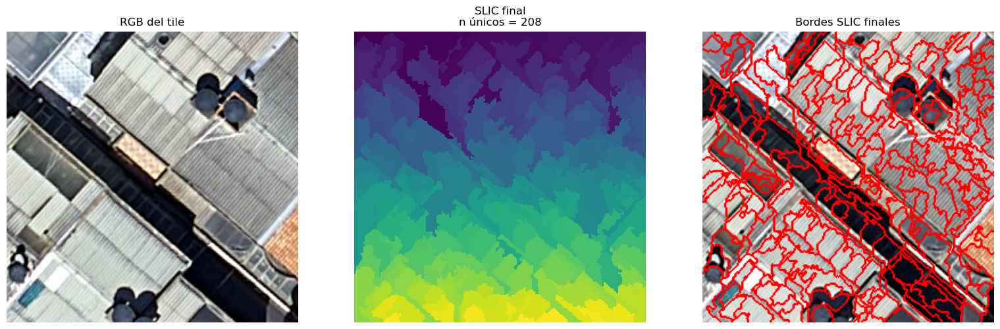

18979

In [104]:
# ============================================================
# 30.2 VERIFICACIÓN FINAL RÁPIDA DE SLIC ADOPTADO
# ============================================================

best_tile_uid = df_train_diag.iloc[0]["tile_uid"]
sample_train_row = df_tiles[df_tiles["tile_uid"] == best_tile_uid].iloc[0]

ortho_tile, mask_tile, ndsm_tile = read_tile_data(sample_train_row)
tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)
segments = run_slic_on_tile(tile_vars, SLIC_CFG, FEATURE_CFG)

rgb_vis = stretch_rgb(np.nan_to_num(ortho_tile[:3].transpose(1, 2, 0), nan=0.0))
boundaries = find_boundaries(segments, mode="outer")

overlay = rgb_vis.copy()
overlay[boundaries] = [1.0, 0.0, 0.0]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(rgb_vis)
axes[0].set_title("RGB del tile")
axes[0].axis("off")

axes[1].imshow(segments, interpolation="nearest")
axes[1].set_title(f"SLIC final\nn únicos = {len(np.unique(segments))}")
axes[1].axis("off")

axes[2].imshow(overlay)
axes[2].set_title("Bordes SLIC finales")
axes[2].axis("off")

plt.tight_layout()
plt.show()

del ortho_tile, mask_tile, ndsm_tile, tile_vars, segments, rgb_vis, boundaries, overlay
gc.collect()

## Versionado de caché de features

Las tablas de features por superpíxel dependen directamente de la configuración de SLIC.

Por tanto, cuando cambia la configuración de segmentación, no se deben reutilizar los mismos archivos de caché anteriores, porque mezclarían experimentos distintos.

En lugar de borrar la caché previa, se creará una carpeta específica para la configuración actual del experimento.

Esto permite:

- conservar resultados anteriores
- comparar variantes de SLIC
- reanudar ejecuciones sin confusión
- mantener trazabilidad metodológica

In [105]:
# ============================================================
# VERSIONADO DE CACHÉ PARA FEATURES DEPENDIENTES DE SLIC
# ============================================================

EXPERIMENT_TAG = "slic_rgbonly_ns500_c1p0_sig1p0_v1"

FEATURE_CACHE_DIR = PATHS.cache_dir / EXPERIMENT_TAG
FEATURE_CACHE_DIR.mkdir(parents=True, exist_ok=True)

print("EXPERIMENT_TAG:", EXPERIMENT_TAG)
print("FEATURE_CACHE_DIR:", FEATURE_CACHE_DIR)

EXPERIMENT_TAG: slic_rgbonly_ns500_c1p0_sig1p0_v1
FEATURE_CACHE_DIR: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1


In [106]:
# ============================================================
# REEMPLAZAR LA FUNCIÓN DE RUTA DE CACHÉ DE FEATURES
# ============================================================

def get_feature_table_cache_path(split_name: str) -> Path:
    """
    Devuelve la ruta de caché para las features del split,
    separada por versión de experimento.
    """
    return FEATURE_CACHE_DIR / f"features_superpixels_{split_name}.parquet"


def get_feature_summary_cache_path(name: str) -> Path:
    """
    Ruta para resúmenes asociados al experimento actual.
    """
    return FEATURE_CACHE_DIR / name

## Recomputación de features con la configuración final

A partir de este punto, las features de train y val se recalcularán con la configuración final adoptada para SLIC.

Como la caché ahora está versionada por experimento, los archivos previos no se borran ni se sobrescriben.

In [107]:
# ============================================================
# RECONSTRUIR FEATURES DE TRAIN Y VAL CON LA CONFIGURACIÓN FINAL
# ============================================================

df_features_train = build_superpixel_feature_table_for_split(
    split_name="train",
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    use_cache_if_exists=True,   # si ya corriste esta versión, la carga
    max_tiles=None
)

df_features_val = build_superpixel_feature_table_for_split(
    split_name="val",
    slic_cfg=SLIC_CFG,
    feature_cfg=FEATURE_CFG,
    use_cache_if_exists=True,
    max_tiles=None
)

print("Shape train:", df_features_train.shape)
print("Shape val  :", df_features_val.shape)

[train] Cargando features desde caché: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/features_superpixels_train.parquet
[val] Cargando features desde caché: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/features_superpixels_val.parquet
Shape train: (633050, 54)
Shape val  : (161451, 54)


In [108]:
print(get_feature_table_cache_path("train"))
print(get_feature_table_cache_path("val"))
print(df_features_train.shape)
print(df_features_val.shape)

/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/features_superpixels_train.parquet
/home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/features_superpixels_val.parquet
(633050, 54)
(161451, 54)


## 31. Entrenamiento del Random Forest y validación intermedia

En esta fase se entrena el clasificador supervisado del método clásico.

### Principio metodológico

- el modelo se ajusta **solo con train**
- la selección o validación se hace **solo con val**
- el split **test no se utiliza** para ninguna decisión del modelo

### Importante sobre comparabilidad

La evaluación de esta fase todavía no es la evaluación final comparable con U-Net.

¿Por qué?

Porque aquí el modelo se evalúa a nivel de **superpíxel etiquetado**, no sobre el raster reconstruido a resolución de píxel.

Sin embargo, para aproximar mejor la lógica pixel-level, las métricas de validación se calcularán ponderando cada superpíxel por su `area_px`.

Esto permite que superpíxeles grandes aporten más al resultado que superpíxeles pequeños.

## 32. Selección de variables de entrada

El Random Forest recibirá variables derivadas de:

- `R`
- `G`
- `B`
- `NIR`
- `HEIGHT`
- `NDVI`

Cada una resumida por estadísticas por superpíxel.

No se usarán como predictores:

- identificadores
- offsets del tile
- nombres de split
- variables objetivo
- columnas de trazabilidad

Esto deja una matriz de entrada limpia y reproducible.

In [109]:
# ============================================================
# 31. IMPORTS ESPECÍFICOS DE ESTE BLOQUE
# ============================================================

import time
import joblib
from pathlib import Path

print("Imports del bloque 4 cargados.")

Imports del bloque 4 cargados.


In [110]:
# ============================================================
# 32. DEFINIR COLUMNAS DE FEATURES Y COLUMNAS EXCLUIDAS
# ============================================================

NON_FEATURE_COLUMNS = {
    "tile_uid",
    "split",
    "row_off",
    "col_off",
    "segment_id_local",
    "segment_uid",
    "target",
    "target_name",
    "is_labeled",
    "valid_label_pixels",
    "valid_label_ratio",
}

feature_cols = [c for c in df_features_train.columns if c not in NON_FEATURE_COLUMNS]

print(f"Número de columnas predictoras: {len(feature_cols)}")
print("Primeras 20 columnas de features:")
for c in feature_cols[:20]:
    print(" -", c)

Número de columnas predictoras: 43
Primeras 20 columnas de features:
 - area_px
 - R_mean
 - R_std
 - R_min
 - R_max
 - R_median
 - R_p25
 - R_p75
 - G_mean
 - G_std
 - G_min
 - G_max
 - G_median
 - G_p25
 - G_p75
 - B_mean
 - B_std
 - B_min
 - B_max
 - B_median


In [111]:
# ============================================================
# 32.1 COMPROBAR CONSISTENCIA ENTRE TRAIN Y VAL
# ============================================================

missing_in_val = sorted(set(feature_cols) - set(df_features_val.columns))
extra_in_val = sorted(set(df_features_val.columns) - set(df_features_train.columns))

print("Features faltantes en val respecto a train:", missing_in_val)
print("Columnas extra en val respecto a train:", extra_in_val[:20], "..." if len(extra_in_val) > 20 else "")

assert len(missing_in_val) == 0, "Faltan columnas de features en validación."
print("Consistencia de columnas OK.")

Features faltantes en val respecto a train: []
Columnas extra en val respecto a train: [] 
Consistencia de columnas OK.


## 33. Preparación de matrices `X` e `y`

En esta etapa se preparan:

- `X_train`, `y_train`
- `X_val`, `y_val`

y además los pesos por área:

- `w_train`
- `w_val`

### Nota

Los pesos por área no se usarán para entrenar el Random Forest en esta versión base, pero sí para calcular las métricas de validación intermedia.

Esto mantiene simple el entrenamiento y mejora la comparabilidad de la validación.

In [112]:
# ============================================================
# 33. PREPARAR MATRICES PARA ENTRENAMIENTO Y VALIDACIÓN
# ============================================================

X_train = df_features_train[feature_cols].to_numpy(dtype=np.float32, copy=True)
y_train = df_features_train["target"].to_numpy(dtype=np.int16, copy=True)
w_train = df_features_train["area_px"].to_numpy(dtype=np.float32, copy=True)

X_val = df_features_val[feature_cols].to_numpy(dtype=np.float32, copy=True)
y_val = df_features_val["target"].to_numpy(dtype=np.int16, copy=True)
w_val = df_features_val["area_px"].to_numpy(dtype=np.float32, copy=True)

print("Shapes:")
print("X_train:", X_train.shape, X_train.dtype)
print("y_train:", y_train.shape, y_train.dtype)
print("w_train:", w_train.shape, w_train.dtype)
print("X_val  :", X_val.shape, X_val.dtype)
print("y_val  :", y_val.shape, y_val.dtype)
print("w_val  :", w_val.shape, w_val.dtype)

Shapes:
X_train: (633050, 43) float32
y_train: (633050,) int16
w_train: (633050,) float32
X_val  : (161451, 43) float32
y_val  : (161451,) int16
w_val  : (161451,) float32


In [115]:
# ============================================================
# 33.1 DISTRIBUCIÓN DE CLASES EN TRAIN Y VAL
# ============================================================

def class_distribution_from_y(y: np.ndarray, split_name: str) -> pd.DataFrame:
    vals, counts = np.unique(y, return_counts=True)
    df = pd.DataFrame({
        "split": split_name,
        "clase_id": vals,
        "clase_nombre": [CLASS_MAP[int(v)] for v in vals],
        "n_superpixeles": counts
    })
    df["proporcion"] = df["n_superpixeles"] / df["n_superpixeles"].sum()
    return df

df_y_train_dist = class_distribution_from_y(y_train, "train")
df_y_val_dist = class_distribution_from_y(y_val, "val")

df_dist_clases = (pd.concat([df_y_train_dist, df_y_val_dist], ignore_index=True))
# Mostrar la tabla
display(df_dist_clases)

# Guardar en Excel
ruta_excel = RESULTADOS_DIR / "distribucion_clases_train_val_SLIC.xlsx"
df_dist_clases.to_excel(ruta_excel, index=False)


,split,clase_id,clase_nombre,n_superpixeles,proporcion
0,train,0,fondo,212127,0.335087
1,train,1,construccion,204120,0.322439
2,train,2,pavimento,206551,0.326279
3,train,3,vegetacion,8848,0.013977
4,train,4,agua,1404,0.002218
5,val,0,fondo,53412,0.330825
6,val,1,construccion,50072,0.310137
7,val,2,pavimento,55918,0.346347
8,val,3,vegetacion,1586,0.009823
9,val,4,agua,463,0.002868


## 34. Configuración del Random Forest

Se utilizará una configuración inicial razonable y moderada para este problema.

### Configuración adoptada

- `n_estimators`
- `max_depth`
- `min_samples_leaf`
- `max_features`
- `class_weight`
- `random_state`

Esta configuración busca un equilibrio entre:

- capacidad predictiva
- robustez
- tiempo de entrenamiento
- estabilidad del kernel

Si más adelante se requiere, se podrá hacer una búsqueda moderada de hiperparámetros, pero en esta fase se entrenará primero un modelo base reproducible.

In [116]:
# ============================================================
# 34. CONSTRUIR EL RANDOM FOREST FINAL DE ESTA FASE
# ============================================================

rf_model = RandomForestClassifier(
    n_estimators=RF_CFG.n_estimators,
    max_depth=RF_CFG.max_depth,
    min_samples_leaf=RF_CFG.min_samples_leaf,
    max_features=RF_CFG.max_features,
    class_weight=RF_CFG.class_weight,
    random_state=RF_CFG.random_state,
    n_jobs=RF_CFG.n_jobs,
)

print(rf_model)

RandomForestClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=2, n_estimators=300, n_jobs=-1,
                       random_state=42)


## 35. Medición con CodeCarbon para la fase de entrenamiento

En esta fase se medirá, si la librería está disponible:

- tiempo de entrenamiento
- energía consumida
- emisiones estimadas

### Nota práctica

Si `codecarbon` no está instalado en el entorno, el notebook no debe fallar.  
En ese caso, se medirá al menos el tiempo de ejecución y se dejará lista la estructura para activar CodeCarbon cuando esté disponible.

In [117]:
# ============================================================
# 35. INICIALIZAR CODECARBON DE FORMA SEGURA
# ============================================================

CODECARBON_AVAILABLE = False
EmissionsTracker = None

try:
    from codecarbon import EmissionsTracker
    CODECARBON_AVAILABLE = True
    print("CodeCarbon disponible.")
except Exception as e:
    print("CodeCarbon no está disponible en este entorno.")
    print("Detalle:", repr(e))

TRAIN_CODECARBON_CSV = FEATURE_CACHE_DIR / "codecarbon_train.csv"
print("Archivo de salida CodeCarbon entrenamiento:", TRAIN_CODECARBON_CSV)

CodeCarbon disponible.
Archivo de salida CodeCarbon entrenamiento: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/codecarbon_train.csv


In [118]:
# ============================================================
# 35.1 ENTRENAR EL RANDOM FOREST CON MEDICIÓN
# ============================================================

tracker = None
train_emissions_kg = np.nan
train_wall_time_sec = np.nan

start_time = time.time()

if CODECARBON_AVAILABLE:
    tracker = EmissionsTracker(
        project_name="rf_training",
        output_dir=str(FEATURE_CACHE_DIR),
        output_file=TRAIN_CODECARBON_CSV.name,
        log_level="error"
    )
    tracker.start()

rf_model.fit(X_train, y_train)

if tracker is not None:
    try:
        train_emissions_kg = tracker.stop()
    except Exception:
        train_emissions_kg = np.nan

train_wall_time_sec = time.time() - start_time

print(f"Entrenamiento completado en {train_wall_time_sec:.2f} segundos")
print(f"Emisiones reportadas por CodeCarbon (kgCO2eq): {train_emissions_kg}")

Entrenamiento completado en 66.21 segundos
Emisiones reportadas por CodeCarbon (kgCO2eq): 0.0001763965708257918


In [120]:
# ============================================================
# 35.2 LEER RESUMEN DE CODECARBON SI EXISTE
# ============================================================

def read_codecarbon_summary(csv_fp: Path) -> pd.DataFrame:
    if not csv_fp.exists():
        return pd.DataFrame([{
            "duration": np.nan,
            "energy_consumed": np.nan,
            "emissions": np.nan,
            "cpu_power": np.nan,
            "gpu_power": np.nan,
            "ram_power": np.nan,
        }])

    df = pd.read_csv(csv_fp)
    if len(df) == 0:
        return pd.DataFrame([{
            "duration": np.nan,
            "energy_consumed": np.nan,
            "emissions": np.nan,
            "cpu_power": np.nan,
            "gpu_power": np.nan,
            "ram_power": np.nan,
        }])

    wanted_cols = ["duration", "energy_consumed", "emissions", "cpu_power", "gpu_power", "ram_power"]
    row = df.iloc[-1:].copy()

    out = {}
    for c in wanted_cols:
        out[c] = row[c].iloc[0] if c in row.columns else np.nan

    return pd.DataFrame([out])

df_train_cc = read_codecarbon_summary(TRAIN_CODECARBON_CSV)
df_train_cc["wall_time_sec"] = train_wall_time_sec
display(df_train_cc)
# Guardar tabla en Excel
ruta_excel = RESULTADOS_DIR / "resumen_codecarbon_entrenamiento.xlsx"
df_train_cc.to_excel(ruta_excel, index=False)

,duration,energy_consumed,emissions,cpu_power,gpu_power,ram_power,wall_time_sec
0,64.502879,0.000971,0.000176,42.5,0.0,11.695353,66.209385


## 36. Predicción sobre validación

Una vez entrenado el modelo, se generan predicciones sobre `val`.

Estas predicciones se usarán únicamente para:

- revisar el comportamiento del modelo
- obtener métricas intermedias
- decidir si la configuración base del Random Forest es razonable

### Importante

La evaluación final estrictamente comparable con U-Net se hará después sobre:

- el raster reconstruido de test
- a nivel de píxel
- con las mismas métricas finales

In [121]:
# ============================================================
# 36. PREDICCIÓN SOBRE VALIDACIÓN
# ============================================================

y_val_pred = rf_model.predict(X_val).astype(np.int16, copy=False)

print("Predicción completada.")
print("Shape y_val_pred:", y_val_pred.shape)
print("Clases predichas:", np.unique(y_val_pred))

Predicción completada.
Shape y_val_pred: (161451,)
Clases predichas: [0 1 2 3 4]


In [124]:
# ============================================================
# 36.1 IMPORTANCIA DE VARIABLES
# ============================================================

df_feature_importance = pd.DataFrame({
    "feature": feature_cols,
    "importance": rf_model.feature_importances_
}).sort_values("importance", ascending=False).reset_index(drop=True)

display(df_feature_importance.head(42))

,feature,importance
0,HEIGHT_p25,0.061613
1,HEIGHT_mean,0.056354
2,HEIGHT_min,0.055493
3,HEIGHT_median,0.043880
4,B_p25,0.039698
5,HEIGHT_max,0.039661
6,B_mean,0.035351
7,B_median,0.033145
8,HEIGHT_p75,0.032224
9,NDVI_p75,0.028594


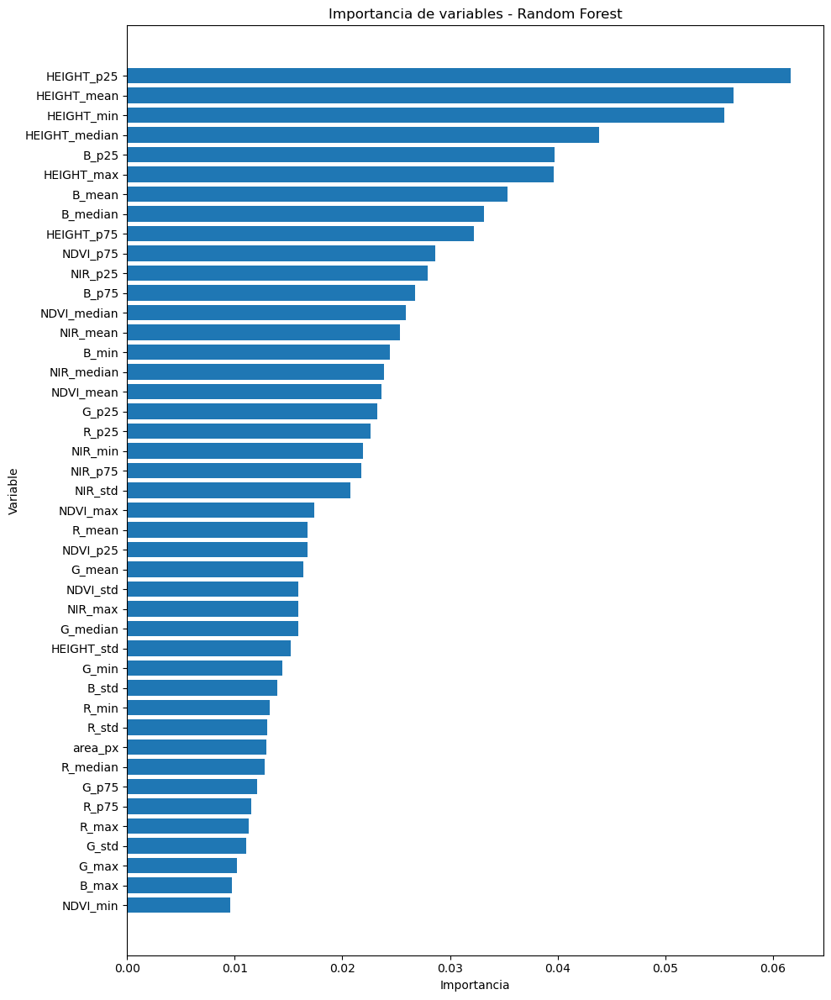

Gráfico guardado en: /home/jovyan/work/datos/DATOS_AJUSTADOS/resultados/importancia_variables_rf.png


In [126]:
# Si quieres usar todas las variables:
df_plot = df_feature_importance.copy()

# Si prefieres solo las 20 más importantes, usa esta línea en vez de la anterior:
# df_plot = df_feature_importance.head(20).copy()

# Para que la más importante quede arriba
df_plot = df_plot.sort_values("importance", ascending=True)

plt.figure(figsize=(10, 12))
plt.barh(df_plot["feature"], df_plot["importance"])

plt.xlabel("Importancia")
plt.ylabel("Variable")
plt.title("Importancia de variables - Random Forest")
plt.tight_layout()
plt.savefig(RESULTADOS_DIR / "importancia_variables_rf.png", dpi=300, bbox_inches="tight")
plt.show()

print("Gráfico guardado en:", (RESULTADOS_DIR / "importancia_variables_rf.png").resolve())

## 37. Métricas de validación intermedia

Se calcularán las siguientes métricas sobre `val`, ponderadas por `area_px`:

- `overall_acc`
- `macro_f1`
- `mean_iou`
- precisión, recall, F1 e IoU por clase
- matriz de confusión

### Aclaración

Estas métricas son útiles para control del entrenamiento y selección del modelo, pero no reemplazan la evaluación final comparable, que será:

- en `test`
- sobre raster reconstruido
- a nivel de píxel

In [127]:
# ============================================================
# 37. FUNCIONES DE MÉTRICAS DE VALIDACIÓN
# ============================================================

def compute_weighted_validation_metrics(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    labels: List[int],
    sample_weight: Optional[np.ndarray] = None
):
    overall_acc = accuracy_score(y_true, y_pred, sample_weight=sample_weight)
    macro_f1 = f1_score(
        y_true, y_pred,
        labels=labels,
        average="macro",
        zero_division=0,
        sample_weight=sample_weight
    )
    mean_iou = jaccard_score(
        y_true, y_pred,
        labels=labels,
        average="macro",
        zero_division=0,
        sample_weight=sample_weight
    )

    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred,
        labels=labels,
        average=None,
        zero_division=0,
        sample_weight=sample_weight
    )

    iou_per_class = jaccard_score(
        y_true, y_pred,
        labels=labels,
        average=None,
        zero_division=0,
        sample_weight=sample_weight
    )

    cm = confusion_matrix(
        y_true, y_pred,
        labels=labels,
        sample_weight=sample_weight
    )

    df_global = pd.DataFrame([{
        "overall_acc": overall_acc,
        "macro_f1": macro_f1,
        "mean_iou": mean_iou
    }])

    rows = []
    for i, cls in enumerate(labels):
        rows.append({
            "clase_id": cls,
            "clase_nombre": CLASS_MAP[cls],
            "precision": precision[i],
            "recall": recall[i],
            "f1": f1[i],
            "iou": iou_per_class[i],
            "support_weighted": support[i]
        })
    df_per_class = pd.DataFrame(rows)

    df_cm = pd.DataFrame(
        cm,
        index=[f"true_{CLASS_MAP[c]}" for c in labels],
        columns=[f"pred_{CLASS_MAP[c]}" for c in labels]
    )

    return df_global, df_per_class, df_cm

print("Funciones de métricas listas.")

Funciones de métricas listas.


In [130]:
# ============================================================
# 37.1 MÉTRICAS DE VALIDACIÓN PONDERADAS POR ÁREA
# ============================================================

df_val_global_metrics, df_val_per_class_metrics, df_val_cm = compute_weighted_validation_metrics(
    y_true=y_val,
    y_pred=y_val_pred,
    labels=VALID_CLASSES,
    sample_weight=w_val
)

print("Métricas globales de validación:")
display(df_val_global_metrics)

print("Métricas por clase de validación:")
display(df_val_per_class_metrics)

print("Matriz de confusión ponderada por área:")
display(df_val_cm)
df_val_global_metrics.to_excel(RESULTADOS_DIR / "metricas_globales_val_SLIC.xlsx", index=False)
df_val_per_class_metrics.to_excel(RESULTADOS_DIR / "metricas_clase_val_SLIC.xlsx", index=False)
df_val_cm.to_excel(RESULTADOS_DIR / "matriz_ponderada_por_area_SLIC.xlsx", index=False)

Métricas globales de validación:


,overall_acc,macro_f1,mean_iou
0,0.912017,0.710062,0.633395


Métricas por clase de validación:


,clase_id,clase_nombre,precision,recall,f1,iou,support_weighted
0,0,fondo,0.881859,0.929640,0.905119,0.826683,23782557.0
1,1,construccion,0.962794,0.963398,0.963096,0.928819,15639086.0
2,2,pavimento,0.921432,0.845411,0.881786,0.788566,13049716.0
3,3,vegetacion,0.778500,0.716355,0.746136,0.595069,1173874.0
4,4,agua,0.338470,0.029442,0.054171,0.027840,140244.0


Matriz de confusión ponderada por área:


,pred_fondo,pred_construccion,pred_pavimento,pred_vegetacion,pred_agua
true_fondo,22109212.0,550750.0,895440.0,221367.0,5788.0
true_construccion,536537.0,15066670.0,31156.0,4723.0,0.0
true_pavimento,1978780.0,30865.0,11032367.0,6718.0,986.0
true_vegetacion,321538.0,0.0,10129.0,840911.0,1296.0
true_agua,125073.0,620.0,3973.0,6449.0,4129.0


In [131]:
# ============================================================
# 37.2 MÉTRICAS NO PONDERADAS (OPCIONAL, PARA REFERENCIA)
# ============================================================

df_val_global_metrics_unw, df_val_per_class_metrics_unw, df_val_cm_unw = compute_weighted_validation_metrics(
    y_true=y_val,
    y_pred=y_val_pred,
    labels=VALID_CLASSES,
    sample_weight=None
)

print("Métricas globales NO ponderadas:")
display(df_val_global_metrics_unw)

Métricas globales NO ponderadas:


,overall_acc,macro_f1,mean_iou
0,0.901667,0.669742,0.58476


## 38. Interpretación de la validación intermedia

La validación sobre `val` sirve para responder preguntas como:

- ¿el modelo está aprendiendo algo razonable?
- ¿qué clases tienen mejor separación?
- ¿qué clases se confunden más?
- ¿la configuración base del Random Forest es defendible?

### Pero todavía no responde de forma definitiva:

- cómo se comporta el modelo sobre `test`
- qué tan buena es la reconstrucción raster pixel a pixel
- cuál es la comparación estrictamente equivalente con U-Net

Eso se resolverá en las siguientes fases.

In [132]:
# ============================================================
# 38. GUARDAR MODELO Y RESULTADOS DE VALIDACIÓN
# ============================================================

rf_model_fp = FEATURE_CACHE_DIR / "rf_model.joblib"
val_global_fp = FEATURE_CACHE_DIR / "val_global_metrics.csv"
val_per_class_fp = FEATURE_CACHE_DIR / "val_per_class_metrics.csv"
val_cm_fp = FEATURE_CACHE_DIR / "val_confusion_matrix.csv"
feature_importance_fp = FEATURE_CACHE_DIR / "feature_importance.csv"

joblib.dump(rf_model, rf_model_fp)
df_val_global_metrics.to_csv(val_global_fp, index=False)
df_val_per_class_metrics.to_csv(val_per_class_fp, index=False)
df_val_cm.to_csv(val_cm_fp)
df_feature_importance.to_csv(feature_importance_fp, index=False)

print("Archivos guardados:")
print(" -", rf_model_fp)
print(" -", val_global_fp)
print(" -", val_per_class_fp)
print(" -", val_cm_fp)
print(" -", feature_importance_fp)

Archivos guardados:
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/rf_model.joblib
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/val_global_metrics.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/val_per_class_metrics.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/val_confusion_matrix.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/feature_importance.csv


In [133]:
# ============================================================
# 38.1 RESUMEN DE ENTRENAMIENTO + VALIDACIÓN
# ============================================================

df_training_summary = pd.DataFrame([{
    "experiment_tag": EXPERIMENT_TAG,
    "n_train_superpixels": len(df_features_train),
    "n_val_superpixels": len(df_features_val),
    "n_features": len(feature_cols),
    "rf_n_estimators": RF_CFG.n_estimators,
    "rf_max_depth": RF_CFG.max_depth,
    "rf_min_samples_leaf": RF_CFG.min_samples_leaf,
    "rf_max_features": RF_CFG.max_features,
    "rf_class_weight": RF_CFG.class_weight,
    "train_wall_time_sec": train_wall_time_sec,
    "train_emissions_kgco2eq": train_emissions_kg,
    "val_overall_acc_weighted": df_val_global_metrics["overall_acc"].iloc[0],
    "val_macro_f1_weighted": df_val_global_metrics["macro_f1"].iloc[0],
    "val_mean_iou_weighted": df_val_global_metrics["mean_iou"].iloc[0],
}])

display(df_training_summary)

training_summary_fp = FEATURE_CACHE_DIR / "training_validation_summary.csv"
df_training_summary.to_csv(training_summary_fp, index=False)
df_training_summary.to_excel(RESULTADOS_DIR / "resumen_entrenamiento_validacion_SLIC.xlsx", index=False)
print("Resumen guardado en:", training_summary_fp)

,experiment_tag,n_train_superpixels,n_val_superpixels,n_features,rf_n_estimators,rf_max_depth,rf_min_samples_leaf,rf_max_features,rf_class_weight,train_wall_time_sec,train_emissions_kgco2eq,val_overall_acc_weighted,val_macro_f1_weighted,val_mean_iou_weighted
0,slic_rgbonly_ns500_c1p0_sig1p0_v1,633050,161451,43,300,30,2,sqrt,balanced,66.209385,0.000176,0.912017,0.710062,0.633395


Resumen guardado en: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/training_validation_summary.csv


## 39. Conclusiones técnicas de esta fase

Al finalizar este bloque ya queda disponible:

- un Random Forest entrenado
- validación intermedia sobre `val`
- métricas globales
- métricas por clase
- matriz de confusión
- importancia de variables
- medición de tiempo y, si es posible, emisiones

### Estado metodológico del experimento

Hasta aquí ya es posible afirmar si el clasificador clásico:

- aprende patrones útiles
- aprovecha la información multifuente
- presenta confusiones esperables entre clases urbanas

Sin embargo, la comparación estrictamente equivalente con U-Net todavía requiere:

1. inferencia sobre `test`
2. reconstrucción raster pixel a pixel
3. evaluación final con las métricas comparables del experimento
4. Boundary-F1
5. medición de inferencia con CodeCarbon

In [134]:
# ============================================================
# 39. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 4 COMPLETADA")
print("- Selección de features: OK")
print("- Preparación de X/y: OK")
print("- Entrenamiento RF: OK")
print("- Validación en val: OK")
print("- Métricas globales: OK")
print("- Métricas por clase: OK")
print("- Matriz de confusión: OK")
print("- Guardado de modelo: OK")
print("- CodeCarbon entrenamiento: OK (si estaba disponible)")

gc.collect()

FASE 4 COMPLETADA
- Selección de features: OK
- Preparación de X/y: OK
- Entrenamiento RF: OK
- Validación en val: OK
- Métricas globales: OK
- Métricas por clase: OK
- Matriz de confusión: OK
- Guardado de modelo: OK
- CodeCarbon entrenamiento: OK (si estaba disponible)


18183

## 40. Inferencia en test y reconstrucción raster pixel a pixel

En esta fase se ejecuta el modelo clásico sobre el split `test`.

### Flujo

Para cada tile de test:

1. se leen ortofoto y nDSM
2. se realiza saneamiento `nodata-aware`
3. se generan superpíxeles con la configuración final de SLIC
4. se extraen features por superpíxel
5. el Random Forest asigna una clase a cada superpíxel
6. la predicción se proyecta nuevamente a raster, píxel por píxel

### Importancia metodológica

Esta fase es clave para la comparabilidad con U-Net, porque convierte la predicción del método clásico en un producto raster directamente comparable con la salida pixel-level de la red neuronal.

## 41. Principio de no fuga en inferencia

Durante la inferencia en `test`, la máscara de ground truth **no debe usarse para predecir**.

Por tanto:

- la máscara no se usará para construir features
- la máscara no se usará para decidir clases
- la máscara no se usará para filtrar predicciones

La única información utilizada en inferencia será:

- ortofoto multibanda
- nDSM
- modelo Random Forest ya entrenado

La máscara de `test` solo se utilizará después, en la fase de evaluación final.

In [135]:
# ============================================================
# 40. RUTAS DE SALIDA PARA INFERENCIA EN TEST
# ============================================================

TEST_PRED_RASTER_FP = FEATURE_CACHE_DIR / "test_prediction_full.tif"
TEST_INFERENCE_SUMMARY_FP = FEATURE_CACHE_DIR / "test_inference_tile_summary.csv"
TEST_CODECARBON_CSV = FEATURE_CACHE_DIR / "codecarbon_test_inference.csv"

print("Raster de predicción test:", TEST_PRED_RASTER_FP)
print("Resumen de inferencia test:", TEST_INFERENCE_SUMMARY_FP)
print("CodeCarbon inferencia test:", TEST_CODECARBON_CSV)

Raster de predicción test: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_prediction_full.tif
Resumen de inferencia test: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_inference_tile_summary.csv
CodeCarbon inferencia test: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/codecarbon_test_inference.csv


## 42. Máscara de datos válidos para inferencia

En inferencia no se puede usar la máscara de clases para definir qué píxeles son válidos.

Por eso se construirá una máscara de validez a partir de los insumos continuos:

- `R`
- `G`
- `B`
- `NIR`
- `HEIGHT`

Un píxel se considerará válido para predicción si estas variables tienen datos finitos.

Los píxeles inválidos permanecerán con valor `255` en el raster de salida.

In [136]:
# ============================================================
# 41. FUNCIONES DE INFERENCIA POR TILE
# ============================================================

def build_valid_data_mask(tile_vars: Dict[str, np.ndarray]) -> np.ndarray:
    """
    Máscara de píxeles con datos válidos para inferencia.
    Requiere finitud en R, G, B, NIR y HEIGHT.
    """
    valid_mask = (
        np.isfinite(tile_vars["R"]) &
        np.isfinite(tile_vars["G"]) &
        np.isfinite(tile_vars["B"]) &
        np.isfinite(tile_vars["NIR"]) &
        np.isfinite(tile_vars["HEIGHT"])
    )
    return valid_mask


def extract_superpixel_features_for_inference(
    tile_row: pd.Series,
    slic_cfg: SLICConfig,
    feature_cfg: FeatureConfig,
    min_valid_pixels: int = 20,
    min_valid_ratio: float = 0.50
) -> Tuple[pd.DataFrame, np.ndarray, np.ndarray]:
    """
    Extrae features por superpíxel para inferencia, sin usar ground truth.

    Retorna:
      df_features   : features por segmento válidamente observable
      segments      : mapa SLIC [H, W]
      valid_mask_px : máscara booleana de píxeles válidos
    """
    ortho_tile, mask_tile_unused, ndsm_tile = read_tile_data(tile_row)

    tile_vars = sanitize_tile_inputs(ortho_tile, ndsm_tile)
    valid_mask_px = build_valid_data_mask(tile_vars)

    segments = run_slic_on_tile(tile_vars, slic_cfg=slic_cfg, feature_cfg=feature_cfg)
    unique_segments = np.unique(segments)

    rows = []

    for seg_id in unique_segments:
        seg_mask = (segments == seg_id)
        seg_valid_mask = seg_mask & valid_mask_px

        total_pixels = int(seg_mask.sum())
        valid_pixels = int(seg_valid_mask.sum())
        valid_ratio = float(valid_pixels / total_pixels) if total_pixels > 0 else 0.0

        # Saltar segmentos con muy poca información real
        if valid_pixels < min_valid_pixels or valid_ratio < min_valid_ratio:
            continue

        row = {
            "tile_uid": tile_row["tile_uid"],
            "split": tile_row["split"],
            "row_off": int(tile_row["row_off"]),
            "col_off": int(tile_row["col_off"]),
            "segment_id_local": int(seg_id),
            "segment_uid": f"{tile_row['tile_uid']}__seg{int(seg_id):05d}",
            "area_px": total_pixels,
            "valid_data_pixels": valid_pixels,
            "valid_data_ratio": valid_ratio,
        }

        for var_name in ["R", "G", "B", "NIR", "HEIGHT", "NDVI"]:
            values = tile_vars[var_name][seg_valid_mask]
            stats = compute_basic_stats(
                values,
                add_percentiles=feature_cfg.add_percentiles,
                percentiles=feature_cfg.percentiles
            )
            for stat_name, stat_value in stats.items():
                row[f"{var_name}_{stat_name}"] = stat_value

        rows.append(row)

    df_features = pd.DataFrame(rows)

    # Alinear con entrenamiento: quitar filas problemáticas
    if len(df_features) > 0:
        required_cols = ["area_px"] + [c for c in feature_cols if c != "area_px"]
        for c in required_cols:
            if c not in df_features.columns:
                df_features[c] = np.nan

        df_features = df_features.replace([np.inf, -np.inf], np.nan)
        df_features = df_features.dropna(subset=feature_cols).copy()

    del ortho_tile, mask_tile_unused, ndsm_tile, tile_vars
    gc.collect()

    return df_features, segments, valid_mask_px

In [137]:
# ============================================================
# 41.1 RECONSTRUIR PREDICCIÓN PIXEL A PIXEL EN UN TILE
# ============================================================

def reconstruct_tile_prediction_from_segments(
    segments: np.ndarray,
    valid_mask_px: np.ndarray,
    df_seg_features: pd.DataFrame,
    y_seg_pred: np.ndarray,
    ignore_index: int = 255
) -> np.ndarray:
    """
    Reconstruye una predicción raster del tile a partir de las clases predichas
    para cada superpíxel.
    """
    pred_tile = np.full(segments.shape, ignore_index, dtype=np.uint8)

    if len(df_seg_features) == 0:
        return pred_tile

    max_seg_id = int(np.max(segments))
    lut = np.full(max_seg_id + 1, ignore_index, dtype=np.uint8)

    seg_ids = df_seg_features["segment_id_local"].to_numpy(dtype=np.int32, copy=False)
    lut[seg_ids] = y_seg_pred.astype(np.uint8, copy=False)

    pred_tile = lut[segments]
    pred_tile[~valid_mask_px] = ignore_index

    return pred_tile.astype(np.uint8, copy=False)

## 43. Escritura incremental del raster de predicción

Para evitar cargar todo el raster completo en memoria, la reconstrucción se escribirá directamente a disco por ventanas.

El raster de salida tendrá:

- una sola banda
- tipo `uint8`
- `nodata = 255`
- mismo tamaño, transformada y CRS del raster base

Además, se inicializará completamente con `255` para que:
- el área fuera de `test`
- los tiles vacíos
- los píxeles inválidos

queden correctamente marcados como ignorados.

In [138]:
# ============================================================
# 42. FUNCIONES PARA CREAR E INICIALIZAR EL RASTER DE SALIDA
# ============================================================

def build_prediction_raster_profile(reference_fp: Path) -> Dict:
    with rasterio.open(reference_fp) as src:
        profile = src.profile.copy()

    profile.update(
        count=1,
        dtype=rasterio.uint8,
        nodata=IGNORE_INDEX,
        compress="lzw"
    )
    return profile


def initialize_output_raster_with_ignore(
    output_fp: Path,
    reference_fp: Path,
    ignore_index: int = 255,
    row_chunk_size: int = 1024
) -> None:
    """
    Crea el raster de salida e inicializa todo el contenido con ignore_index.
    """
    profile = build_prediction_raster_profile(reference_fp)

    with rasterio.open(reference_fp) as ref:
        height = ref.height
        width = ref.width

    with rasterio.open(output_fp, "w", **profile) as dst:
        for row_off in range(0, height, row_chunk_size):
            h = min(row_chunk_size, height - row_off)
            window = Window(col_off=0, row_off=row_off, width=width, height=h)
            block = np.full((h, width), ignore_index, dtype=np.uint8)
            dst.write(block, 1, window=window)

    print(f"Raster inicializado con {ignore_index}: {output_fp}")

In [139]:
# ============================================================
# 42.1 CREAR RASTER DE SALIDA DE TEST
# ============================================================

if not TEST_PRED_RASTER_FP.exists():
    initialize_output_raster_with_ignore(
        output_fp=TEST_PRED_RASTER_FP,
        reference_fp=PATHS.mask_fp,
        ignore_index=IGNORE_INDEX,
        row_chunk_size=1024
    )
else:
    print("El raster de salida ya existe. Se reutilizará y sobrescribirá solo en ventanas de test.")

El raster de salida ya existe. Se reutilizará y sobrescribirá solo en ventanas de test.


## 44. Inference loop sobre test

En esta etapa se ejecutará la inferencia tile por tile.

Para cada tile de `test` se registrará un pequeño resumen con:

- número total de segmentos
- número de segmentos realmente predichos
- número de píxeles válidos
- número de píxeles finalmente escritos

Esto ayuda a auditar el comportamiento del pipeline y detectar tiles vacíos o anómalos.

In [140]:
# ============================================================
# 43. INFERENCIA EN TEST + ESCRITURA DEL RASTER PREDICHO
# ============================================================

df_test_tiles = df_tiles[df_tiles["split"] == "test"].copy().reset_index(drop=True)
print("Tiles de test a procesar:", len(df_test_tiles))

tracker = None
test_emissions_kg = np.nan
test_wall_time_sec = np.nan

inference_rows = []

start_time = time.time()

if CODECARBON_AVAILABLE:
    tracker = EmissionsTracker(
        project_name="rf_test_inference",
        output_dir=str(FEATURE_CACHE_DIR),
        output_file=TEST_CODECARBON_CSV.name,
        log_level="error"
    )
    tracker.start()

with rasterio.open(TEST_PRED_RASTER_FP, "r+") as dst:
    for i, (_, tile_row) in enumerate(df_test_tiles.iterrows(), start=1):
        window = tile_row_to_window(tile_row)

        df_tile_features, segments, valid_mask_px = extract_superpixel_features_for_inference(
            tile_row=tile_row,
            slic_cfg=SLIC_CFG,
            feature_cfg=FEATURE_CFG,
            min_valid_pixels=FEATURE_CFG.min_valid_pixels_for_label,
            min_valid_ratio=FEATURE_CFG.min_valid_ratio_for_label
        )

        n_segments_total = int(len(np.unique(segments)))
        n_segments_pred = int(len(df_tile_features))
        valid_pixels = int(valid_mask_px.sum())

        if len(df_tile_features) > 0:
            X_tile = df_tile_features[feature_cols].to_numpy(dtype=np.float32, copy=True)
            y_tile_pred = rf_model.predict(X_tile).astype(np.uint8, copy=False)

            pred_tile = reconstruct_tile_prediction_from_segments(
                segments=segments,
                valid_mask_px=valid_mask_px,
                df_seg_features=df_tile_features,
                y_seg_pred=y_tile_pred,
                ignore_index=IGNORE_INDEX
            )
        else:
            pred_tile = np.full(segments.shape, IGNORE_INDEX, dtype=np.uint8)

        predicted_pixels = int(np.sum(pred_tile != IGNORE_INDEX))

        dst.write(pred_tile, 1, window=window)

        inference_rows.append({
            "tile_uid": tile_row["tile_uid"],
            "row_off": int(tile_row["row_off"]),
            "col_off": int(tile_row["col_off"]),
            "n_segments_total": n_segments_total,
            "n_segments_predicted": n_segments_pred,
            "valid_pixels": valid_pixels,
            "predicted_pixels": predicted_pixels,
        })

        if i % 25 == 0 or i == len(df_test_tiles):
            print(f"[test] procesados {i}/{len(df_test_tiles)} tiles")

        del df_tile_features, segments, valid_mask_px, pred_tile
        gc.collect()

if tracker is not None:
    try:
        test_emissions_kg = tracker.stop()
    except Exception:
        test_emissions_kg = np.nan

test_wall_time_sec = time.time() - start_time

df_test_inference_summary = pd.DataFrame(inference_rows)
df_test_inference_summary.to_csv(TEST_INFERENCE_SUMMARY_FP, index=False)

print(f"Inferencia completada en {test_wall_time_sec:.2f} segundos")
print(f"Emisiones reportadas por CodeCarbon (kgCO2eq): {test_emissions_kg}")
print("Resumen guardado en:", TEST_INFERENCE_SUMMARY_FP)

Tiles de test a procesar: 1177
[test] procesados 25/1177 tiles
[test] procesados 50/1177 tiles
[test] procesados 75/1177 tiles
[test] procesados 100/1177 tiles
[test] procesados 125/1177 tiles
[test] procesados 150/1177 tiles
[test] procesados 175/1177 tiles
[test] procesados 200/1177 tiles
[test] procesados 225/1177 tiles
[test] procesados 250/1177 tiles
[test] procesados 275/1177 tiles
[test] procesados 300/1177 tiles
[test] procesados 325/1177 tiles
[test] procesados 350/1177 tiles
[test] procesados 375/1177 tiles
[test] procesados 400/1177 tiles
[test] procesados 425/1177 tiles
[test] procesados 450/1177 tiles
[test] procesados 475/1177 tiles
[test] procesados 500/1177 tiles
[test] procesados 525/1177 tiles
[test] procesados 550/1177 tiles
[test] procesados 575/1177 tiles
[test] procesados 600/1177 tiles
[test] procesados 625/1177 tiles
[test] procesados 650/1177 tiles
[test] procesados 675/1177 tiles
[test] procesados 700/1177 tiles
[test] procesados 725/1177 tiles
[test] procesad

In [141]:
# ============================================================
# 43.1 LEER RESUMEN DE CODECARBON DE INFERENCIA
# ============================================================

df_test_cc = read_codecarbon_summary(TEST_CODECARBON_CSV)
df_test_cc["wall_time_sec"] = test_wall_time_sec
df_test_cc.to_excel(RESULTADOS_DIR / "Codecarbon_inferencia_en_test_SLIC.xlsx", index=False)
display(df_test_cc)

,duration,energy_consumed,emissions,cpu_power,gpu_power,ram_power,wall_time_sec
0,359.907393,0.005417,0.000984,42.5,0.0,11.695353,361.21598


In [142]:
# ============================================================
# 43.2 RESUMEN GLOBAL DE INFERENCIA EN TEST
# ============================================================

df_test_inference_global = pd.DataFrame([{
    "experiment_tag": EXPERIMENT_TAG,
    "n_test_tiles": len(df_test_tiles),
    "n_tiles_with_prediction": int((df_test_inference_summary["predicted_pixels"] > 0).sum()),
    "sum_segments_total": int(df_test_inference_summary["n_segments_total"].sum()),
    "sum_segments_predicted": int(df_test_inference_summary["n_segments_predicted"].sum()),
    "sum_valid_pixels": int(df_test_inference_summary["valid_pixels"].sum()),
    "sum_predicted_pixels": int(df_test_inference_summary["predicted_pixels"].sum()),
    "test_wall_time_sec": test_wall_time_sec,
    "test_emissions_kgco2eq": test_emissions_kg,
}])

display(df_test_inference_global)

test_inference_global_fp = FEATURE_CACHE_DIR / "test_inference_global_summary.csv"
df_test_inference_global.to_csv(test_inference_global_fp, index=False)
df_test_inference_global.to_excel(RESULTADOS_DIR / "resumen_global_inferencia_test_SLIC.xlsx", index=False)
print("Resumen global guardado en:", test_inference_global_fp)

,experiment_tag,n_test_tiles,n_tiles_with_prediction,sum_segments_total,sum_segments_predicted,sum_valid_pixels,sum_predicted_pixels,test_wall_time_sec,test_emissions_kgco2eq
0,slic_rgbonly_ns500_c1p0_sig1p0_v1,1177,490,481246,98304,29535733,29526479,361.21598,0.000984


Resumen global guardado en: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_inference_global_summary.csv


## 45. Inspección visual rápida de la predicción en test

En esta etapa se hará una verificación visual rápida sobre una tesela de `test` que tenga predicción válida.

Esta visualización todavía no es una evaluación formal, pero sí permite comprobar que:

- el raster se escribió correctamente
- la predicción tiene clases distintas de `255`
- la salida es espacialmente coherente

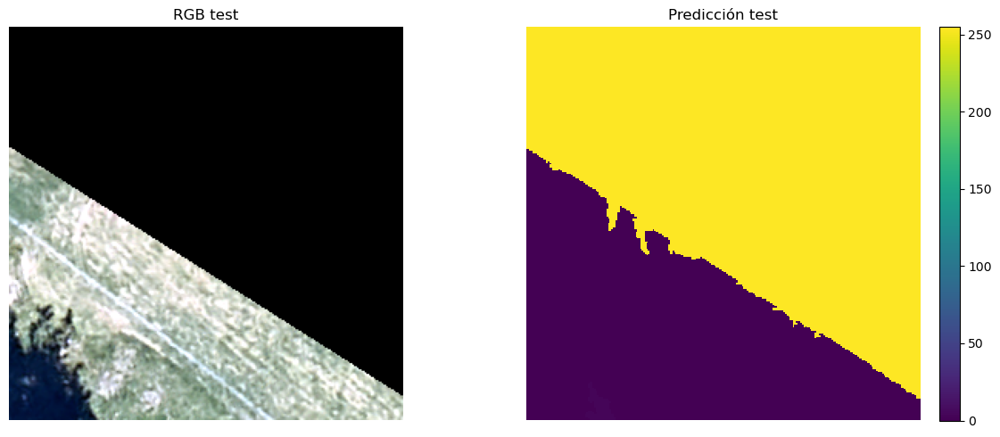

In [102]:
# ============================================================
# 44. VISUALIZACIÓN RÁPIDA DE UNA TESSELA DE TEST CON PREDICCIÓN
# ============================================================

df_test_pred_ok = df_test_inference_summary[df_test_inference_summary["predicted_pixels"] > 0].copy()

if len(df_test_pred_ok) == 0:
    print("No se encontraron tiles de test con predicción válida.")
else:
    tile_uid_show = df_test_pred_ok.iloc[0]["tile_uid"]
    tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]
    window_show = tile_row_to_window(tile_row_show)

    ortho_tile, _, ndsm_tile = read_tile_data(tile_row_show)
    tile_vars_show = sanitize_tile_inputs(ortho_tile, ndsm_tile)

    rgb_show = np.stack(
        [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
        axis=-1
    )
    rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

    with rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
        pred_tile_show = src_pred.read(1, window=window_show)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].imshow(rgb_show)
    axes[0].set_title("RGB test")
    axes[0].axis("off")

    im = axes[1].imshow(pred_tile_show, interpolation="nearest", vmin=0, vmax=255)
    axes[1].set_title("Predicción test")
    axes[1].axis("off")
    plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    del ortho_tile, ndsm_tile, tile_vars_show, rgb_show, pred_tile_show
    gc.collect()

## 46. Resultado de esta fase

Al finalizar este bloque ya queda disponible:

- el raster de predicción sobre `test`
- un resumen por tile de la inferencia
- un resumen global de tiempo y emisiones
- una salida pixel-level lista para evaluación final comparable

### Importancia metodológica

Este es el punto donde el método clásico deja de expresarse solo como clasificación de superpíxeles y pasa a convertirse en una salida raster directamente comparable con la salida de U-Net.

In [144]:
# ============================================================
# 46. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 5 COMPLETADA")
print("- Inferencia en test: OK")
print("- Reconstrucción pixel a pixel: OK")
print("- Escritura del raster predicho: OK")
print("- Resumen por tile: OK")
print("- Resumen global de inferencia: OK")
print("- CodeCarbon inferencia: OK (si estaba disponible)")

gc.collect()

FASE 5 COMPLETADA
- Inferencia en test: OK
- Reconstrucción pixel a pixel: OK
- Escritura del raster predicho: OK
- Resumen por tile: OK
- Resumen global de inferencia: OK
- CodeCarbon inferencia: OK (si estaba disponible)


41

## 47. Evaluación final comparable sobre test

En esta fase se evalúa la predicción final del método clásico sobre el split `test`.

### Principio de comparabilidad

Aunque el modelo clásico aprende a nivel de superpíxel, la comparación justa con U-Net debe realizarse sobre:

- un raster reconstruido
- a resolución de píxel
- usando el mismo split espacial
- usando las mismas clases
- ignorando `255`

### Métricas finales a calcular

- `overall_acc`
- `macro_f1`
- `mean_iou`
- precisión, recall, F1 e IoU por clase
- matriz de confusión
- `Boundary-F1` multiclase con tolerancia de 2 píxeles
- `Boundary-F1` para la clase `construccion` con tolerancia de 2 píxeles

## 48. Regla de ignorar `255`

Todos los cálculos de métricas deben ignorar `255`.

En esta implementación, un píxel solo entra a evaluación si:

- `ground truth != 255`
- `predicción != 255`
- ambos valores pertenecen al conjunto de clases válidas

### Nota

Esto hace explícito que los píxeles marcados como ignorados no deben influir en las métricas finales.

In [145]:
# ============================================================
# 47. IMPORTS ESPECÍFICOS DEL BLOQUE DE EVALUACIÓN FINAL
# ============================================================

from scipy.ndimage import binary_dilation
from skimage.morphology import disk

print("Imports del bloque 6 cargados.")

Imports del bloque 6 cargados.


In [146]:
# ============================================================
# 48. FUNCIONES AUXILIARES PARA EVALUACIÓN PIXEL A PIXEL
# ============================================================

def build_eval_mask(gt: np.ndarray, pred: np.ndarray, valid_classes: List[int], ignore_index: int = 255) -> np.ndarray:
    """
    Máscara de píxeles válidos para evaluación final.
    """
    valid_gt = np.isin(gt, valid_classes)
    valid_pred = np.isin(pred, valid_classes)

    eval_mask = (
        (gt != ignore_index) &
        (pred != ignore_index) &
        valid_gt &
        valid_pred
    )
    return eval_mask


def make_label_lut(valid_classes: List[int], max_value: int = 255) -> np.ndarray:
    """
    LUT para mapear etiquetas originales a índices 0..n-1.
    """
    lut = np.full(max_value + 1, -1, dtype=np.int16)
    for i, cls in enumerate(valid_classes):
        lut[int(cls)] = i
    return lut


LABEL_LUT = make_label_lut(VALID_CLASSES, max_value=255)


def update_confusion_matrix_from_arrays(
    cm: np.ndarray,
    gt: np.ndarray,
    pred: np.ndarray,
    valid_classes: List[int],
    ignore_index: int = 255
) -> Tuple[np.ndarray, Dict[str, int]]:
    """
    Actualiza una matriz de confusión acumulada a partir de un tile.
    """
    eval_mask = build_eval_mask(gt, pred, valid_classes=valid_classes, ignore_index=ignore_index)

    gt_valid = gt[eval_mask].astype(np.uint8, copy=False)
    pred_valid = pred[eval_mask].astype(np.uint8, copy=False)

    if gt_valid.size > 0:
        gt_idx = LABEL_LUT[gt_valid]
        pred_idx = LABEL_LUT[pred_valid]

        n = len(valid_classes)
        linear_idx = gt_idx * n + pred_idx
        cm += np.bincount(linear_idx, minlength=n * n).reshape(n, n)

    diag = {
        "gt_valid_pixels": int(np.sum(np.isin(gt, valid_classes) & (gt != ignore_index))),
        "pred_valid_pixels": int(np.sum(np.isin(pred, valid_classes) & (pred != ignore_index))),
        "eval_pixels": int(eval_mask.sum()),
        "gt_ignore_pixels": int(np.sum(gt == ignore_index)),
        "pred_ignore_pixels": int(np.sum(pred == ignore_index)),
        "pred_ignore_on_valid_gt": int(np.sum((gt != ignore_index) & np.isin(gt, valid_classes) & (pred == ignore_index))),
    }

    return cm, diag

In [147]:
# ============================================================
# 48.1 MÉTRICAS A PARTIR DE LA MATRIZ DE CONFUSIÓN
# ============================================================

def metrics_from_confusion_matrix(cm: np.ndarray, valid_classes: List[int]) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Calcula métricas globales y por clase a partir de la matriz de confusión.
    """
    cm = cm.astype(np.float64, copy=False)

    tp = np.diag(cm)
    support_true = cm.sum(axis=1)
    support_pred = cm.sum(axis=0)

    precision = np.divide(tp, support_pred, out=np.zeros_like(tp), where=(support_pred > 0))
    recall = np.divide(tp, support_true, out=np.zeros_like(tp), where=(support_true > 0))
    f1 = np.divide(
        2 * precision * recall,
        precision + recall,
        out=np.zeros_like(tp),
        where=((precision + recall) > 0)
    )

    union = support_true + support_pred - tp
    iou = np.divide(tp, union, out=np.zeros_like(tp), where=(union > 0))

    total = cm.sum()
    overall_acc = float(tp.sum() / total) if total > 0 else np.nan
    macro_f1 = float(np.mean(f1)) if len(f1) > 0 else np.nan
    mean_iou = float(np.mean(iou)) if len(iou) > 0 else np.nan

    df_global = pd.DataFrame([{
        "overall_acc": overall_acc,
        "macro_f1": macro_f1,
        "mean_iou": mean_iou,
        "eval_pixels": int(total)
    }])

    rows = []
    for i, cls in enumerate(valid_classes):
        rows.append({
            "clase_id": cls,
            "clase_nombre": CLASS_MAP[cls],
            "precision": float(precision[i]),
            "recall": float(recall[i]),
            "f1": float(f1[i]),
            "iou": float(iou[i]),
            "support_true_px": int(support_true[i]),
            "support_pred_px": int(support_pred[i]),
        })
    df_per_class = pd.DataFrame(rows)

    df_cm = pd.DataFrame(
        cm.astype(np.int64),
        index=[f"true_{CLASS_MAP[c]}" for c in valid_classes],
        columns=[f"pred_{CLASS_MAP[c]}" for c in valid_classes]
    )

    return df_global, df_per_class, df_cm

print("Funciones de métricas pixel-level listas.")

Funciones de métricas pixel-level listas.


## 49. Evaluación pixel a pixel sobre test

En esta etapa se recorre el split `test` por tiles y se acumula una matriz de confusión global.

### Ventajas de este enfoque

- evita cargar todo el raster en memoria
- mantiene la evaluación alineada con el split espacial
- produce métricas finales sobre la predicción reconstruida

In [148]:
# ============================================================
# 49. EVALUACIÓN PIXEL A PIXEL SOBRE TEST
# ============================================================

df_test_tiles = df_tiles[df_tiles["split"] == "test"].copy().reset_index(drop=True)

cm_test = np.zeros((len(VALID_CLASSES), len(VALID_CLASSES)), dtype=np.int64)
eval_rows = []

with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    for i, (_, tile_row) in enumerate(df_test_tiles.iterrows(), start=1):
        window = tile_row_to_window(tile_row)

        gt_tile = src_gt.read(1, window=window).astype(np.uint8, copy=False)
        pred_tile = src_pred.read(1, window=window).astype(np.uint8, copy=False)

        cm_test, diag = update_confusion_matrix_from_arrays(
            cm=cm_test,
            gt=gt_tile,
            pred=pred_tile,
            valid_classes=VALID_CLASSES,
            ignore_index=IGNORE_INDEX
        )

        eval_rows.append({
            "tile_uid": tile_row["tile_uid"],
            "row_off": int(tile_row["row_off"]),
            "col_off": int(tile_row["col_off"]),
            **diag
        })

        if i % 25 == 0 or i == len(df_test_tiles):
            print(f"[eval test] procesados {i}/{len(df_test_tiles)} tiles")

        del gt_tile, pred_tile
        gc.collect()

df_test_eval_diag = pd.DataFrame(eval_rows)

test_eval_diag_fp = FEATURE_CACHE_DIR / "test_eval_tile_diagnostics.csv"
df_test_eval_diag.to_csv(test_eval_diag_fp, index=False)

print("Diagnóstico de evaluación guardado en:", test_eval_diag_fp)

[eval test] procesados 25/1177 tiles
[eval test] procesados 50/1177 tiles
[eval test] procesados 75/1177 tiles
[eval test] procesados 100/1177 tiles
[eval test] procesados 125/1177 tiles
[eval test] procesados 150/1177 tiles
[eval test] procesados 175/1177 tiles
[eval test] procesados 200/1177 tiles
[eval test] procesados 225/1177 tiles
[eval test] procesados 250/1177 tiles
[eval test] procesados 275/1177 tiles
[eval test] procesados 300/1177 tiles
[eval test] procesados 325/1177 tiles
[eval test] procesados 350/1177 tiles
[eval test] procesados 375/1177 tiles
[eval test] procesados 400/1177 tiles
[eval test] procesados 425/1177 tiles
[eval test] procesados 450/1177 tiles
[eval test] procesados 475/1177 tiles
[eval test] procesados 500/1177 tiles
[eval test] procesados 525/1177 tiles
[eval test] procesados 550/1177 tiles
[eval test] procesados 575/1177 tiles
[eval test] procesados 600/1177 tiles
[eval test] procesados 625/1177 tiles
[eval test] procesados 650/1177 tiles
[eval test] pro

In [149]:
# ============================================================
# 49.1 MÉTRICAS FINALES PIXEL A PIXEL
# ============================================================

df_test_global_metrics, df_test_per_class_metrics, df_test_cm = metrics_from_confusion_matrix(
    cm=cm_test,
    valid_classes=VALID_CLASSES
)

print("Métricas globales finales sobre test:")
display(df_test_global_metrics)

print("Métricas por clase sobre test:")
display(df_test_per_class_metrics)

print("Matriz de confusión final sobre test:")
display(df_test_cm)
df_test_global_metrics.to_excel(RESULTADOS_DIR / "metricasfinales_globales_pxp_test_SLIC.xlsx", index=False)
df_test_per_class_metrics.to_excel(RESULTADOS_DIR / "metricas_finales_pxp_clase_test_SLIC.xlsx", index=False)
df_test_cm.to_excel(RESULTADOS_DIR / "matriz_finales_pxp_test_SLIC.xlsx", index=False)

Métricas globales finales sobre test:


,overall_acc,macro_f1,mean_iou,eval_pixels
0,0.865507,0.684852,0.593707,29526479


Métricas por clase sobre test:


,clase_id,clase_nombre,precision,recall,f1,iou,support_true_px,support_pred_px
0,0,fondo,0.865013,0.872086,0.868535,0.767620,14551670,14670660
1,1,construccion,0.953078,0.942736,0.947879,0.900922,4976760,4922757
2,2,pavimento,0.833732,0.846486,0.840061,0.724228,8738499,8872171
3,3,vegetacion,0.737003,0.672736,0.703404,0.542501,1147940,1047838
4,4,agua,0.307439,0.035956,0.064382,0.033262,111610,13053


Matriz de confusión final sobre test:


,pred_fondo,pred_construccion,pred_pavimento,pred_vegetacion,pred_agua
true_fondo,12690310,216805,1404106,234560,5889
true_construccion,245662,4691772,38766,560,0
true_pavimento,1290489,13614,7397016,36035,1345
true_vegetacion,343682,566,29626,772260,1806
true_agua,100517,0,2657,4423,4013


In [151]:
# ============================================================
# 49.2 RESUMEN DE PÍXELES EVALUADOS E IGNORADOS
# ============================================================

df_test_eval_global = pd.DataFrame([{
    "n_test_tiles": len(df_test_tiles),
    "gt_valid_pixels_sum": int(df_test_eval_diag["gt_valid_pixels"].sum()),
    "pred_valid_pixels_sum": int(df_test_eval_diag["pred_valid_pixels"].sum()),
    "eval_pixels_sum": int(df_test_eval_diag["eval_pixels"].sum()),
    "gt_ignore_pixels_sum": int(df_test_eval_diag["gt_ignore_pixels"].sum()),
    "pred_ignore_pixels_sum": int(df_test_eval_diag["pred_ignore_pixels"].sum()),
    "pred_ignore_on_valid_gt_sum": int(df_test_eval_diag["pred_ignore_on_valid_gt"].sum()),
}])
df_test_eval_global.to_excel(RESULTADOS_DIR / "resumenfinal_pixeles_eva_igno_test_SLIC.xlsx", index=False)
display(df_test_eval_global)

,n_test_tiles,gt_valid_pixels_sum,pred_valid_pixels_sum,eval_pixels_sum,gt_ignore_pixels_sum,pred_ignore_pixels_sum,pred_ignore_on_valid_gt_sum
0,1177,29535733,29526479,29526479,47600139,47609393,9254


## 50. Boundary-F1 con tolerancia de 2 píxeles

Además de las métricas basadas en clasificación por píxel, se calculará una métrica de borde.

### Motivación

Dos modelos pueden tener IoU similar, pero diferir en qué tan bien respetan la geometría de los objetos.

Por eso se calculará:

- **Boundary-F1 multiclase**
- **Boundary-F1 para construcción**

### Implementación adoptada

Se utilizará un enfoque **one-vs-rest por clase**:

1. para cada clase se construye una máscara binaria
2. se extraen bordes
3. se permite una tolerancia espacial de `2 px`
4. se calcula precisión de borde, recall de borde y F1 de borde
5. el resultado multiclase se obtiene como promedio macro entre clases

### Importante

Como la métrica de borde necesita vecindad espacial, se usará un **halo** alrededor de cada tile para evitar errores artificiales en bordes de tesela.

In [152]:
# ============================================================
# 50. FUNCIONES AUXILIARES PARA BOUNDARY-F1
# ============================================================

BOUNDARY_TOL_PX = 2
BOUNDARY_STRUCT = disk(BOUNDARY_TOL_PX).astype(bool)


def get_padded_window_and_center_slices(
    tile_row: pd.Series,
    pad: int,
    raster_width: int,
    raster_height: int
) -> Tuple[Window, Tuple[slice, slice]]:
    """
    Devuelve una ventana expandida por halo y los slices correspondientes al área central.
    """
    row_off = int(tile_row["row_off"])
    col_off = int(tile_row["col_off"])
    h = int(tile_row["height"])
    w = int(tile_row["width"])

    row0 = max(0, row_off - pad)
    col0 = max(0, col_off - pad)
    row1 = min(raster_height, row_off + h + pad)
    col1 = min(raster_width, col_off + w + pad)

    padded_window = Window(
        col_off=col0,
        row_off=row0,
        width=(col1 - col0),
        height=(row1 - row0)
    )

    center_row_slice = slice(row_off - row0, row_off - row0 + h)
    center_col_slice = slice(col_off - col0, col_off - col0 + w)

    return padded_window, (center_row_slice, center_col_slice)


def compute_boundary_stats_for_binary_class(
    gt_bin: np.ndarray,
    pred_bin: np.ndarray,
    tolerance_struct: np.ndarray,
    center_slices: Tuple[slice, slice]
) -> Dict[str, int]:
    """
    Calcula conteos de boundary matching para una clase binaria dentro del área central,
    usando halo para contexto.
    """
    gt_b = find_boundaries(gt_bin, mode="inner")
    pred_b = find_boundaries(pred_bin, mode="inner")

    gt_b_dil = binary_dilation(gt_b, structure=tolerance_struct)
    pred_b_dil = binary_dilation(pred_b, structure=tolerance_struct)

    rs, cs = center_slices

    gt_b_c = gt_b[rs, cs]
    pred_b_c = pred_b[rs, cs]
    gt_b_dil_c = gt_b_dil[rs, cs]
    pred_b_dil_c = pred_b_dil[rs, cs]

    matched_pred = pred_b_c & gt_b_dil_c
    matched_gt = gt_b_c & pred_b_dil_c

    return {
        "pred_boundary_px": int(pred_b_c.sum()),
        "gt_boundary_px": int(gt_b_c.sum()),
        "matched_pred_boundary_px": int(matched_pred.sum()),
        "matched_gt_boundary_px": int(matched_gt.sum()),
    }


def boundary_metrics_from_counts(pred_boundary_px: int, gt_boundary_px: int, matched_pred_boundary_px: int, matched_gt_boundary_px: int) -> Dict[str, float]:
    """
    Convierte conteos acumulados a precision/recall/F1 de borde.
    """
    precision = matched_pred_boundary_px / pred_boundary_px if pred_boundary_px > 0 else 0.0
    recall = matched_gt_boundary_px / gt_boundary_px if gt_boundary_px > 0 else 0.0

    if (precision + recall) > 0:
        f1 = 2 * precision * recall / (precision + recall)
    else:
        f1 = 0.0

    return {
        "boundary_precision": float(precision),
        "boundary_recall": float(recall),
        "boundary_f1": float(f1),
    }

print("Funciones de Boundary-F1 listas.")

Funciones de Boundary-F1 listas.


In [153]:
# ============================================================
# 50.1 EVALUACIÓN BOUNDARY-F1 SOBRE TEST
# ============================================================

boundary_counts = {
    cls: {
        "pred_boundary_px": 0,
        "gt_boundary_px": 0,
        "matched_pred_boundary_px": 0,
        "matched_gt_boundary_px": 0,
    }
    for cls in VALID_CLASSES
}

with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    for i, (_, tile_row) in enumerate(df_test_tiles.iterrows(), start=1):
        padded_window, center_slices = get_padded_window_and_center_slices(
            tile_row=tile_row,
            pad=BOUNDARY_TOL_PX,
            raster_width=RASTER_WIDTH,
            raster_height=RASTER_HEIGHT
        )

        gt_pad = src_gt.read(1, window=padded_window).astype(np.uint8, copy=False)
        pred_pad = src_pred.read(1, window=padded_window).astype(np.uint8, copy=False)

        valid_pad = build_eval_mask(gt_pad, pred_pad, valid_classes=VALID_CLASSES, ignore_index=IGNORE_INDEX)

        for cls in VALID_CLASSES:
            gt_bin = (gt_pad == cls) & valid_pad
            pred_bin = (pred_pad == cls) & valid_pad

            stats = compute_boundary_stats_for_binary_class(
                gt_bin=gt_bin,
                pred_bin=pred_bin,
                tolerance_struct=BOUNDARY_STRUCT,
                center_slices=center_slices
            )

            for k, v in stats.items():
                boundary_counts[cls][k] += int(v)

        if i % 25 == 0 or i == len(df_test_tiles):
            print(f"[boundary test] procesados {i}/{len(df_test_tiles)} tiles")

        del gt_pad, pred_pad, valid_pad
        gc.collect()

[boundary test] procesados 25/1177 tiles
[boundary test] procesados 50/1177 tiles
[boundary test] procesados 75/1177 tiles
[boundary test] procesados 100/1177 tiles
[boundary test] procesados 125/1177 tiles
[boundary test] procesados 150/1177 tiles
[boundary test] procesados 175/1177 tiles
[boundary test] procesados 200/1177 tiles
[boundary test] procesados 225/1177 tiles
[boundary test] procesados 250/1177 tiles
[boundary test] procesados 275/1177 tiles
[boundary test] procesados 300/1177 tiles
[boundary test] procesados 325/1177 tiles
[boundary test] procesados 350/1177 tiles
[boundary test] procesados 375/1177 tiles
[boundary test] procesados 400/1177 tiles
[boundary test] procesados 425/1177 tiles
[boundary test] procesados 450/1177 tiles
[boundary test] procesados 475/1177 tiles
[boundary test] procesados 500/1177 tiles
[boundary test] procesados 525/1177 tiles
[boundary test] procesados 550/1177 tiles
[boundary test] procesados 575/1177 tiles
[boundary test] procesados 600/1177 t

In [154]:
# ============================================================
# 50.2 TABLA DE BOUNDARY-F1 POR CLASE
# ============================================================

boundary_rows = []

for cls in VALID_CLASSES:
    counts = boundary_counts[cls]
    metrics = boundary_metrics_from_counts(**counts)

    boundary_rows.append({
        "clase_id": cls,
        "clase_nombre": CLASS_MAP[cls],
        **counts,
        **metrics
    })

df_boundary_per_class = pd.DataFrame(boundary_rows)
df_boundary_per_class.to_excel(RESULTADOS_DIR / "boundary_porclases_SLIC.xlsx", index=False)
display(df_boundary_per_class)

,clase_id,clase_nombre,pred_boundary_px,gt_boundary_px,matched_pred_boundary_px,matched_gt_boundary_px,boundary_precision,boundary_recall,boundary_f1
0,0,fondo,585962,230912,91122,86055,0.155508,0.372674,0.219447
1,1,construccion,97836,56260,19878,18596,0.203177,0.330537,0.251661
2,2,pavimento,409490,142003,53312,50196,0.130191,0.353485,0.190295
3,3,vegetacion,95865,37408,9652,8891,0.100683,0.237676,0.141447
4,4,agua,3909,8709,245,224,0.062676,0.025721,0.036473


In [155]:
# ============================================================
# 50.3 BOUNDARY-F1 MULTICLASE Y PARA CONSTRUCCIÓN
# ============================================================

boundary_macro_f1 = float(df_boundary_per_class["boundary_f1"].mean())

df_boundary_global = pd.DataFrame([{
    "boundary_tol_px": BOUNDARY_TOL_PX,
    "boundary_f1_multiclass_macro": boundary_macro_f1,
    "boundary_f1_construccion": float(
        df_boundary_per_class.loc[df_boundary_per_class["clase_id"] == 1, "boundary_f1"].iloc[0]
    )
}])
df_boundary_global.to_excel(RESULTADOS_DIR / "boundary_multiclase_y_construccion_SLIC.xlsx", index=False)
display(df_boundary_global)

,boundary_tol_px,boundary_f1_multiclass_macro,boundary_f1_construccion
0,2,0.167865,0.251661


## 51. Visualización comparativa final: ortofoto, ground truth y predicción

Para inspección cualitativa final, se mostrará una tesela de `test` con:

- ortofoto RGB
- ground truth
- predicción del modelo clásico

Esto ayuda a interpretar:

- la coherencia espacial de la predicción
- posibles confusiones por clase
- calidad geométrica de la salida

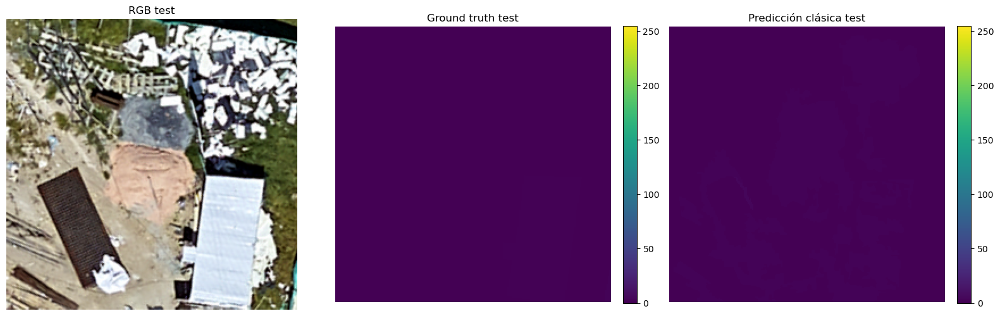

10813

In [156]:
# ============================================================
# 51. VISUALIZACIÓN COMPARATIVA FINAL EN UN TILE DE TEST
# ============================================================

# Escoger un tile de test con predicción válida y suficientes píxeles evaluados
df_test_show = df_test_eval_diag.sort_values(by=["eval_pixels"], ascending=False).reset_index(drop=True)

tile_uid_show = df_test_show.iloc[0]["tile_uid"]
tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]
window_show = tile_row_to_window(tile_row_show)

with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    gt_show = src_gt.read(1, window=window_show).astype(np.uint8, copy=False)
    pred_show = src_pred.read(1, window=window_show).astype(np.uint8, copy=False)

ortho_show, _, ndsm_show = read_tile_data(tile_row_show)
tile_vars_show = sanitize_tile_inputs(ortho_show, ndsm_show)

rgb_show = np.stack(
    [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
    axis=-1
)
rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(rgb_show)
axes[0].set_title("RGB test")
axes[0].axis("off")

im1 = axes[1].imshow(gt_show, interpolation="nearest", vmin=0, vmax=255)
axes[1].set_title("Ground truth test")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

im2 = axes[2].imshow(pred_show, interpolation="nearest", vmin=0, vmax=255)
axes[2].set_title("Predicción clásica test")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

del gt_show, pred_show, ortho_show, ndsm_show, tile_vars_show, rgb_show
gc.collect()

## Visualización comparativa final con paleta discreta y tile más representativo

La visualización de clases debe hacerse con una paleta discreta, no con una escala continua 0–255, porque las clases válidas `0..4` quedan comprimidas visualmente y pueden parecer iguales.

Además, para una inspección cualitativa más útil, conviene seleccionar un tile de test con:

- suficientes píxeles evaluados
- presencia de construcción
- varias clases presentes en el ground truth

,tile_uid,eval_pixels,gt_class_0_px,gt_class_1_px,gt_class_2_px,gt_class_3_px,gt_class_4_px,n_gt_classes_present
0,test_r005376_c017419,65536,29684,6593,25113,982,3164,5
1,test_r003840_c017931,65536,32706,4140,25696,1260,1734,5
2,test_r006912_c016907,65536,42943,2482,14606,1892,3613,5
3,test_r007680_c016651,65536,30879,566,26560,1522,6009,5
4,test_r006912_c016651,65536,14226,460,48484,831,1535,5
5,test_r003072_c017931,65536,10993,33558,0,20525,460,4
6,test_r008960_c016907,65536,35812,26543,446,2735,0,4
7,test_r005632_c017419,65536,13105,26209,24585,1637,0,4
8,test_r007168_c017931,65536,33980,24539,3574,3443,0,4
9,test_r004096_c017419,65536,9575,20007,35466,488,0,4


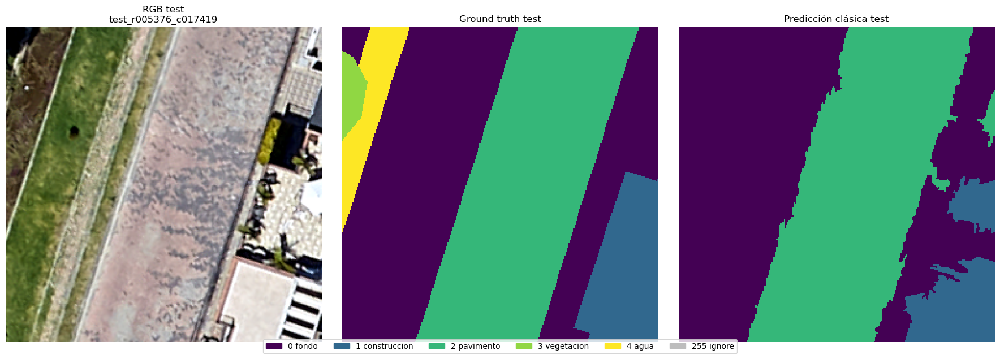

41

In [157]:
# ============================================================
# VISUALIZACIÓN FINAL MEJORADA: TILE MÁS REPRESENTATIVO + PALETA DISCRETA
# ============================================================

from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

# ------------------------------------------------------------
# 1. Construir diagnóstico de clases por tile en TEST
# ------------------------------------------------------------
test_tile_rows = []

with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    for _, tile_row in df_test_tiles.iterrows():
        window = tile_row_to_window(tile_row)

        gt_tile = src_gt.read(1, window=window).astype(np.uint8, copy=False)
        pred_tile = src_pred.read(1, window=window).astype(np.uint8, copy=False)

        eval_mask = build_eval_mask(gt_tile, pred_tile, valid_classes=VALID_CLASSES, ignore_index=IGNORE_INDEX)

        row = {
            "tile_uid": tile_row["tile_uid"],
            "eval_pixels": int(eval_mask.sum()),
        }

        # Conteo de clases en GT
        n_classes_present = 0
        for cls in VALID_CLASSES:
            count_cls = int(np.sum(gt_tile == cls))
            row[f"gt_class_{cls}_px"] = count_cls
            if count_cls > 0:
                n_classes_present += 1

        row["n_gt_classes_present"] = n_classes_present
        test_tile_rows.append(row)

        del gt_tile, pred_tile, eval_mask
        gc.collect()

df_test_tile_classes = pd.DataFrame(test_tile_rows)

# ------------------------------------------------------------
# 2. Escoger un tile más representativo
#    Prioridad:
#    - más clases en GT
#    - más construcción
#    - más eval_pixels
# ------------------------------------------------------------
df_test_tile_classes = df_test_tile_classes.sort_values(
    by=["n_gt_classes_present", "gt_class_1_px", "eval_pixels"],
    ascending=[False, False, False]
).reset_index(drop=True)

display(df_test_tile_classes.head(10))

tile_uid_show = df_test_tile_classes.iloc[0]["tile_uid"]
tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]
window_show = tile_row_to_window(tile_row_show)

# ------------------------------------------------------------
# 3. Leer datos del tile elegido
# ------------------------------------------------------------
with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    gt_show = src_gt.read(1, window=window_show).astype(np.uint8, copy=False)
    pred_show = src_pred.read(1, window=window_show).astype(np.uint8, copy=False)

ortho_show, _, ndsm_show = read_tile_data(tile_row_show)
tile_vars_show = sanitize_tile_inputs(ortho_show, ndsm_show)

rgb_show = np.stack(
    [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
    axis=-1
)
rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

# ------------------------------------------------------------
# 4. Paleta discreta de clases
#    0=fondo, 1=construccion, 2=pavimento, 3=vegetacion, 4=agua, 255=ignore
# ------------------------------------------------------------
class_colors = [
    "#440154",  # 0 fondo
    "#31688e",  # 1 construccion
    "#35b779",  # 2 pavimento
    "#90d743",  # 3 vegetacion
    "#fde725",  # 4 agua
    "#bdbdbd",  # 255 ignore
]

cmap = ListedColormap(class_colors)

# Mapeo a índices de visualización 0..5
gt_vis = np.full(gt_show.shape, 5, dtype=np.uint8)   # por defecto ignore
pred_vis = np.full(pred_show.shape, 5, dtype=np.uint8)

for cls in VALID_CLASSES:
    gt_vis[gt_show == cls] = cls
    pred_vis[pred_show == cls] = cls

norm = BoundaryNorm(boundaries=np.arange(-0.5, 6.5, 1), ncolors=cmap.N)

# ------------------------------------------------------------
# 5. Graficar
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(rgb_show)
axes[0].set_title(f"RGB test\n{tile_uid_show}")
axes[0].axis("off")

axes[1].imshow(gt_vis, cmap=cmap, norm=norm, interpolation="nearest")
axes[1].set_title("Ground truth test")
axes[1].axis("off")

axes[2].imshow(pred_vis, cmap=cmap, norm=norm, interpolation="nearest")
axes[2].set_title("Predicción clásica test")
axes[2].axis("off")

legend_patches = [
    mpatches.Patch(color=class_colors[0], label="0 fondo"),
    mpatches.Patch(color=class_colors[1], label="1 construccion"),
    mpatches.Patch(color=class_colors[2], label="2 pavimento"),
    mpatches.Patch(color=class_colors[3], label="3 vegetacion"),
    mpatches.Patch(color=class_colors[4], label="4 agua"),
    mpatches.Patch(color=class_colors[5], label="255 ignore"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=6,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout()
plt.show()

del gt_show, pred_show, ortho_show, ndsm_show, tile_vars_show, rgb_show, gt_vis, pred_vis
gc.collect()

,tile_uid,eval_pixels,gt_class_0_px,gt_class_1_px,gt_class_2_px,gt_class_3_px,gt_class_4_px,n_gt_classes_present
0,test_r005376_c017419,65536,29684,6593,25113,982,3164,5
1,test_r003840_c017931,65536,32706,4140,25696,1260,1734,5
2,test_r006912_c016907,65536,42943,2482,14606,1892,3613,5
3,test_r007680_c016651,65536,30879,566,26560,1522,6009,5
4,test_r006912_c016651,65536,14226,460,48484,831,1535,5
5,test_r003072_c017931,65536,10993,33558,0,20525,460,4
6,test_r008960_c016907,65536,35812,26543,446,2735,0,4
7,test_r005632_c017419,65536,13105,26209,24585,1637,0,4
8,test_r007168_c017931,65536,33980,24539,3574,3443,0,4
9,test_r004096_c017419,65536,9575,20007,35466,488,0,4


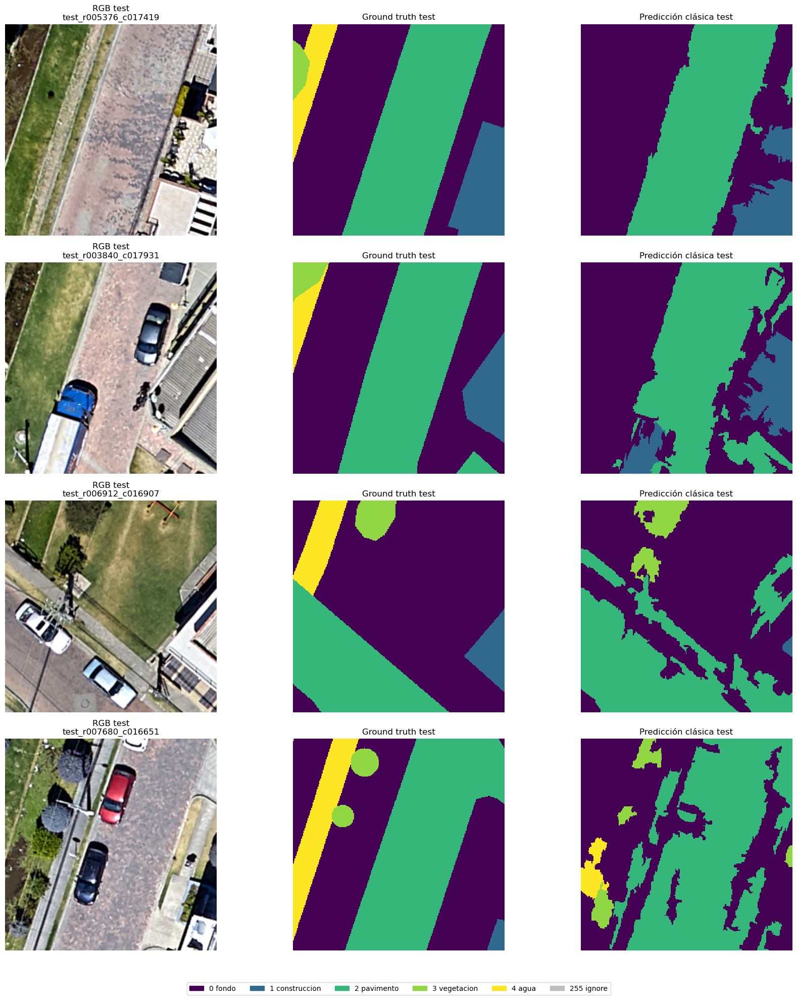

In [158]:
# ============================================================
# VISUALIZACIÓN FINAL MEJORADA: 4 TILES MÁS REPRESENTATIVOS
# ============================================================

from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
from pathlib import Path

# ------------------------------------------------------------
# 1. Construir diagnóstico de clases por tile en TEST
# ------------------------------------------------------------
test_tile_rows = []

with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
    for _, tile_row in df_test_tiles.iterrows():
        window = tile_row_to_window(tile_row)

        gt_tile = src_gt.read(1, window=window).astype(np.uint8, copy=False)
        pred_tile = src_pred.read(1, window=window).astype(np.uint8, copy=False)

        eval_mask = build_eval_mask(
            gt_tile,
            pred_tile,
            valid_classes=VALID_CLASSES,
            ignore_index=IGNORE_INDEX
        )

        row = {
            "tile_uid": tile_row["tile_uid"],
            "eval_pixels": int(eval_mask.sum()),
        }

        # Conteo de clases en GT
        n_classes_present = 0
        for cls in VALID_CLASSES:
            count_cls = int(np.sum(gt_tile == cls))
            row[f"gt_class_{cls}_px"] = count_cls
            if count_cls > 0:
                n_classes_present += 1

        row["n_gt_classes_present"] = n_classes_present
        test_tile_rows.append(row)

        del gt_tile, pred_tile, eval_mask
        gc.collect()

df_test_tile_classes = pd.DataFrame(test_tile_rows)

# ------------------------------------------------------------
# 2. Ordenar tiles más representativos
#    Prioridad:
#    - más clases en GT
#    - más construcción
#    - más eval_pixels
# ------------------------------------------------------------
df_test_tile_classes = df_test_tile_classes.sort_values(
    by=["n_gt_classes_present", "gt_class_1_px", "eval_pixels"],
    ascending=[False, False, False]
).reset_index(drop=True)

display(df_test_tile_classes.head(10))

# ------------------------------------------------------------
# 3. Seleccionar los 4 tiles más representativos
# ------------------------------------------------------------
n_show = min(4, len(df_test_tile_classes))
df_tiles_show = df_test_tile_classes.head(n_show).copy()

# ------------------------------------------------------------
# 4. Paleta discreta de clases
#    0=fondo, 1=construccion, 2=pavimento, 3=vegetacion, 4=agua, 255=ignore
# ------------------------------------------------------------
class_colors = [
    "#440154",  # 0 fondo
    "#31688e",  # 1 construccion
    "#35b779",  # 2 pavimento
    "#90d743",  # 3 vegetacion
    "#fde725",  # 4 agua
    "#bdbdbd",  # 255 ignore
]

cmap = ListedColormap(class_colors)
norm = BoundaryNorm(boundaries=np.arange(-0.5, 6.5, 1), ncolors=cmap.N)

# ------------------------------------------------------------
# 5. Crear figura con 4 filas x 3 columnas
# ------------------------------------------------------------
fig, axes = plt.subplots(n_show, 3, figsize=(18, 5 * n_show), squeeze=False)

for i, (_, row_show) in enumerate(df_tiles_show.iterrows()):
    tile_uid_show = row_show["tile_uid"]
    tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]
    window_show = tile_row_to_window(tile_row_show)

    # Leer GT y predicción
    with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
        gt_show = src_gt.read(1, window=window_show).astype(np.uint8, copy=False)
        pred_show = src_pred.read(1, window=window_show).astype(np.uint8, copy=False)

    # Leer RGB
    ortho_show, _, ndsm_show = read_tile_data(tile_row_show)
    tile_vars_show = sanitize_tile_inputs(ortho_show, ndsm_show)

    rgb_show = np.stack(
        [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
        axis=-1
    )
    rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

    # Mapear GT y pred a índices visuales 0..5
    gt_vis = np.full(gt_show.shape, 5, dtype=np.uint8)   # por defecto ignore
    pred_vis = np.full(pred_show.shape, 5, dtype=np.uint8)

    for cls in VALID_CLASSES:
        gt_vis[gt_show == cls] = cls
        pred_vis[pred_show == cls] = cls

    # ------------------------
    # Graficar fila i
    # ------------------------
    axes[i, 0].imshow(rgb_show)
    axes[i, 0].set_title(f"RGB test\n{tile_uid_show}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(gt_vis, cmap=cmap, norm=norm, interpolation="nearest")
    axes[i, 1].set_title("Ground truth test")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(pred_vis, cmap=cmap, norm=norm, interpolation="nearest")
    axes[i, 2].set_title("Predicción clásica test")
    axes[i, 2].axis("off")

    # Liberar memoria
    del gt_show, pred_show, ortho_show, ndsm_show, tile_vars_show, rgb_show, gt_vis, pred_vis
    gc.collect()

# ------------------------------------------------------------
# 6. Leyenda general
# ------------------------------------------------------------
legend_patches = [
    mpatches.Patch(color=class_colors[0], label="0 fondo"),
    mpatches.Patch(color=class_colors[1], label="1 construccion"),
    mpatches.Patch(color=class_colors[2], label="2 pavimento"),
    mpatches.Patch(color=class_colors[3], label="3 vegetacion"),
    mpatches.Patch(color=class_colors[4], label="4 agua"),
    mpatches.Patch(color=class_colors[5], label="255 ignore"),
]

fig.legend(
    handles=legend_patches,
    loc="lower center",
    ncol=6,
    bbox_to_anchor=(0.5, 0.01)
)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig(
    RESULTADOS_DIR / "4_tiles_representativos_test.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [159]:
# Tomar los mismos 4 tiles más representativos
tile_uids_comparacion = df_test_tile_classes.head(4)["tile_uid"].tolist()

df_tiles_comparacion = pd.DataFrame({
    "tile_uid": tile_uids_comparacion
})

display(df_tiles_comparacion)

df_tiles_comparacion.to_excel(
    RESULTADOS_DIR / "tiles_comparacion_slic_unet.xlsx",
    index=False
)

,tile_uid
0,test_r005376_c017419
1,test_r003840_c017931
2,test_r006912_c016907
3,test_r007680_c016651


## 52. Resumen final de métricas comparables

En esta sección se consolidan en tablas finales:

- métricas globales
- métricas por clase
- matriz de confusión
- Boundary-F1
- tiempos y emisiones de entrenamiento e inferencia

Estas tablas son las que deberían usarse en la comparación final frente a U-Net.

In [161]:
# ============================================================
# 52. TABLAS FINALES DE RESULTADOS COMPARABLES
# ============================================================

df_runtime_emissions = pd.DataFrame([
    {
        "fase": "train_rf",
        "wall_time_sec": float(train_wall_time_sec),
        "energy_kwh": float(df_train_cc["energy_consumed"].iloc[0]) if "energy_consumed" in df_train_cc.columns else np.nan,
        "emissions_kgco2eq": float(df_train_cc["emissions"].iloc[0]) if "emissions" in df_train_cc.columns else np.nan,
    },
    {
        "fase": "test_inference_rf",
        "wall_time_sec": float(test_wall_time_sec),
        "energy_kwh": float(df_test_cc["energy_consumed"].iloc[0]) if "energy_consumed" in df_test_cc.columns else np.nan,
        "emissions_kgco2eq": float(df_test_cc["emissions"].iloc[0]) if "emissions" in df_test_cc.columns else np.nan,
    },
])

display(df_test_global_metrics)
display(df_test_per_class_metrics)
display(df_test_cm)
display(df_boundary_global)
display(df_runtime_emissions)
# Ruta del archivo Excel final
ruta_excel = RESULTADOS_DIR / "tablas_finales_resultados_comparables_SLIC.xlsx"

# Guardar varias tablas en un mismo Excel, cada una en una hoja
with pd.ExcelWriter(ruta_excel, engine="openpyxl") as writer:
    
    df_test_global_metrics.to_excel(
        writer,
        sheet_name="metricas_globales",
        index=False
    )
    
    df_test_per_class_metrics.to_excel(
        writer,
        sheet_name="metricas_por_clase",
        index=False
    )
    
    df_test_cm.to_excel(
        writer,
        sheet_name="matriz_confusion",
        index=True
    )
    
    df_boundary_global.to_excel(
        writer,
        sheet_name="metricas_boundary",
        index=False
    )
    
    df_runtime_emissions.to_excel(
        writer,
        sheet_name="runtime_emisiones",
        index=False
    )

print("Archivo Excel guardado en:", ruta_excel.resolve())

,overall_acc,macro_f1,mean_iou,eval_pixels
0,0.865507,0.684852,0.593707,29526479


,clase_id,clase_nombre,precision,recall,f1,iou,support_true_px,support_pred_px
0,0,fondo,0.865013,0.872086,0.868535,0.767620,14551670,14670660
1,1,construccion,0.953078,0.942736,0.947879,0.900922,4976760,4922757
2,2,pavimento,0.833732,0.846486,0.840061,0.724228,8738499,8872171
3,3,vegetacion,0.737003,0.672736,0.703404,0.542501,1147940,1047838
4,4,agua,0.307439,0.035956,0.064382,0.033262,111610,13053


,pred_fondo,pred_construccion,pred_pavimento,pred_vegetacion,pred_agua
true_fondo,12690310,216805,1404106,234560,5889
true_construccion,245662,4691772,38766,560,0
true_pavimento,1290489,13614,7397016,36035,1345
true_vegetacion,343682,566,29626,772260,1806
true_agua,100517,0,2657,4423,4013


,boundary_tol_px,boundary_f1_multiclass_macro,boundary_f1_construccion
0,2,0.167865,0.251661


,fase,wall_time_sec,energy_kwh,emissions_kgco2eq
0,train_rf,66.209385,0.000971,0.000176
1,test_inference_rf,361.215980,0.005417,0.000984


Archivo Excel guardado en: /home/jovyan/work/datos/DATOS_AJUSTADOS/resultados/tablas_finales_resultados_comparables_SLIC.xlsx


In [162]:
# ============================================================
# 52.1 GUARDAR TABLAS FINALES
# ============================================================

test_global_fp = FEATURE_CACHE_DIR / "test_global_metrics.csv"
test_per_class_fp = FEATURE_CACHE_DIR / "test_per_class_metrics.csv"
test_cm_fp = FEATURE_CACHE_DIR / "test_confusion_matrix.csv"
boundary_per_class_fp = FEATURE_CACHE_DIR / "test_boundary_per_class.csv"
boundary_global_fp = FEATURE_CACHE_DIR / "test_boundary_global.csv"
runtime_emissions_fp = FEATURE_CACHE_DIR / "runtime_emissions_summary.csv"
test_eval_global_fp = FEATURE_CACHE_DIR / "test_eval_global_summary.csv"

df_test_global_metrics.to_csv(test_global_fp, index=False)
df_test_per_class_metrics.to_csv(test_per_class_fp, index=False)
df_test_cm.to_csv(test_cm_fp)
df_boundary_per_class.to_csv(boundary_per_class_fp, index=False)
df_boundary_global.to_csv(boundary_global_fp, index=False)
df_runtime_emissions.to_csv(runtime_emissions_fp, index=False)
df_test_eval_global.to_csv(test_eval_global_fp, index=False)

print("Archivos finales guardados:")
print(" -", test_global_fp)
print(" -", test_per_class_fp)
print(" -", test_cm_fp)
print(" -", boundary_per_class_fp)
print(" -", boundary_global_fp)
print(" -", runtime_emissions_fp)
print(" -", test_eval_global_fp)

Archivos finales guardados:
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_global_metrics.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_per_class_metrics.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_confusion_matrix.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_boundary_per_class.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_boundary_global.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/runtime_emissions_summary.csv
 - /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/test_eval_global_summary.csv


## 53. Conclusiones técnicas finales del método clásico

Al finalizar el pipeline, el método clásico basado en SLIC + Random Forest ya cuenta con:

- split espacial reproducible
- tiling consistente con el experimento deep learning
- integración multifuente de ortofoto y nDSM
- predicción reconstruida a nivel de píxel
- métricas finales comparables con U-Net
- medición de tiempo, energía y emisiones

### Aclaración metodológica final

Aunque el método clásico no aprende directamente a nivel de píxel como U-Net, la comparación se vuelve justa al:

1. reconstruir su salida como raster completo
2. evaluarla pixel a pixel
3. aplicar exactamente el mismo contrato de clases, split y métricas

In [163]:
# ============================================================
# 53. RESUMEN FINAL DE ESTA FASE
# ============================================================

print("FASE 6 COMPLETADA")
print("- Evaluación final pixel a pixel: OK")
print("- Métricas globales: OK")
print("- Métricas por clase: OK")
print("- Matriz de confusión: OK")
print("- Boundary-F1 multiclase: OK")
print("- Boundary-F1 construcción: OK")
print("- Visualización comparativa final: OK")
print("- Tablas finales guardadas: OK")

gc.collect()

FASE 6 COMPLETADA
- Evaluación final pixel a pixel: OK
- Métricas globales: OK
- Métricas por clase: OK
- Matriz de confusión: OK
- Boundary-F1 multiclase: OK
- Boundary-F1 construcción: OK
- Visualización comparativa final: OK
- Tablas finales guardadas: OK


657

***conclusión***
El método clásico basado en SLIC + Random Forest logró un desempeño global adecuado en el conjunto de prueba, con resultados especialmente fuertes para la clase construcción y un comportamiento también favorable en fondo y pavimento. La vegetación presentó un rendimiento intermedio, mientras que la clase agua mostró un desempeño deficiente, probablemente asociado a su baja representatividad y mayor dificultad de separación. En términos geométricos, los valores bajos de Boundary-F1 indican que, aunque la exactitud temática es competitiva, la precisión en los bordes es limitada, lo cual es coherente con la naturaleza por superpíxeles del método clásico

## 54. Interpretación de resultados finales del método clásico

El método clásico basado en SLIC + Random Forest alcanzó un desempeño global adecuado sobre el conjunto de prueba, con una exactitud global de 0.8655, un macro-F1 de 0.6849 y un mean IoU de 0.5937.

En términos temáticos, la clase **construcción** presentó el mejor desempeño, con valores de precisión, recall, F1 e IoU particularmente altos, lo que indica que el pipeline clásico es capaz de identificar edificaciones de manera robusta. Las clases **fondo** y **pavimento** también mostraron resultados favorables, mientras que **vegetación** alcanzó un rendimiento intermedio. La clase **agua**, en cambio, presentó un comportamiento deficiente, probablemente asociado a su menor representación en los datos, a su desbalance respecto de otras clases y a posibles confusiones con superficies oscuras o sombras.

En conjunto, estos resultados indican que el enfoque clásico es funcional y competitivo desde el punto de vista de la exactitud temática, especialmente para la clase de mayor interés del estudio.

## 55. Interpretación geométrica a partir de Boundary-F1

Los resultados de Boundary-F1 muestran un comportamiento más limitado que las métricas temáticas tradicionales. En particular, el Boundary-F1 multiclase y el Boundary-F1 para la clase construcción presentan valores moderados a bajos, lo que sugiere que la delimitación geométrica de los objetos no es tan precisa como su clasificación temática.

Este resultado es coherente con la naturaleza del método propuesto. Aunque la evaluación final se realiza a nivel de píxel, el modelo clásico no aprende directamente contornos pixel a pixel, sino que asigna etiquetas a regiones definidas previamente por SLIC. En consecuencia, la calidad geométrica final depende en buena medida de la segmentación inicial por superpíxeles y de su capacidad para ajustarse a los bordes reales de los objetos.

Por tanto, el método clásico puede presentar una exactitud temática elevada, especialmente en construcción, pero una capacidad más limitada para reproducir con precisión los contornos finos de las coberturas urbanas.

## 56. Conclusión técnica del método clásico

El flujo clásico basado en SLIC + Random Forest constituye una línea base reproducible, interpretable y metodológicamente comparable con U-Net. Su principal fortaleza radica en la clasificación temática de la clase construcción, donde alcanza un desempeño muy alto. Asimismo, ofrece resultados sólidos en otras coberturas como fondo y pavimento.

Sin embargo, el método presenta dos limitaciones principales. La primera es su menor capacidad para modelar clases poco representadas o más difíciles, como agua. La segunda es su precisión geométrica más limitada, evidenciada por los valores de Boundary-F1, lo que sugiere una menor capacidad para ajustar bordes con detalle fino.

En consecuencia, este método resulta adecuado como línea base clásica para contrastar con un modelo deep learning, ya que permite evaluar no solo la exactitud temática, sino también las diferencias en calidad geométrica y en desempeño computacional.

## 57. Relación metodológica con U-Net

Aunque SLIC + Random Forest no aprende directamente a nivel de píxel como U-Net, la comparación entre ambos enfoques es metodológicamente válida porque en este experimento se garantizó que ambos compartieran:

- el mismo contrato de clases
- el mismo `ignore_index`
- el mismo split espacial
- el mismo esquema de tiling
- la misma lógica de evaluación final sobre `test`
- las mismas métricas globales y por clase
- la misma evaluación geométrica mediante Boundary-F1
- la misma medición de tiempo, energía y emisiones

De esta manera, las diferencias observadas entre ambos métodos podrán interpretarse como diferencias reales entre un enfoque clásico basado en superpíxeles y un enfoque deep learning basado en aprendizaje pixel-level.

In [164]:
# ============================================================
# 57. TABLA RESUMEN FINAL DEL MÉTODO CLÁSICO
# ============================================================

df_classical_summary = pd.DataFrame([{
    "metodo": "SLIC + Random Forest",
    "overall_acc": float(df_test_global_metrics["overall_acc"].iloc[0]),
    "macro_f1": float(df_test_global_metrics["macro_f1"].iloc[0]),
    "mean_iou": float(df_test_global_metrics["mean_iou"].iloc[0]),
    "f1_construccion": float(df_test_per_class_metrics.loc[df_test_per_class_metrics["clase_id"] == 1, "f1"].iloc[0]),
    "iou_construccion": float(df_test_per_class_metrics.loc[df_test_per_class_metrics["clase_id"] == 1, "iou"].iloc[0]),
    "boundary_f1_multiclass": float(df_boundary_global["boundary_f1_multiclass_macro"].iloc[0]),
    "boundary_f1_construccion": float(df_boundary_global["boundary_f1_construccion"].iloc[0]),
    "train_wall_time_sec": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "wall_time_sec"].iloc[0]),
    "train_energy_kwh": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "energy_kwh"].iloc[0]),
    "train_emissions_kgco2eq": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "emissions_kgco2eq"].iloc[0]),
    "test_wall_time_sec": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "wall_time_sec"].iloc[0]),
    "test_energy_kwh": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "energy_kwh"].iloc[0]),
    "test_emissions_kgco2eq": float(df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "emissions_kgco2eq"].iloc[0]),
}])

display(df_classical_summary)

classical_summary_fp = FEATURE_CACHE_DIR / "classical_method_final_summary.csv"
df_classical_summary.to_csv(classical_summary_fp, index=False)
df_classical_summary.to_excel(RESULTADOS_DIR / "METODO_CLASICO_FINAL_SLIC.xlsx", index=False)
print("Resumen final del método clásico guardado en:", classical_summary_fp)

,metodo,overall_acc,macro_f1,mean_iou,f1_construccion,iou_construccion,boundary_f1_multiclass,boundary_f1_construccion,train_wall_time_sec,train_energy_kwh,train_emissions_kgco2eq,test_wall_time_sec,test_energy_kwh,test_emissions_kgco2eq
0,SLIC + Random Forest,0.865507,0.684852,0.593707,0.947879,0.900922,0.167865,0.251661,66.209385,0.000971,0.000176,361.21598,0.005417,0.000984


Resumen final del método clásico guardado en: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/classical_method_final_summary.csv


## 59. Conclusiones generales del notebook

En este notebook se implementó un flujo clásico de segmentación semántica urbana basado en **SLIC + Random Forest**, diseñado explícitamente para ser comparable con un experimento de **U-Net preentrenada**. Para ello, se respetó el mismo contrato metodológico en términos de clases, `ignore_index`, orden conceptual de canales, split espacial, esquema de tiling y métricas finales de evaluación.

Desde el punto de vista metodológico, el pipeline permitió integrar información multifuente a partir de una ortofoto multibanda (`R`, `G`, `B`, `NIR`) y un raster de altura (`nDSM`). Aunque la segmentación inicial por superpíxeles se adoptó finalmente sobre **RGB solamente**, la clasificación supervisada sí incorporó variables derivadas de `R`, `G`, `B`, `NIR`, `HEIGHT` y `NDVI`, lo que permitió conservar el carácter multifuente del experimento.

Los resultados obtenidos sobre el conjunto de prueba muestran que el enfoque clásico es funcional y competitivo como línea base. En particular, la clase **construcción**, que constituye el objetivo central del estudio, alcanzó un desempeño muy alto en términos de precisión, recall, F1 e IoU. Asimismo, las clases **fondo** y **pavimento** presentaron resultados sólidos, mientras que **vegetación** mostró un comportamiento intermedio. La clase **agua** fue la de peor desempeño, lo cual sugiere limitaciones asociadas a su menor representación y a una separación más difícil frente a otras coberturas oscuras o de baja reflectancia.

Desde el punto de vista geométrico, los valores de **Boundary-F1** evidencian que la precisión de contornos es más limitada que la exactitud temática. Este comportamiento es coherente con la naturaleza del método clásico, ya que la clasificación final depende de regiones previamente definidas por SLIC y no de un aprendizaje directo pixel a pixel. En consecuencia, el enfoque SLIC + Random Forest puede ofrecer una segmentación temáticamente robusta, pero con menor capacidad para reproducir con alta fidelidad los bordes finos de los objetos urbanos.

En síntesis, este notebook demuestra que el método clásico basado en superpíxeles constituye una línea base **reproducible, interpretable y metodológicamente defendible** para la segmentación semántica de coberturas urbanas. Su principal fortaleza radica en la identificación temática de edificaciones, mientras que sus principales limitaciones se observan en clases minoritarias y en la definición geométrica de bordes. Por estas razones, el experimento queda preparado para una comparación justa frente a U-Net, no solo en términos de exactitud temática, sino también de calidad geométrica y desempeño computacional.

## 60. Comparación final entre el método clásico y U-Net

En esta sección se comparan los resultados del método clásico basado en **SLIC + Random Forest** con los resultados del modelo **U-Net preentrenado**.

### Criterio de comparación principal

Aunque en el notebook de U-Net se evaluaron dos variantes:

- `RGB`
- `RGB+NIR+HEIGHT`

la comparación principal con el método clásico se realizará contra la variante **`RGB+NIR+HEIGHT`**, porque es la más estrictamente comparable desde el punto de vista metodológico. Esto se debe a que ambos enfoques incorporan información multifuente asociada a:

- ortofoto multibanda
- información de altura
- mismo conjunto de prueba
- mismo contrato de clases
- misma evaluación final sobre raster reconstruido
- mismas métricas temáticas y geométricas

La variante `RGB` de U-Net se conservará como referencia complementaria para mostrar el efecto de incluir información multifuente dentro del enfoque deep learning.

## 61. Registro de resultados finales de U-Net

A continuación se consolidan las métricas finales obtenidas en el notebook de U-Net.

Se registran dos variantes:

- **U-Net RGB**
- **U-Net RGB+NIR+HEIGHT**

La variante multifuente será la utilizada en la comparación principal contra el método clásico.

In [166]:
# ============================================================
# 60. RESULTADOS FINALES DE U-NET
# ============================================================

# Variante U-Net RGB
UNET_RGB_RESULTS = {
    "metodo": "U-Net RGB",
    "overall_acc": 0.878775,
    "macro_f1": 0.702237,
    "mean_iou": 0.619670,

    "f1_construccion": 0.897851,
    "iou_construccion": 0.814636,

    "boundary_f1_multiclass": 0.308963,
    "boundary_f1_construccion": 0.459603,

    # Métricas computacionales:
    # Se deja train_wall_time_sec para RGB porque sí aparece claramente en tu salida.
    # CodeCarbon no estuvo disponible, por eso emisiones quedan en NaN.
    "train_wall_time_sec": 5139.53,
    "train_energy_kwh": np.nan,
    "train_emissions_kgco2eq": np.nan,

    # Inferencia RGB sí aparece reportada en el notebook
    "test_wall_time_sec": 16.71,
    "test_energy_kwh": np.nan,
    "test_emissions_kgco2eq": np.nan,
}

# Variante U-Net multifuente: RGB + NIR + HEIGHT
UNET_MULTISOURCE_RESULTS = {
    "metodo": "U-Net preentrenada",
    "overall_acc": 0.903976,
    "macro_f1": 0.715829,
    "mean_iou": 0.649553,

    "f1_construccion": 0.959620,
    "iou_construccion": 0.922374,

    "boundary_f1_multiclass": 0.362221,
    "boundary_f1_construccion": 0.561411,

    # En la evidencia que compartiste no hay una medición computacional multifuente
    # suficientemente confiable y comparable; por eso se dejan como NaN.
    "train_wall_time_sec": np.nan,
    "train_energy_kwh": np.nan,
    "train_emissions_kgco2eq": np.nan,

    "test_wall_time_sec": np.nan,
    "test_energy_kwh": np.nan,
    "test_emissions_kgco2eq": np.nan,
}

df_unet_variants = pd.DataFrame([UNET_RGB_RESULTS, UNET_MULTISOURCE_RESULTS])
df_unet_variants.to_excel(RESULTADOS_DIR / "RESULTADOS_FINALES_UNET.xlsx", index=False)
display(df_unet_variants)

,metodo,overall_acc,macro_f1,mean_iou,f1_construccion,iou_construccion,boundary_f1_multiclass,boundary_f1_construccion,train_wall_time_sec,train_energy_kwh,train_emissions_kgco2eq,test_wall_time_sec,test_energy_kwh,test_emissions_kgco2eq
0,U-Net RGB,0.878775,0.702237,0.619670,0.897851,0.814636,0.308963,0.459603,5139.53,NaN,NaN,16.71,NaN,NaN
1,U-Net preentrenada,0.903976,0.715829,0.649553,0.959620,0.922374,0.362221,0.561411,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
# ============================================================
# 60.1 MÉTRICAS POR CLASE DE U-NET
# ============================================================

df_unet_per_class = pd.DataFrame([
    # ---------------- RGB ----------------
    {"metodo": "U-Net RGB", "clase_id": 0, "clase_nombre": "fondo",        "precision": 0.909421, "recall": 0.863054, "f1": 0.885631, "iou": 0.794737, "support_true_px": 14634433},
    {"metodo": "U-Net RGB", "clase_id": 1, "clase_nombre": "construccion", "precision": 0.903410, "recall": 0.892360, "f1": 0.897851, "iou": 0.814636, "support_true_px": 5005144},
    {"metodo": "U-Net RGB", "clase_id": 2, "clase_nombre": "pavimento",    "precision": 0.833978, "recall": 0.910230, "f1": 0.870437, "iou": 0.770597, "support_true_px": 8763524},
    {"metodo": "U-Net RGB", "clase_id": 3, "clase_nombre": "vegetacion",   "precision": 0.788430, "recall": 0.864777, "f1": 0.824841, "iou": 0.701897, "support_true_px": 1153147},
    {"metodo": "U-Net RGB", "clase_id": 4, "clase_nombre": "agua",         "precision": 0.259451, "recall": 0.017295, "f1": 0.032428, "iou": 0.016481, "support_true_px": 113099},

    # ---------------- RGB+NIR+HEIGHT ----------------
    {"metodo": "U-Net preentrenada", "clase_id": 0, "clase_nombre": "fondo",        "precision": 0.912999, "recall": 0.899423, "f1": 0.906160, "iou": 0.828421, "support_true_px": 14634433},
    {"metodo": "U-Net preentrenada", "clase_id": 1, "clase_nombre": "construccion", "precision": 0.965756, "recall": 0.953561, "f1": 0.959620, "iou": 0.922374, "support_true_px": 5005144},
    {"metodo": "U-Net preentrenada", "clase_id": 2, "clase_nombre": "pavimento",    "precision": 0.872116, "recall": 0.900665, "f1": 0.886160, "iou": 0.795590, "support_true_px": 8763524},
    {"metodo": "U-Net preentrenada", "clase_id": 3, "clase_nombre": "vegetacion",   "precision": 0.788990, "recall": 0.860159, "f1": 0.823039, "iou": 0.699292, "support_true_px": 1153147},
    {"metodo": "U-Net preentrenada", "clase_id": 4, "clase_nombre": "agua",         "precision": 0.080239, "recall": 0.002140, "f1": 0.004168, "iou": 0.002088, "support_true_px": 113099},
])
df_unet_per_class.to_excel(RESULTADOS_DIR / "METRICAS_PORCLASE__AMBOS_METODOS_UNET.xlsx", index=False)
display(df_unet_per_class)

,metodo,clase_id,clase_nombre,precision,recall,f1,iou,support_true_px
0,U-Net RGB,0,fondo,0.909421,0.863054,0.885631,0.794737,14634433
1,U-Net RGB,1,construccion,0.903410,0.892360,0.897851,0.814636,5005144
2,U-Net RGB,2,pavimento,0.833978,0.910230,0.870437,0.770597,8763524
3,U-Net RGB,3,vegetacion,0.788430,0.864777,0.824841,0.701897,1153147
4,U-Net RGB,4,agua,0.259451,0.017295,0.032428,0.016481,113099
5,U-Net preentrenada,0,fondo,0.912999,0.899423,0.906160,0.828421,14634433
6,U-Net preentrenada,1,construccion,0.965756,0.953561,0.959620,0.922374,5005144
7,U-Net preentrenada,2,pavimento,0.872116,0.900665,0.886160,0.795590,8763524
8,U-Net preentrenada,3,vegetacion,0.788990,0.860159,0.823039,0.699292,1153147
9,U-Net preentrenada,4,agua,0.080239,0.002140,0.004168,0.002088,113099


## 62. Selección de la variante deep learning para la comparación principal

Antes de comparar contra el método clásico, se verifica cuál de las dos variantes de U-Net obtuvo mejor desempeño global.

La variante seleccionada para la comparación principal será aquella con mejor combinación de:

- `overall_acc`
- `macro_f1`
- `mean_iou`
- `Boundary-F1`

In [168]:
# ============================================================
# 61. COMPARACIÓN INTERNA ENTRE LAS DOS VARIANTES DE U-NET
# ============================================================

df_unet_internal_compare = df_unet_variants[[
    "metodo",
    "overall_acc",
    "macro_f1",
    "mean_iou",
    "f1_construccion",
    "iou_construccion",
    "boundary_f1_multiclass",
    "boundary_f1_construccion"
]].copy()
df_unet_internal_compare.to_excel(RESULTADOS_DIR / "COMPARACION_METRICAS_RGB_MULTIFUENTE_UNET.xlsx", index=False)
display(df_unet_internal_compare)

,metodo,overall_acc,macro_f1,mean_iou,f1_construccion,iou_construccion,boundary_f1_multiclass,boundary_f1_construccion
0,U-Net RGB,0.878775,0.702237,0.619670,0.897851,0.814636,0.308963,0.459603
1,U-Net preentrenada,0.903976,0.715829,0.649553,0.959620,0.922374,0.362221,0.561411


## 63. Resumen consolidado del método clásico

Se reorganiza el resumen del método clásico en el mismo formato que el utilizado para U-Net, con el fin de construir una comparación directa.

In [169]:
# ============================================================
# 62. CONSOLIDAR RESUMEN FINAL DEL MÉTODO CLÁSICO
# ============================================================

df_classical_summary = pd.DataFrame([{
    "metodo": "SLIC + Random Forest",
    "overall_acc": float(df_test_global_metrics["overall_acc"].iloc[0]),
    "macro_f1": float(df_test_global_metrics["macro_f1"].iloc[0]),
    "mean_iou": float(df_test_global_metrics["mean_iou"].iloc[0]),

    "f1_construccion": float(
        df_test_per_class_metrics.loc[df_test_per_class_metrics["clase_id"] == 1, "f1"].iloc[0]
    ),
    "iou_construccion": float(
        df_test_per_class_metrics.loc[df_test_per_class_metrics["clase_id"] == 1, "iou"].iloc[0]
    ),

    "boundary_f1_multiclass": float(df_boundary_global["boundary_f1_multiclass_macro"].iloc[0]),
    "boundary_f1_construccion": float(df_boundary_global["boundary_f1_construccion"].iloc[0]),

    "train_wall_time_sec": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "wall_time_sec"].iloc[0]
    ),
    "train_energy_kwh": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "energy_kwh"].iloc[0]
    ),
    "train_emissions_kgco2eq": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "train_rf", "emissions_kgco2eq"].iloc[0]
    ),

    "test_wall_time_sec": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "wall_time_sec"].iloc[0]
    ),
    "test_energy_kwh": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "energy_kwh"].iloc[0]
    ),
    "test_emissions_kgco2eq": float(
        df_runtime_emissions.loc[df_runtime_emissions["fase"] == "test_inference_rf", "emissions_kgco2eq"].iloc[0]
    ),
}])
df_classical_summary.to_excel(RESULTADOS_DIR / "METRICAS_FINALES_METODO_CLASICO_SLIC.xlsx", index=False)
display(df_classical_summary)

,metodo,overall_acc,macro_f1,mean_iou,f1_construccion,iou_construccion,boundary_f1_multiclass,boundary_f1_construccion,train_wall_time_sec,train_energy_kwh,train_emissions_kgco2eq,test_wall_time_sec,test_energy_kwh,test_emissions_kgco2eq
0,SLIC + Random Forest,0.865507,0.684852,0.593707,0.947879,0.900922,0.167865,0.251661,66.209385,0.000971,0.000176,361.21598,0.005417,0.000984


## 64. Tabla comparativa principal: método clásico vs U-Net multifuente

La comparación principal del estudio se realizará entre:

- **SLIC + Random Forest**
- **U-Net preentrenada (`RGB+NIR+HEIGHT`)**

Esta es la comparación metodológicamente más justa, porque ambos enfoques utilizan información multifuente en el mismo conjunto de prueba.

In [170]:
# ============================================================
# 63. TABLA COMPARATIVA GLOBAL PRINCIPAL
# ============================================================

df_unet_summary = pd.DataFrame([UNET_MULTISOURCE_RESULTS])

df_compare_global = pd.concat(
    [df_classical_summary, df_unet_summary],
    ignore_index=True
)

display(df_compare_global)

compare_global_fp = FEATURE_CACHE_DIR / "comparison_classical_vs_unet_global.csv"
df_compare_global.to_csv(compare_global_fp, index=False)
df_compare_global.to_excel(RESULTADOS_DIR / "tabla_comparativa_global_principal.xlsx", index=False)
print("Tabla comparativa global guardada en:", compare_global_fp)

,metodo,overall_acc,macro_f1,mean_iou,f1_construccion,iou_construccion,boundary_f1_multiclass,boundary_f1_construccion,train_wall_time_sec,train_energy_kwh,train_emissions_kgco2eq,test_wall_time_sec,test_energy_kwh,test_emissions_kgco2eq
0,SLIC + Random Forest,0.865507,0.684852,0.593707,0.947879,0.900922,0.167865,0.251661,66.209385,0.000971,0.000176,361.21598,0.005417,0.000984
1,U-Net preentrenada,0.903976,0.715829,0.649553,0.959620,0.922374,0.362221,0.561411,NaN,NaN,NaN,NaN,NaN,NaN


Tabla comparativa global guardada en: /home/jovyan/work/datos/DATOS_AJUSTADOS/outputs_slic_rf/cache/slic_rgbonly_ns500_c1p0_sig1p0_v1/comparison_classical_vs_unet_global.csv


In [171]:
# ============================================================
# 63.1 TABLA COMPARATIVA POR CLASE
# ============================================================

df_classical_per_class = df_test_per_class_metrics[[
    "clase_id", "clase_nombre", "precision", "recall", "f1", "iou", "support_true_px"
]].copy()
df_classical_per_class["metodo"] = "SLIC + Random Forest"

df_unet_per_class_main = df_unet_per_class[
    df_unet_per_class["metodo"] == "U-Net preentrenada"
].copy()

df_compare_per_class = pd.concat(
    [df_classical_per_class, df_unet_per_class_main],
    ignore_index=True
)
df_compare_per_class.to_excel(RESULTADOS_DIR / "tabla_comparativa_por_clase.xlsx", index=False)
display(df_compare_per_class)

,clase_id,clase_nombre,precision,recall,f1,iou,support_true_px,metodo
0,0,fondo,0.865013,0.872086,0.868535,0.767620,14551670,SLIC + Random Forest
1,1,construccion,0.953078,0.942736,0.947879,0.900922,4976760,SLIC + Random Forest
2,2,pavimento,0.833732,0.846486,0.840061,0.724228,8738499,SLIC + Random Forest
3,3,vegetacion,0.737003,0.672736,0.703404,0.542501,1147940,SLIC + Random Forest
4,4,agua,0.307439,0.035956,0.064382,0.033262,111610,SLIC + Random Forest
5,0,fondo,0.912999,0.899423,0.906160,0.828421,14634433,U-Net preentrenada
6,1,construccion,0.965756,0.953561,0.959620,0.922374,5005144,U-Net preentrenada
7,2,pavimento,0.872116,0.900665,0.886160,0.795590,8763524,U-Net preentrenada
8,3,vegetacion,0.788990,0.860159,0.823039,0.699292,1153147,U-Net preentrenada
9,4,agua,0.080239,0.002140,0.004168,0.002088,113099,U-Net preentrenada


In [175]:
# ============================================================
# 63.2 TABLA PIVOT DE COMPARACIÓN POR CLASE
# ============================================================

df_compare_per_class_pivot = df_compare_per_class.pivot_table(
    index="clase_nombre",
    columns="metodo",
    values=["precision", "recall", "f1", "iou", "support_true_px"]
)
display(df_compare_per_class_pivot)
df_compare_per_class_pivot.to_excel(RESULTADOS_DIR / "tabla_pivot_de_comparacion_por_clase.xlsx")

f1                                     iou                               precision                                  recall                         support_true_px  \
metodo       SLIC + Random Forest U-Net preentrenada SLIC + Random Forest U-Net preentrenada SLIC + Random Forest U-Net preentrenada SLIC + Random Forest U-Net preentrenada SLIC + Random Forest   
clase_nombre                                                                                                                                                                                        
agua                     0.064382           0.004168             0.033262           0.002088             0.307439           0.080239             0.035956           0.002140             111610.0   
construccion             0.947879           0.959620             0.900922           0.922374             0.953078           0.965756             0.942736           0.953561            4976760.0   
fondo                    0.868535           0.906160             0.767620           0.828421             0.865013           0.912999             0.872086           0.899423           14551670.0   
pavimento                0.840061           0.886160             0.724228           0.795590             0.833732           0.872116             0.846486           0.900665            8738499.0   
vegetacion               0.703404           0.823039             0.542501           0.699292             0.737003           0.788990             0.672736           0.860159            1147940.0   

                                 
metodo       U-Net preentrenada  
clase_nombre                     
agua                   113099.0  
construccion          5005144.0  
fondo                14634433.0  
pavimento             8763524.0  
vegetacion            1153147.0

## 65. Diferencia entre U-Net y el método clásico

La siguiente tabla calcula la diferencia entre ambos métodos según la convención:

**U-Net - SLIC + Random Forest**

Por tanto:

- valor positivo: ventaja de U-Net
- valor negativo: ventaja del método clásico

En tiempo, energía y emisiones, la interpretación es inversa: un valor positivo implica mayor costo computacional para U-Net.

In [176]:
# ============================================================
# 64. DIFERENCIAS GLOBALES ENTRE MÉTODOS
# ============================================================

metric_cols = [
    "overall_acc",
    "macro_f1",
    "mean_iou",
    "f1_construccion",
    "iou_construccion",
    "boundary_f1_multiclass",
    "boundary_f1_construccion",
    "train_wall_time_sec",
    "train_energy_kwh",
    "train_emissions_kgco2eq",
    "test_wall_time_sec",
    "test_energy_kwh",
    "test_emissions_kgco2eq",
]

classic_row = df_compare_global[df_compare_global["metodo"] == "SLIC + Random Forest"].iloc[0]
unet_row = df_compare_global[df_compare_global["metodo"] == "U-Net preentrenada"].iloc[0]

diff_rows = []
for m in metric_cols:
    classic_val = pd.to_numeric(classic_row[m], errors="coerce")
    unet_val = pd.to_numeric(unet_row[m], errors="coerce")

    diff_rows.append({
        "metrica": m,
        "slic_rf": classic_val,
        "unet_multifuente": unet_val,
        "unet_menos_slic_rf": (unet_val - classic_val) if pd.notna(unet_val) and pd.notna(classic_val) else np.nan
    })

df_compare_diff = pd.DataFrame(diff_rows)
df_compare_diff.to_excel(RESULTADOS_DIR / "TABLA_FINAL_FINAL_NO_VA_MAS.xlsx", index=False)
display(df_compare_diff)

,metrica,slic_rf,unet_multifuente,unet_menos_slic_rf
0,overall_acc,0.865507,0.903976,0.038469
1,macro_f1,0.684852,0.715829,0.030977
2,mean_iou,0.593707,0.649553,0.055846
3,f1_construccion,0.947879,0.959620,0.011741
4,iou_construccion,0.900922,0.922374,0.021452
5,boundary_f1_multiclass,0.167865,0.362221,0.194356
6,boundary_f1_construccion,0.251661,0.561411,0.309750
7,train_wall_time_sec,66.209385,NaN,NaN
8,train_energy_kwh,0.000971,NaN,NaN
9,train_emissions_kgco2eq,0.000176,NaN,NaN


In [178]:
# ============================================================
# 64.1 DIFERENCIAS POR CLASE (F1 E IoU)
# ============================================================

df_classic_pc = df_classical_per_class.set_index("clase_id")
df_unet_pc = df_unet_per_class_main.set_index("clase_id")

rows = []
for cls in VALID_CLASSES:
    rows.append({
        "clase_id": cls,
        "clase_nombre": CLASS_MAP[cls],
        "f1_slic_rf": float(df_classic_pc.loc[cls, "f1"]),
        "f1_unet": float(df_unet_pc.loc[cls, "f1"]),
        "delta_f1_unet_menos_slic_rf": float(df_unet_pc.loc[cls, "f1"] - df_classic_pc.loc[cls, "f1"]),
        "iou_slic_rf": float(df_classic_pc.loc[cls, "iou"]),
        "iou_unet": float(df_unet_pc.loc[cls, "iou"]),
        "delta_iou_unet_menos_slic_rf": float(df_unet_pc.loc[cls, "iou"] - df_classic_pc.loc[cls, "iou"]),
    })

df_compare_per_class_diff = pd.DataFrame(rows)
df_compare_per_class_diff.to_excel(RESULTADOS_DIR / "DIFERENCIAS_POR_CLASE_F1_IOU.xlsx", index=False)
display(df_compare_per_class_diff)

,clase_id,clase_nombre,f1_slic_rf,f1_unet,delta_f1_unet_menos_slic_rf,iou_slic_rf,iou_unet,delta_iou_unet_menos_slic_rf
0,0,fondo,0.868535,0.906160,0.037625,0.767620,0.828421,0.060801
1,1,construccion,0.947879,0.959620,0.011741,0.900922,0.922374,0.021452
2,2,pavimento,0.840061,0.886160,0.046099,0.724228,0.795590,0.071362
3,3,vegetacion,0.703404,0.823039,0.119635,0.542501,0.699292,0.156791
4,4,agua,0.064382,0.004168,-0.060214,0.033262,0.002088,-0.031174


## 66. Resumen de confusiones más frecuentes de U-Net

Además de las métricas agregadas, también es útil revisar cuáles fueron las confusiones más frecuentes dentro del modelo U-Net.

Esto permite interpretar si las mejoras o debilidades del modelo deep learning se concentran en pares específicos de clases, por ejemplo:

- fondo ↔ pavimento
- fondo ↔ construcción
- agua → fondo

In [179]:
# ============================================================
# 65. CONFUSIONES MÁS FRECUENTES DE U-NET
# ============================================================

df_unet_confusions_rgb = pd.DataFrame([
    {"ranking": 1, "real": "fondo",        "pred": "construccion", "pixeles": 956645},
    {"ranking": 2, "real": "pavimento",    "pred": "fondo",        "pixeles": 838299},
    {"ranking": 3, "real": "fondo",        "pred": "pavimento",    "pixeles": 822786},
    {"ranking": 4, "real": "construccion", "pred": "fondo",        "pixeles": 590696},
    {"ranking": 5, "real": "fondo",        "pred": "vegetacion",   "pixeles": 146736},
    {"ranking": 6, "real": "agua",         "pred": "fondo",        "pixeles": 142642},
    {"ranking": 7, "real": "vegetacion",   "pred": "fondo",        "pixeles": 116562},
    {"ranking": 8, "real": "pavimento",    "pred": "construccion", "pixeles": 80448},
    {"ranking": 9, "real": "construccion", "pred": "pavimento",    "pixeles": 71748},
    {"ranking":10, "real": "pavimento",    "pred": "vegetacion",   "pixeles": 34267},
])
df_unet_confusions_rgb["metodo"] = "U-Net RGB"

df_unet_confusions_multi = pd.DataFrame([
    {"ranking": 1, "real": "pavimento",    "pred": "fondo",        "pixeles": 1013582},
    {"ranking": 2, "real": "fondo",        "pred": "pavimento",    "pixeles": 661521},
    {"ranking": 3, "real": "construccion", "pred": "fondo",        "pixeles": 543807},
    {"ranking": 4, "real": "fondo",        "pred": "construccion", "pixeles": 501539},
    {"ranking": 5, "real": "agua",         "pred": "fondo",        "pixeles": 149551},
    {"ranking": 6, "real": "vegetacion",   "pred": "fondo",        "pixeles": 126569},
    {"ranking": 7, "real": "fondo",        "pred": "vegetacion",   "pixeles": 121788},
    {"ranking": 8, "real": "pavimento",    "pred": "vegetacion",   "pixeles": 32168},
    {"ranking": 9, "real": "vegetacion",   "pred": "pavimento",    "pixeles": 18767},
    {"ranking":10, "real": "construccion", "pred": "pavimento",    "pixeles": 17741},
])
df_unet_confusions_multi["metodo"] = "U-Net preentrenada"

display(df_unet_confusions_rgb)
display(df_unet_confusions_multi)
df_unet_confusions_multi.to_excel(RESULTADOS_DIR / "confusion_frecuente_unet_multifuente.xlsx", index=False)

,ranking,real,pred,pixeles,metodo
0,1,fondo,construccion,956645,U-Net RGB
1,2,pavimento,fondo,838299,U-Net RGB
2,3,fondo,pavimento,822786,U-Net RGB
3,4,construccion,fondo,590696,U-Net RGB
4,5,fondo,vegetacion,146736,U-Net RGB
5,6,agua,fondo,142642,U-Net RGB
6,7,vegetacion,fondo,116562,U-Net RGB
7,8,pavimento,construccion,80448,U-Net RGB
8,9,construccion,pavimento,71748,U-Net RGB
9,10,pavimento,vegetacion,34267,U-Net RGB


,ranking,real,pred,pixeles,metodo
0,1,pavimento,fondo,1013582,U-Net preentrenada
1,2,fondo,pavimento,661521,U-Net preentrenada
2,3,construccion,fondo,543807,U-Net preentrenada
3,4,fondo,construccion,501539,U-Net preentrenada
4,5,agua,fondo,149551,U-Net preentrenada
5,6,vegetacion,fondo,126569,U-Net preentrenada
6,7,fondo,vegetacion,121788,U-Net preentrenada
7,8,pavimento,vegetacion,32168,U-Net preentrenada
8,9,vegetacion,pavimento,18767,U-Net preentrenada
9,10,construccion,pavimento,17741,U-Net preentrenada


## 67. Interpretación comparativa final

La comparación entre el método clásico y U-Net debe interpretarse en tres dimensiones principales:

### Exactitud temática global
Aquí se comparan `overall_acc`, `macro_f1` y `mean_iou`, así como el comportamiento por clase.

### Calidad geométrica
Aquí se analiza la diferencia en `Boundary-F1`, especialmente para la clase construcción.

### Costo computacional
Aquí se revisan tiempos, energía y emisiones, en la medida en que los valores estén disponibles y sean comparables entre notebooks.

En este caso, la evidencia disponible sugiere que la variante **U-Net multifuente** supera a la variante clásica en métricas globales y geométricas, mientras que el método clásico conserva la ventaja en interpretabilidad y en una implementación más simple. También se observa que ambos enfoques presentan dificultades claras en la clase **agua**, aunque esa debilidad es más severa en U-Net multifuente según las métricas reportadas.

In [180]:
# ============================================================
# 66. RESUMEN TEXTUAL AUTOMÁTICO
# ============================================================

def compare_two_values(name: str, classic_val, unet_val) -> str:
    classic_val = pd.to_numeric(classic_val, errors="coerce")
    unet_val = pd.to_numeric(unet_val, errors="coerce")

    if pd.isna(classic_val) or pd.isna(unet_val):
        return f"- {name}: comparación pendiente o no disponible."

    if unet_val > classic_val:
        return f"- {name}: U-Net multifuente supera al método clásico por {unet_val - classic_val:.4f}."
    elif unet_val < classic_val:
        return f"- {name}: el método clásico supera a U-Net multifuente por {classic_val - unet_val:.4f}."
    else:
        return f"- {name}: ambos métodos obtienen el mismo valor."

classic = df_classical_summary.iloc[0]
unet = df_unet_summary.iloc[0]

comparison_lines = [
    compare_two_values("Overall Accuracy", classic["overall_acc"], unet["overall_acc"]),
    compare_two_values("Macro F1", classic["macro_f1"], unet["macro_f1"]),
    compare_two_values("Mean IoU", classic["mean_iou"], unet["mean_iou"]),
    compare_two_values("F1 construcción", classic["f1_construccion"], unet["f1_construccion"]),
    compare_two_values("IoU construcción", classic["iou_construccion"], unet["iou_construccion"]),
    compare_two_values("Boundary-F1 multiclase", classic["boundary_f1_multiclass"], unet["boundary_f1_multiclass"]),
    compare_two_values("Boundary-F1 construcción", classic["boundary_f1_construccion"], unet["boundary_f1_construccion"]),
]

print("Resumen comparativo automático:")
for line in comparison_lines:
    print(line)

Resumen comparativo automático:
- Overall Accuracy: U-Net multifuente supera al método clásico por 0.0385.
- Macro F1: U-Net multifuente supera al método clásico por 0.0310.
- Mean IoU: U-Net multifuente supera al método clásico por 0.0558.
- F1 construcción: U-Net multifuente supera al método clásico por 0.0117.
- IoU construcción: U-Net multifuente supera al método clásico por 0.0215.
- Boundary-F1 multiclase: U-Net multifuente supera al método clásico por 0.1944.
- Boundary-F1 construcción: U-Net multifuente supera al método clásico por 0.3098.


## 68. Conclusión comparativa final

La evidencia obtenida indica que **U-Net preentrenada con entrada multifuente (`RGB+NIR+HEIGHT`)** constituye el mejor modelo dentro del enfoque deep learning evaluado y, al mismo tiempo, supera al método clásico **SLIC + Random Forest** en las métricas globales principales y en la calidad geométrica de contornos.

La mejora más relevante se observa en la capacidad de delimitar espacialmente las coberturas, lo cual se refleja en los valores de **Boundary-F1**, donde U-Net presenta una ventaja clara. También se observan mejoras en `overall_acc`, `macro_f1`, `mean_iou` y en el desempeño específico sobre la clase **construcción**, que es la clase de mayor interés del estudio.

Sin embargo, el método clásico mantiene varias fortalezas: su pipeline es más interpretable, su lógica es más transparente y su desempeño temático en construcción sigue siendo muy alto. Además, en la clase **agua**, aunque ambos enfoques presentan dificultades, el método clásico muestra métricas menos desfavorables que U-Net multifuente.

En consecuencia, la comparación final sugiere que U-Net multifuente ofrece el mejor desempeño general, especialmente en calidad geométrica y precisión temática global, mientras que SLIC + Random Forest constituye una línea base clásica robusta, interpretable y metodológicamente válida para establecer el contraste experimental.

n_segments: 500
compactness: 1.0
sigma: 1.0
convert2lab: False
use_height inferido: False
height_weight: 0.0
Número de superpíxeles generados: 528


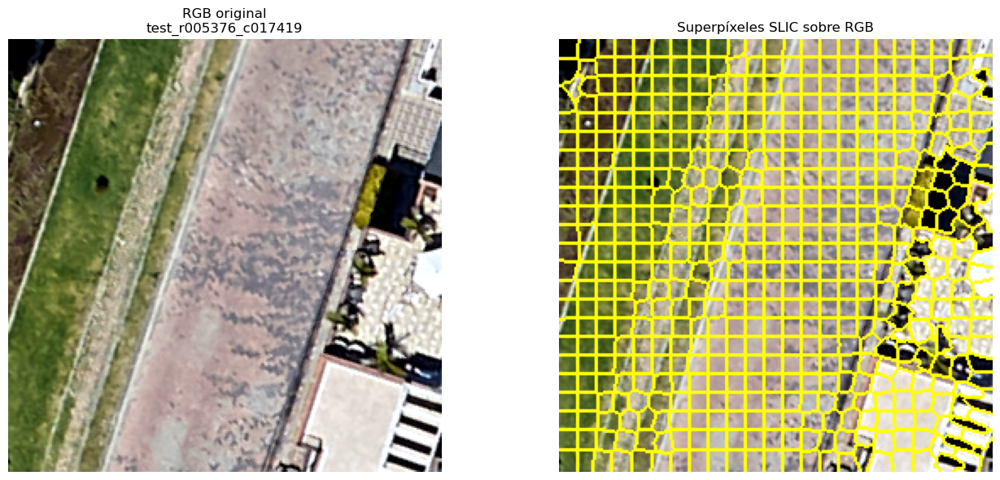

28167

In [185]:
# ============================================================
# FIGURA SLIC: RGB ORIGINAL + SUPERPÍXELES SOBRE RGB
# Compatible con SLIC_CFG como objeto o diccionario
# ============================================================

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import gc

from skimage.segmentation import slic, mark_boundaries

# ------------------------------------------------------------
# Función auxiliar para leer parámetros de configuración
# ------------------------------------------------------------
def cfg_get(cfg, name, default=None):
    if isinstance(cfg, dict):
        return cfg.get(name, default)
    return getattr(cfg, name, default)


# ------------------------------------------------------------
# Crear carpeta resultados
# ------------------------------------------------------------
RESULTADOS_DIR = Path("resultados")
RESULTADOS_DIR.mkdir(exist_ok=True)

# ------------------------------------------------------------
# 1. Seleccionar un tile representativo
# ------------------------------------------------------------
tile_uid_show = df_test_tile_classes.iloc[0]["tile_uid"]
tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]

# ------------------------------------------------------------
# 2. Leer datos del tile
# ------------------------------------------------------------
ortho_show, _, ndsm_show = read_tile_data(tile_row_show)
tile_vars_show = sanitize_tile_inputs(ortho_show, ndsm_show)

rgb_show = np.stack(
    [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
    axis=-1
)

rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

# ------------------------------------------------------------
# 3. Leer parámetros reales de SLIC_CFG
# ------------------------------------------------------------
n_segments = cfg_get(SLIC_CFG, "n_segments", 400)
compactness = cfg_get(SLIC_CFG, "compactness", 10.0)
sigma = cfg_get(SLIC_CFG, "sigma", 1.0)
convert2lab = cfg_get(SLIC_CFG, "convert2lab", False)

# Como SLIC_CFG no tiene use_height, lo inferimos:
# primero desde FEATURE_CFG si existe, y si no, desde height_weight.
use_height = cfg_get(SLIC_CFG, "use_height", None)

if use_height is None:
    use_height = cfg_get(FEATURE_CFG, "use_height", None)

height_weight = cfg_get(SLIC_CFG, "height_weight", 0.0)

if use_height is None:
    use_height = height_weight > 0

print("n_segments:", n_segments)
print("compactness:", compactness)
print("sigma:", sigma)
print("convert2lab:", convert2lab)
print("use_height inferido:", use_height)
print("height_weight:", height_weight)

# ------------------------------------------------------------
# 4. Construir entrada para SLIC
# ------------------------------------------------------------
height_key = None
for possible_key in ["HEIGHT", "height", "nDSM", "NDSM", "ndsm"]:
    if possible_key in tile_vars_show:
        height_key = possible_key
        break

if use_height and height_key is not None:
    height_show = tile_vars_show[height_key]

    height_show = np.nan_to_num(height_show, nan=0.0).astype(np.float32)

    h_min = np.nanpercentile(height_show, 2)
    h_max = np.nanpercentile(height_show, 98)

    height_norm = np.clip(height_show, h_min, h_max)
    height_norm = (height_norm - h_min) / (h_max - h_min + 1e-8)

    # Si no existe height_weight, usa 1.0
    if height_weight == 0.0:
        height_weight = 1.0

    height_norm = height_norm * height_weight

    slic_input = np.dstack([
        rgb_show[..., 0],
        rgb_show[..., 1],
        rgb_show[..., 2],
        height_norm
    ])

    # Con 4 canales no usar conversión Lab
    convert2lab_value = False

else:
    slic_input = rgb_show.copy()
    convert2lab_value = convert2lab

    if use_height and height_key is None:
        print("Advertencia: se indicó usar altura, pero no se encontró HEIGHT/nDSM en tile_vars_show.")
        print("Se ejecutará SLIC solo con RGB.")

# ------------------------------------------------------------
# 5. Ejecutar SLIC
# ------------------------------------------------------------
segments_show = slic(
    slic_input,
    n_segments=n_segments,
    compactness=compactness,
    sigma=sigma,
    start_label=1,
    convert2lab=convert2lab_value,
    channel_axis=-1
)

print("Número de superpíxeles generados:", int(segments_show.max()))

# ------------------------------------------------------------
# 6. Crear imagen con bordes de superpíxeles
# ------------------------------------------------------------
rgb_slic_boundaries = mark_boundaries(
    rgb_show,
    segments_show,
    color=(1, 1, 0),
    mode="thick"
)

# ------------------------------------------------------------
# 7. Graficar
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(rgb_show)
axes[0].set_title(f"RGB original\n{tile_uid_show}")
axes[0].axis("off")

axes[1].imshow(rgb_slic_boundaries)
axes[1].set_title("Superpíxeles SLIC sobre RGB")
axes[1].axis("off")

plt.tight_layout()

plt.savefig(
    RESULTADOS_DIR / "slic_superpixeles_sobre_rgb.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ------------------------------------------------------------
# 8. Liberar memoria
# ------------------------------------------------------------
del ortho_show, ndsm_show, tile_vars_show, rgb_show
del slic_input, segments_show, rgb_slic_boundaries
gc.collect()

In [187]:
print("SLIC_CFG:")
print(SLIC_CFG)

print("\nParámetros usados:")
print("n_segments:", n_segments)
print("compactness:", compactness)
print("sigma:", sigma)
print("convert2lab_value:", convert2lab_value)



SLIC_CFG:
SLICConfig(n_segments=500, compactness=1.0, sigma=1.0, start_label=1, channel_axis=-1)

Parámetros usados:
n_segments: 500
compactness: 1.0
sigma: 1.0
convert2lab_value: False


Cantidad de tiles con información: 235


,tile_uid,eval_pixels,gt_class_0_px,gt_class_1_px,gt_class_2_px,gt_class_3_px,gt_class_4_px,n_gt_classes_present,non_background_px,non_background_ratio,construction_ratio,pavement_ratio
0,test_r006912_c016651,65536,14226,460,48484,831,1535,5,51310,0.782928,0.007019,0.739807
1,test_r005376_c017419,65536,29684,6593,25113,982,3164,5,35852,0.547058,0.100601,0.383194
2,test_r007680_c016651,65536,30879,566,26560,1522,6009,5,34657,0.528824,0.008636,0.405273
3,test_r003840_c017931,65536,32706,4140,25696,1260,1734,5,32830,0.500946,0.063171,0.392090
4,test_r006912_c016907,65536,42943,2482,14606,1892,3613,5,22593,0.344742,0.037872,0.222870
5,test_r004608_c017419,65536,1529,0,26355,36968,684,4,64007,0.976669,0.000000,0.402145
6,test_r003840_c017675,65536,2469,0,25456,34777,2834,4,63067,0.962326,0.000000,0.388428
7,test_r005120_c017163,65536,3698,7168,34498,20172,0,4,61838,0.943573,0.109375,0.526398
8,test_r002816_c017163,65536,5394,0,29249,28646,2247,4,60142,0.917694,0.000000,0.446304
9,test_r002304_c016651,65536,8416,0,2500,54413,207,4,57120,0.871582,0.000000,0.038147



Tiles seleccionados para visualización:


,tile_uid,n_gt_classes_present,non_background_ratio,gt_class_1_px,gt_class_2_px,gt_class_3_px,gt_class_4_px
0,test_r006912_c016651,5,0.782928,460,48484,831,1535
78,test_r008704_c017931,3,0.868729,47096,9837,0,0
156,test_r011008_c018187,3,0.654312,0,38582,4299,0
234,test_r006656_c017163,3,0.202301,12258,1000,0,0


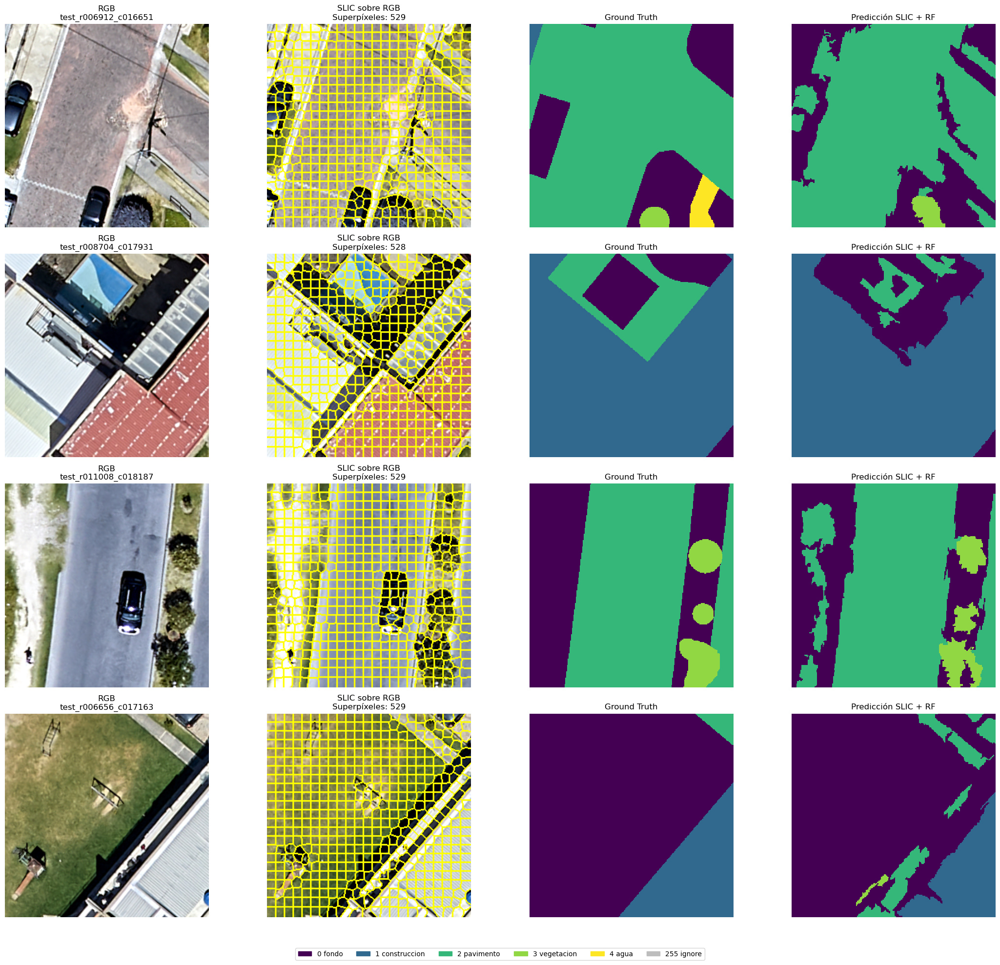

In [190]:
# ============================================================
# VISUALIZACIÓN DE 4 TILES CON INFORMACIÓN
# RGB + SLIC + GROUND TRUTH + PREDICCIÓN SLIC+RF
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gc
import rasterio
from skimage.segmentation import slic, mark_boundaries
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

# ------------------------------------------------------------
# Función auxiliar para leer parámetros desde dict u objeto
# ------------------------------------------------------------
def cfg_get(cfg, name, default=None):
    if isinstance(cfg, dict):
        return cfg.get(name, default)
    return getattr(cfg, name, default)

# ------------------------------------------------------------
# Crear carpeta resultados
# ------------------------------------------------------------
RESULTADOS_DIR = Path("resultados")
RESULTADOS_DIR.mkdir(exist_ok=True)

# ------------------------------------------------------------
# 1. Enriquecer tabla de diagnóstico
# ------------------------------------------------------------
df_info = df_test_tile_classes.copy()

# píxeles que NO son fondo
df_info["non_background_px"] = (
    df_info["gt_class_1_px"] +
    df_info["gt_class_2_px"] +
    df_info["gt_class_3_px"] +
    df_info["gt_class_4_px"]
)

# proporción de no fondo respecto a píxeles evaluables
df_info["non_background_ratio"] = df_info["non_background_px"] / df_info["eval_pixels"]

# proporción de construcción
df_info["construction_ratio"] = df_info["gt_class_1_px"] / df_info["eval_pixels"]

# proporción de pavimento
df_info["pavement_ratio"] = df_info["gt_class_2_px"] / df_info["eval_pixels"]

# ------------------------------------------------------------
# 2. Filtrar tiles "con información"
# Ajusta estos umbrales según quieras
# ------------------------------------------------------------
df_info_filtered = df_info[
    (df_info["n_gt_classes_present"] >= 3) &         # al menos 3 clases
    (df_info["non_background_ratio"] >= 0.20) &      # al menos 20% no fondo
    ((df_info["gt_class_1_px"] >= 500) |             # o suficiente construcción
     (df_info["gt_class_2_px"] >= 500) |             # o suficiente pavimento
     (df_info["gt_class_3_px"] >= 500) |             # o suficiente vegetación
     (df_info["gt_class_4_px"] >= 200))              # o algo de agua
].copy()

# ordenar los más informativos arriba
df_info_filtered = df_info_filtered.sort_values(
    by=["n_gt_classes_present", "non_background_ratio", "gt_class_1_px", "eval_pixels"],
    ascending=[False, False, False, False]
).reset_index(drop=True)

print("Cantidad de tiles con información:", len(df_info_filtered))
display(df_info_filtered.head(10))

# ------------------------------------------------------------
# 3. Escoger 4 tiles distribuidos dentro de los informativos
# ------------------------------------------------------------
n_show = 4

if len(df_info_filtered) == 0:
    print("No se encontraron tiles que cumplan los criterios de información.")
else:
    if len(df_info_filtered) <= n_show:
        df_tiles_show = df_info_filtered.copy()
    else:
        idxs = np.linspace(0, len(df_info_filtered) - 1, n_show, dtype=int)
        df_tiles_show = df_info_filtered.iloc[idxs].copy()

    print("\nTiles seleccionados para visualización:")
    display(df_tiles_show[[
        "tile_uid",
        "n_gt_classes_present",
        "non_background_ratio",
        "gt_class_1_px",
        "gt_class_2_px",
        "gt_class_3_px",
        "gt_class_4_px"
    ]])

    # --------------------------------------------------------
    # 4. Parámetros SLIC
    # --------------------------------------------------------
    n_segments = cfg_get(SLIC_CFG, "n_segments", 400)
    compactness = cfg_get(SLIC_CFG, "compactness", 10.0)
    sigma = cfg_get(SLIC_CFG, "sigma", 1.0)
    convert2lab = cfg_get(SLIC_CFG, "convert2lab", False)

    use_height = cfg_get(SLIC_CFG, "use_height", None)
    if use_height is None:
        use_height = cfg_get(FEATURE_CFG, "use_height", None)

    height_weight = cfg_get(SLIC_CFG, "height_weight", 0.0)

    if use_height is None:
        use_height = height_weight > 0

    # --------------------------------------------------------
    # 5. Paleta discreta
    # --------------------------------------------------------
    class_colors = [
        "#440154",  # 0 fondo
        "#31688e",  # 1 construccion
        "#35b779",  # 2 pavimento
        "#90d743",  # 3 vegetacion
        "#fde725",  # 4 agua
        "#bdbdbd",  # 255 ignore
    ]

    cmap = ListedColormap(class_colors)
    norm = BoundaryNorm(boundaries=np.arange(-0.5, 6.5, 1), ncolors=cmap.N)

    # --------------------------------------------------------
    # 6. Figura: filas = tiles, columnas = RGB / SLIC / GT / Pred
    # --------------------------------------------------------
    fig, axes = plt.subplots(len(df_tiles_show), 4, figsize=(22, 5 * len(df_tiles_show)), squeeze=False)

    for i, (_, row_sel) in enumerate(df_tiles_show.iterrows()):

        tile_uid_show = row_sel["tile_uid"]
        tile_row_show = df_tiles[df_tiles["tile_uid"] == tile_uid_show].iloc[0]
        window_show = tile_row_to_window(tile_row_show)

        # ----------------------------------------------------
        # Leer GT y predicción
        # ----------------------------------------------------
        with rasterio.open(PATHS.mask_fp) as src_gt, rasterio.open(TEST_PRED_RASTER_FP) as src_pred:
            gt_show = src_gt.read(1, window=window_show).astype(np.uint8, copy=False)
            pred_show = src_pred.read(1, window=window_show).astype(np.uint8, copy=False)

        # ----------------------------------------------------
        # Leer RGB
        # ----------------------------------------------------
        ortho_show, _, ndsm_show = read_tile_data(tile_row_show)
        tile_vars_show = sanitize_tile_inputs(ortho_show, ndsm_show)

        rgb_show = np.stack(
            [tile_vars_show["R"], tile_vars_show["G"], tile_vars_show["B"]],
            axis=-1
        )
        rgb_show = stretch_rgb(np.nan_to_num(rgb_show, nan=0.0))

        # ----------------------------------------------------
        # Buscar canal de altura si existe
        # ----------------------------------------------------
        height_key = None
        for possible_key in ["HEIGHT", "height", "nDSM", "NDSM", "ndsm"]:
            if possible_key in tile_vars_show:
                height_key = possible_key
                break

        # ----------------------------------------------------
        # Construir entrada SLIC
        # ----------------------------------------------------
        if use_height and height_key is not None:
            height_show = tile_vars_show[height_key]
            height_show = np.nan_to_num(height_show, nan=0.0).astype(np.float32)

            h_min = np.nanpercentile(height_show, 2)
            h_max = np.nanpercentile(height_show, 98)

            height_norm = np.clip(height_show, h_min, h_max)
            height_norm = (height_norm - h_min) / (h_max - h_min + 1e-8)

            if height_weight == 0.0:
                height_weight_local = 1.0
            else:
                height_weight_local = height_weight

            height_norm = height_norm * height_weight_local

            slic_input = np.dstack([
                rgb_show[..., 0],
                rgb_show[..., 1],
                rgb_show[..., 2],
                height_norm
            ])
            convert2lab_value = False
        else:
            slic_input = rgb_show.copy()
            convert2lab_value = convert2lab

        # ----------------------------------------------------
        # Ejecutar SLIC para visualización
        # ----------------------------------------------------
        segments_show = slic(
            slic_input,
            n_segments=n_segments,
            compactness=compactness,
            sigma=sigma,
            start_label=1,
            convert2lab=convert2lab_value,
            channel_axis=-1
        )

        rgb_slic_boundaries = mark_boundaries(
            rgb_show,
            segments_show,
            color=(1, 1, 0),
            mode="thick"
        )

        # ----------------------------------------------------
        # Preparar GT y pred para visualización discreta
        # ----------------------------------------------------
        gt_vis = np.full(gt_show.shape, 5, dtype=np.uint8)
        pred_vis = np.full(pred_show.shape, 5, dtype=np.uint8)

        for cls in VALID_CLASSES:
            gt_vis[gt_show == cls] = cls
            pred_vis[pred_show == cls] = cls

        # ----------------------------------------------------
        # Graficar fila i
        # ----------------------------------------------------
        axes[i, 0].imshow(rgb_show)
        axes[i, 0].set_title(f"RGB\n{tile_uid_show}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(rgb_slic_boundaries)
        axes[i, 1].set_title(f"SLIC sobre RGB\nSuperpíxeles: {int(segments_show.max())}")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(gt_vis, cmap=cmap, norm=norm, interpolation="nearest")
        axes[i, 2].set_title("Ground Truth")
        axes[i, 2].axis("off")

        axes[i, 3].imshow(pred_vis, cmap=cmap, norm=norm, interpolation="nearest")
        axes[i, 3].set_title("Predicción SLIC + RF")
        axes[i, 3].axis("off")

        # liberar memoria
        del gt_show, pred_show, ortho_show, ndsm_show, tile_vars_show
        del rgb_show, slic_input, segments_show, rgb_slic_boundaries
        del gt_vis, pred_vis
        gc.collect()

    # --------------------------------------------------------
    # 7. Leyenda general
    # --------------------------------------------------------
    legend_patches = [
        mpatches.Patch(color=class_colors[0], label="0 fondo"),
        mpatches.Patch(color=class_colors[1], label="1 construccion"),
        mpatches.Patch(color=class_colors[2], label="2 pavimento"),
        mpatches.Patch(color=class_colors[3], label="3 vegetacion"),
        mpatches.Patch(color=class_colors[4], label="4 agua"),
        mpatches.Patch(color=class_colors[5], label="255 ignore"),
    ]

    fig.legend(
        handles=legend_patches,
        loc="lower center",
        ncol=6,
        bbox_to_anchor=(0.5, 0.01)
    )

    plt.tight_layout(rect=[0, 0.05, 1, 1])

    plt.savefig(
        RESULTADOS_DIR / "4_tiles_con_informacion_rgb_slic_gt_pred.png",
        dpi=300,
        bbox_inches="tight"
    )
    fig.savefig(
    RESULTADOS_DIR / "4_tiles_con_informacion_rgb_slic_gt_pred.png",
    dpi=300,
    bbox_inches="tight"
)
    plt.show()